# EDA (Allboas dataset)

## MODULES & LIBRARIES

In [1]:
# IMPORT MODULES

# Base -----------------------------------------------------------
import numpy as np
import pandas as pd
from scipy.stats import norm
from datetime import datetime
#import pandas_profiling

# Viz ------------------------------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns
import plotnine
from plotnine import *
#import patchworklib as pw

In [2]:
from plotnine import *
import pandas as pd
import numpy as np

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## ANALYSIS / INSIGHTS (2021 sample)

#### LOADING THE DATASET

In [ ]:
#file_path = 'C:/Users/FAL/Desktop/QEnergy/Data/data_2021.csv'
file_path = '/content/drive/MyDrive/QEnergy/Data/data_2021.csv'

In [ ]:
data_2021 = pd.read_csv(file_path)
data_2021.insert(loc=9, column='totalcost', value=data_2021['acceptedprice']*abs(data_2021['acceptedvolume']))
data_2021

,recordtype,settlementdate,settlementdate_year,settlementdate_month,settlementdate_day,settlementperiod,BMU ID,acceptedprice,acceptedvolume,totalcost,...,Transmission Loss Factor,Generation Capacity,Demand Capacity,Credit Assessment Load Factor,BMU Credit Assessment Export Capability,BMU Credit Assessment Import Capability,Exempt Export Flag,Base TU Flag,FPN Flag,Interconnector
0,BID,2021-01-01,2021,1,1,1,E_GYAR-1,37.0,-18.366,679.5420,...,0.004895,420.0,-18.000,NaN,NaN,NaN,False (F),False (F),True (T),NaN
1,BID,2021-01-01,2021,1,1,1,E_SHOS-1,35.0,-0.666,23.3100,...,0.012051,436.0,-16.000,NaN,NaN,NaN,False (F),False (F),True (T),NaN
2,BID,2021-01-01,2021,1,1,1,T_CDCL-1,40.0,-11.084,443.3600,...,0.005473,445.0,-12.000,NaN,NaN,NaN,False (F),False (F),True (T),NaN
3,BID,2021-01-01,2021,1,1,1,T_MRWD-1,37.1,-174.768,6483.8928,...,0.017790,920.0,-15.000,NaN,NaN,NaN,False (F),False (F),True (T),NaN
4,BID,2021-01-01,2021,1,1,1,T_PEMB-11,37.0,-33.634,1244.4580,...,0.009636,475.0,-11.000,NaN,NaN,NaN,False (F),False (F),True (T),NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
473998,OFFER,2021-12-31,2021,12,31,48,T_DRAXX-3,230.0,255.832,58841.3600,...,-0.039813,70.0,-2.000,NaN,NaN,NaN,False (F),False (F),True (T),NaN
473999,OFFER,2021-12-31,2021,12,31,48,T_KEAD-1,450.0,350.000,157500.0000,...,-0.039813,29.0,-8.000,NaN,NaN,NaN,False (F),True (T),True (T),NaN
474000,OFFER,2021-12-31,2021,12,31,48,T_PEMB-51,250.0,65.000,16250.0000,...,-0.039813,37.6,-0.349,NaN,NaN,NaN,True (T),True (T),True (T),NaN
474001,OFFER,2021-12-31,2021,12,31,48,T_STAY-4,235.0,53.032,12462.5200,...,-0.039813,48.0,-1.000,NaN,NaN,NaN,True (T),True (T),True (T),NaN


In [ ]:
drop_cols = ['Credit Assessment Load Factor','BMU Credit Assessment Export Capability',
             'BMU Credit Assessment Import Capability','Exempt Export Flag','Interconnector']
data_2021 = data_2021.drop(drop_cols, axis=1)

In [ ]:
data_2021['settlementdate'] = pd.to_datetime(data_2021['settlementdate'])
data_2021['settlementdate_year'] = data_2021['settlementdate_year'].astype('category')
data_2021['settlementdate_month'] = data_2021['settlementdate_month'].astype('category')
data_2021['settlementdate_day'] = data_2021['settlementdate_day'].astype('category')
data_2021['settlementperiod'] = data_2021['settlementperiod'].astype('category')

In [ ]:
data_2021.columns

Index(['recordtype', 'settlementdate', 'settlementdate_year',
       'settlementdate_month', 'settlementdate_day', 'settlementperiod',
       'BMU ID', 'acceptedprice', 'acceptedvolume', 'totalcost', 'BMU Type',
       'BMU Fuel Type', 'BMU GSP Group Id', 'BMU GSP Group Name', 'LOC LAT',
       'LOC LONG', 'GSP LOC Center', 'LOC Center LAT', 'LOC Center LONG',
       'BMU Party ID', 'BMU Party Name', 'Trading Unit', 'PC Flag',
       'PC Status', 'Transmission Loss Factor', 'Generation Capacity',
       'Demand Capacity', 'Base TU Flag', 'FPN Flag'],
      dtype='object')

In [ ]:
data_2021.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 474003 entries, 0 to 474002
Data columns (total 29 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   recordtype                474003 non-null  object        
 1   settlementdate            474003 non-null  datetime64[ns]
 2   settlementdate_year       474003 non-null  category      
 3   settlementdate_month      474003 non-null  category      
 4   settlementdate_day        474003 non-null  category      
 5   settlementperiod          474003 non-null  category      
 6   BMU ID                    474003 non-null  object        
 7   acceptedprice             474003 non-null  float64       
 8   acceptedvolume            474003 non-null  float64       
 9   totalcost                 474003 non-null  float64       
 10  BMU Type                  474003 non-null  object        
 11  BMU Fuel Type             474003 non-null  object        
 12  BM

In [ ]:
data_2021[(data_2021['BMU Party ID'].str.contains('Stat'))&(data_2021['BMU Fuel Type']=='BATTERY')]

,recordtype,settlementdate,settlementdate_year,settlementdate_month,settlementdate_day,settlementperiod,BMU ID,acceptedprice,acceptedvolume,totalcost,...,BMU Party ID,BMU Party Name,Trading Unit,PC Flag,PC Status,Transmission Loss Factor,Generation Capacity,Demand Capacity,Base TU Flag,FPN Flag
57248,BID,2021-03-11,2021,3,11,36,2__MSTAT001,13.630,-3.284,44.76092,...,Statkraft Markets Gmbh,STATKRA1,DEFAULT__M,NaN,Consumption (C),-0.006038,50.0,-50.0,True (T),True (T)
57448,BID,2021-03-11,2021,3,11,40,2__MSTAT001,12.785,-1.434,18.33369,...,Statkraft Markets Gmbh,STATKRA1,DEFAULT__M,NaN,Consumption (C),-0.006038,50.0,-50.0,True (T),True (T)
58699,BID,2021-03-12,2021,3,12,17,2__MSTAT001,21.460,-6.758,145.02668,...,Statkraft Markets Gmbh,STATKRA1,DEFAULT__M,NaN,Consumption (C),-0.006038,50.0,-50.0,True (T),True (T)
58854,BID,2021-03-12,2021,3,12,22,2__MSTAT001,9.980,-17.050,170.15900,...,Statkraft Markets Gmbh,STATKRA1,DEFAULT__M,NaN,Consumption (C),-0.006038,50.0,-50.0,True (T),True (T)
59050,BID,2021-03-12,2021,3,12,28,2__MSTAT001,16.435,-18.332,301.28642,...,Statkraft Markets Gmbh,STATKRA1,DEFAULT__M,NaN,Consumption (C),-0.006038,50.0,-50.0,True (T),True (T)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
464434,OFFER,2021-12-09,2021,12,9,26,T_KEMB-1,350.000,3.834,1341.90000,...,Statkraft Markets Gmbh,STATKRA1,DEFAULT__D,NaN,Consumption (C),0.003728,20.0,0.0,True (T),True (T)
468758,OFFER,2021-12-17,2021,12,17,19,2__MSTAT001,530.820,18.334,9732.05388,...,Statkraft Markets Gmbh,STATKRA1,DEFAULT__E,NaN,Consumption (C),0.019988,20.0,-2.0,True (T),True (T)
469091,OFFER,2021-12-18,2021,12,18,21,2__ALOND002,400.000,49.000,19600.00000,...,Statkraft Markets Gmbh,STATKRA1,DEFAULT__G,NaN,Consumption (C),-0.002167,20.0,-2.0,True (T),True (T)
469112,OFFER,2021-12-18,2021,12,18,21,T_KEMB-1,400.000,36.750,14700.00000,...,Statkraft Markets Gmbh,STATKRA1,DEFAULT__G,NaN,Consumption (C),-0.002167,20.0,-2.0,True (T),True (T)


#### 1.1. BIDS: VALORES MEDIOS, MÍNIMOS Y MÁXIMOS DE PRECIO&VOLUMEN + Nº OFERTAS (POR ZONA)

Uno de los mayores drivers es la localización (volumen medio, precio medio, precio por volumen, precio máximo, número de ofertas aprobadas)

Estacionalidad, Tendencia


##### - Dataset

In [ ]:
data_2021_BID = data_2021[data_2021['recordtype']=='BID']
data_2021_BID.insert(loc=7, column='nr', value=1)
data_2021_BID.head()

,recordtype,settlementdate,settlementdate_year,settlementdate_month,settlementdate_day,settlementperiod,BMU ID,nr,acceptedprice,acceptedvolume,...,BMU Party ID,BMU Party Name,Trading Unit,PC Flag,PC Status,Transmission Loss Factor,Generation Capacity,Demand Capacity,Base TU Flag,FPN Flag
0,BID,2021-01-01,2021,1,1,1,E_GYAR-1,1,37.0,-18.366,...,RWE Generation UK plc,INNOGY01,NaN,NaN,Production (P),0.004895,420.0,-18.0,False (F),True (T)
1,BID,2021-01-01,2021,1,1,1,E_SHOS-1,1,35.0,-0.666,...,VPI Power Limited,SPGEN01,NaN,NaN,Production (P),0.012051,436.0,-16.0,False (F),True (T)
2,BID,2021-01-01,2021,1,1,1,T_CDCL-1,1,40.0,-11.084,...,Uniper UK Limited,EECL,NaN,NaN,Production (P),0.005473,445.0,-12.0,False (F),True (T)
3,BID,2021-01-01,2021,1,1,1,T_MRWD-1,1,37.1,-174.768,...,Marchwood Power Limited,MPL,NaN,NaN,Production (P),0.017790,920.0,-15.0,False (F),True (T)
4,BID,2021-01-01,2021,1,1,1,T_PEMB-11,1,37.0,-33.634,...,RWE Generation UK plc,INNOGY01,Pembroke Power Station,NaN,Production (P),0.009636,475.0,-11.0,False (F),True (T)


In [ ]:
selected_cols = ['recordtype', 'settlementdate','settlementperiod', 'nr',
                 'acceptedvolume', 'totalcost', 'BMU GSP Group Name']

In [ ]:
aggregate_cols = ['settlementdate', 'settlementperiod', 'BMU GSP Group Name']

In [ ]:
data_df = pd.pivot_table(data_2021_BID[selected_cols],
                         index=aggregate_cols, 
                         aggfunc={'nr':'sum', 'acceptedvolume':'sum', 'totalcost':'sum'})

data_df = data_df.rename(columns={'acceptedvolume':'totalvolume'})
data_df = data_df.reset_index()
data_df.insert(loc=4, column='averageprice', value=data_df['totalcost']/data_df['totalvolume'])
data_df = data_df[['settlementdate',	'settlementperiod', 'BMU GSP Group Name', 'nr', 'totalvolume',	'averageprice',	'totalcost']]
data_df = data_df.fillna(0)
data_df

,settlementdate,settlementperiod,BMU GSP Group Name,nr,totalvolume,averageprice,totalcost
0,2021-01-01,1,East Midlands,1,-11.084,-40.000000,443.36000
1,2021-01-01,1,Eastern England,1,-18.366,-37.000000,679.54200
2,2021-01-01,1,London,0,0.000,0.000000,0.00000
3,2021-01-01,1,Merseyside and Northern Wales,0,0.000,0.000000,0.00000
4,2021-01-01,1,North Eastern England,0,0.000,0.000000,0.00000
...,...,...,...,...,...,...,...
245275,2021-12-31,48,Southern England,1,-6.500,19.000000,-123.50000
245276,2021-12-31,48,Southern Scotland,6,-105.008,62.267627,-6538.59902
245277,2021-12-31,48,Southern Wales,1,-1.244,80.000000,-99.52000
245278,2021-12-31,48,West Midlands,1,-21.334,-1.030000,21.97402


In [ ]:
data_df.insert(loc=1, column='settlementdate_year', value=data_df['settlementdate'].dt.year)

order = list(data_df['settlementdate_year'].unique())
order.sort()
data = data_df['settlementdate_year']
data_df['settlementdate_year'] = pd.Categorical(data, order, ordered=True)

In [ ]:
data_df.insert(loc=2, column='settlementdate_month', value=data_df['settlementdate'].dt.month)

order = list(data_df['settlementdate_month'].unique())
order.sort()
data = data_df['settlementdate_month']
data_df['settlementdate_month'] = pd.Categorical(data, order, ordered=True)

In [ ]:
data_df.insert(loc=3, column='settlementdate_day', value=data_df['settlementdate'].dt.day)

order = list(data_df['settlementdate_day'].unique())
order.sort()
data = data_df['settlementdate_day']
data_df['settlementdate_day'] = pd.Categorical(data, order, ordered=True)


In [ ]:
data_df

,settlementdate,settlementdate_year,settlementdate_month,settlementdate_day,settlementperiod,BMU GSP Group Name,nr,totalvolume,averageprice,totalcost
0,2021-01-01,2021,1,1,1,East Midlands,1,-11.084,-40.000000,443.36000
1,2021-01-01,2021,1,1,1,Eastern England,1,-18.366,-37.000000,679.54200
2,2021-01-01,2021,1,1,1,London,0,0.000,0.000000,0.00000
3,2021-01-01,2021,1,1,1,Merseyside and Northern Wales,0,0.000,0.000000,0.00000
4,2021-01-01,2021,1,1,1,North Eastern England,0,0.000,0.000000,0.00000
...,...,...,...,...,...,...,...,...,...,...
245275,2021-12-31,2021,12,31,48,Southern England,1,-6.500,19.000000,-123.50000
245276,2021-12-31,2021,12,31,48,Southern Scotland,6,-105.008,62.267627,-6538.59902
245277,2021-12-31,2021,12,31,48,Southern Wales,1,-1.244,80.000000,-99.52000
245278,2021-12-31,2021,12,31,48,West Midlands,1,-21.334,-1.030000,21.97402


##### - Summary table

In [ ]:
data_df.head()

,settlementdate,settlementdate_year,settlementdate_month,settlementdate_day,settlementperiod,BMU GSP Group Name,nr,totalvolume,averageprice,totalcost
0,2021-01-01,2021,1,1,1,East Midlands,1,-11.084,-40.0,443.360
1,2021-01-01,2021,1,1,1,Eastern England,1,-18.366,-37.0,679.542
2,2021-01-01,2021,1,1,1,London,0,0.000,0.0,0.000
3,2021-01-01,2021,1,1,1,Merseyside and Northern Wales,0,0.000,0.0,0.000
4,2021-01-01,2021,1,1,1,North Eastern England,0,0.000,0.0,0.000


In [ ]:
cols = ['settlementdate_year', 'settlementdate_month', 'BMU GSP Group Name',
        'nr', 'perc_nr_month', 'avg_price', 'med_price', 'max_price', 'min_price', 
        'avg_volume', 'med_volume', 'max_volume', 'min_volume',
        'avg_cost', 'med_cost', 'max_cost', 'min_cost']

In [ ]:
summary_month = pd.DataFrame(columns=cols)
summary_month

,settlementdate_year,settlementdate_month,BMU GSP Group Name,nr,perc_nr_month,avg_price,med_price,max_price,min_price,avg_volume,med_volume,max_volume,min_volume,avg_cost,med_cost,max_cost,min_cost


In [ ]:
years = list(data_df['settlementdate_year'].unique())
months = list(data_df['settlementdate_month'].unique())
gsp_groups = list(data_df['BMU GSP Group Name'].unique())

In [ ]:
i = 0

for x in years:
  for y in months:

    df_month = data_df[(data_df['settlementdate_year']==x)&(data_df['settlementdate_month']==y)&(data_df['totalvolume']!=0)]
    nr_month = round(df_month['nr'].sum(), 0)

    for z in gsp_groups:

      df = data_df[(data_df['settlementdate_year']==x)&(data_df['settlementdate_month']==y)&(data_df['BMU GSP Group Name']==z)&(data_df['totalvolume']!=0)]

      summary_month.loc[i,'settlementdate_year'] = x
      summary_month.loc[i,'settlementdate_month'] = y
      summary_month.loc[i,'BMU GSP Group Name'] = z
      summary_month.loc[i,'nr'] = round(df['nr'].sum(), 0)
      if nr_month != 0:
        summary_month.loc[i,'perc_nr_month'] = round(df['nr'].sum() / nr_month * 100, 2)
      summary_month.loc[i,'avg_price'] = round(df['averageprice'].mean(), 2)
      summary_month.loc[i,'med_price'] = round(df['averageprice'].median(), 2)
      summary_month.loc[i,'max_price'] = round(df['averageprice'].max(), 2)
      summary_month.loc[i,'min_price'] = round(df['averageprice'].min(), 2)
      summary_month.loc[i,'avg_volume'] = round(df['totalvolume'].mean(), 3)
      summary_month.loc[i,'med_volume'] = round(df['totalvolume'].median(), 3)
      summary_month.loc[i,'max_volume'] = round(df['totalvolume'].max(), 3)
      summary_month.loc[i,'min_volume'] = round(df['totalvolume'].min(), 3)
      summary_month.loc[i,'avg_cost'] = round(df['totalcost'].mean(), 2)
      summary_month.loc[i,'med_cost'] = round(df['totalcost'].median(), 2)
      summary_month.loc[i,'max_cost'] = round(df['totalcost'].max(), 2)
      summary_month.loc[i,'min_cost'] = round(df['totalcost'].min(), 2)
      summary_month.loc[i,'totalcost'] = round(df['totalcost'].sum(), 2)

      i += 1

summary_month = summary_month.fillna(0)

In [ ]:
summary_month

,settlementdate_year,settlementdate_month,BMU GSP Group Name,nr,perc_nr_month,avg_price,med_price,max_price,min_price,avg_volume,med_volume,max_volume,min_volume,avg_cost,med_cost,max_cost,min_cost,totalcost
0,2021,1,East Midlands,2372,13.42,-40.22,-42.64,-0.00,-85.00,-164.070,-100.758,-0.001,-1213.358,6595.96,3675.80,50234.38,0.00,5837426.96
1,2021,1,Eastern England,675,3.82,-34.98,-45.50,140.51,-97.97,-82.207,-65.034,-0.002,-439.386,2213.93,2375.76,22653.61,-39058.86,1162312.28
2,2021,1,London,5,0.03,-75.00,-75.00,-75.00,-75.00,-14.498,-12.034,-0.008,-33.166,1087.38,902.55,2487.45,0.60,5436.90
3,2021,1,Merseyside and Northern Wales,1206,6.82,-24.81,-30.00,160.24,-76.20,-86.855,-47.766,-0.001,-653.458,2483.94,550.00,29461.58,-16114.85,1557428.16
4,2021,1,North Eastern England,5,0.03,-35.68,-61.17,52.00,-66.05,-1.100,-1.200,-0.008,-2.934,68.19,79.26,179.47,-0.42,340.97
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163,2021,12,Southern England,861,3.27,-150.48,-145.69,54.50,-420.00,-95.755,-79.842,-0.001,-427.966,14439.14,9490.34,83737.50,-340.62,9963009.20
164,2021,12,Southern Scotland,2780,10.55,108.52,59.91,9999.00,-260.00,-394.687,-274.122,-0.748,-1534.714,-25414.01,-17305.75,3410.00,-111711.67,-8640763.58
165,2021,12,Southern Wales,833,3.16,-114.04,-110.50,80.00,-290.00,-117.788,-48.919,-0.001,-953.000,10164.80,4942.59,105134.40,-15680.00,4574159.87
166,2021,12,West Midlands,154,0.58,-156.88,-166.00,-0.32,-420.00,-11.739,-6.334,-0.002,-48.334,1922.67,861.00,11319.00,0.42,255715.57


In [ ]:
cols = ['settlementdate_year', 'BMU GSP Group Name',
        'nr', 'perc_nr_year', 'avg_price', 'med_price', 'max_price', 'min_price', 
        'avg_volume', 'med_volume', 'max_volume', 'min_volume',
        'avg_cost', 'med_cost', 'max_cost', 'min_cost']

In [ ]:
summary_year = pd.DataFrame(columns=cols)
summary_year

,settlementdate_year,BMU GSP Group Name,nr,perc_nr_year,avg_price,med_price,max_price,min_price,avg_volume,med_volume,max_volume,min_volume,avg_cost,med_cost,max_cost,min_cost


In [ ]:
years = list(data_df['settlementdate_year'].unique())
gsp_groups = list(data_df['BMU GSP Group Name'].unique())

In [ ]:
i = 0

for x in years:

  df_year = data_df[(data_df['settlementdate_year']==x)&(data_df['totalvolume']!=0)]
  nr_year = round(df_year['nr'].sum(), 0)

  for z in gsp_groups:

    df = data_df[(data_df['settlementdate_year']==x)&(data_df['BMU GSP Group Name']==z)&(data_df['totalvolume']!=0)]

    summary_year.loc[i,'settlementdate_year'] = x
    summary_year.loc[i,'BMU GSP Group Name'] = z
    summary_year.loc[i,'nr'] = round(df['nr'].sum(), 0)
    if nr_year != 0:
      summary_year.loc[i,'perc_nr_year'] = round(df['nr'].sum() / nr_year * 100, 2)
    summary_year.loc[i,'avg_price'] = round(df['averageprice'].mean(), 2)
    summary_year.loc[i,'med_price'] = round(df['averageprice'].median(), 2)
    summary_year.loc[i,'max_price'] = round(df['averageprice'].max(), 2)
    summary_year.loc[i,'min_price'] = round(df['averageprice'].min(), 2)
    summary_year.loc[i,'avg_volume'] = round(df['totalvolume'].mean(), 3)
    summary_year.loc[i,'med_volume'] = round(df['totalvolume'].median(), 3)
    summary_year.loc[i,'max_volume'] = round(df['totalvolume'].max(), 3)
    summary_year.loc[i,'min_volume'] = round(df['totalvolume'].min(), 3)
    summary_year.loc[i,'avg_cost'] = round(df['totalcost'].mean(), 2)
    summary_year.loc[i,'med_cost'] = round(df['totalcost'].median(), 2)
    summary_year.loc[i,'max_cost'] = round(df['totalcost'].max(), 2)
    summary_year.loc[i,'min_cost'] = round(df['totalcost'].min(), 2)
    summary_year.loc[i,'totalcost'] = round(df['totalcost'].sum(), 2)

    i += 1

summary_year = summary_year.fillna(0)

In [ ]:
summary_year

,settlementdate_year,BMU GSP Group Name,nr,perc_nr_year,avg_price,med_price,max_price,min_price,avg_volume,med_volume,max_volume,min_volume,avg_cost,med_cost,max_cost,min_cost,totalcost
0,2021,East Midlands,21875,8.28,-63.77,-49.25,148.68,-293.84,-130.402,-78.990,-0.001,-1213.358,8777.97,3857.93,165250.00,-29391.66,8.784994e+07
1,2021,Eastern England,6033,2.28,-57.00,-50.00,9999.00,-361.34,-58.651,-30.875,-0.001,-680.000,3420.13,1530.12,86039.67,-47545.60,1.608827e+07
2,2021,London,1045,0.40,-94.86,-96.60,-0.00,-265.00,-54.285,-40.012,-0.001,-273.834,5317.41,2698.42,30395.57,0.00,5.535426e+06
3,2021,Merseyside and Northern Wales,15143,5.73,-43.52,-41.36,177.71,-286.90,-95.271,-66.775,-0.001,-1018.582,4935.21,1725.09,189893.42,-50752.50,4.074506e+07
4,2021,North Eastern England,46,0.02,-34.09,-61.17,52.00,-177.96,-0.528,-0.350,-0.008,-2.934,19.99,2.84,179.47,-52.00,9.195400e+02
5,2021,North Western England,12350,4.67,-57.03,-47.47,195.93,-500.00,-106.014,-50.832,-0.001,-1200.368,4800.83,2036.93,125621.57,-182541.82,3.253521e+07
6,2021,Northern Scotland,81368,30.79,8.47,7.09,100.59,-653.49,-634.256,-378.768,-0.001,-3875.664,-20174.83,-240.97,180520.23,-218880.12,-1.521989e+08
7,2021,South Eastern England,17783,6.73,-63.44,-48.07,456.66,-282.05,-105.008,-70.000,-0.001,-905.002,7281.38,3542.80,134955.26,-54635.30,7.119003e+07
8,2021,South Western England,8148,3.08,-70.27,-53.25,4171.45,-285.00,-102.222,-97.984,-0.001,-731.966,8116.48,4213.57,146807.29,-20164.77,5.331713e+07
9,2021,Southern England,16281,6.16,-50.75,-41.00,75.95,-420.00,-139.480,-125.416,-0.001,-834.600,6570.55,4358.70,83737.50,-510.77,7.247973e+07


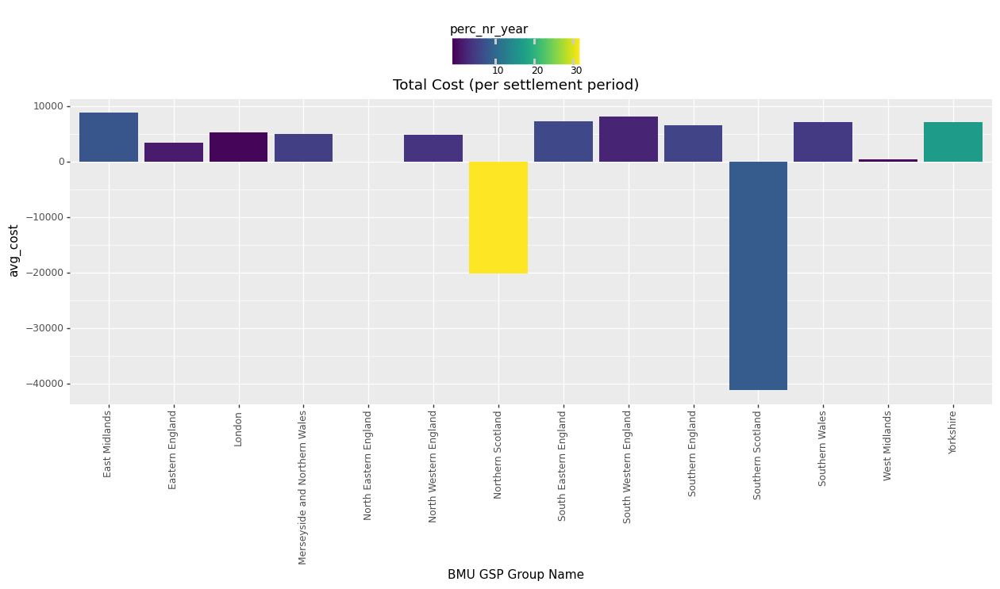

<ggplot: (8771697675334)>

In [ ]:
(ggplot(summary_year) 
 + aes(x="BMU GSP Group Name", y="avg_cost", fill='perc_nr_year')
 + geom_bar(stat='identity', size=3)
 + theme(axis_text_x=element_text(rotation=90))
 + ggtitle('Total Cost (per settlement period)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 5), legend_position='top')
)

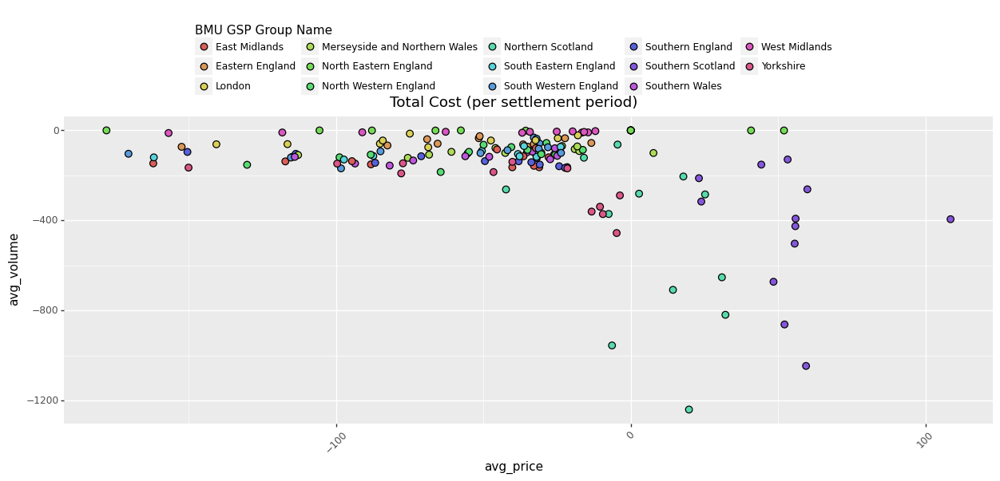

<ggplot: (8771691934684)>

In [ ]:
(ggplot(summary_month) 
 + aes(x="avg_price", y="avg_volume", fill='BMU GSP Group Name')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('Total Cost (per settlement period)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 5), legend_position='top')
)

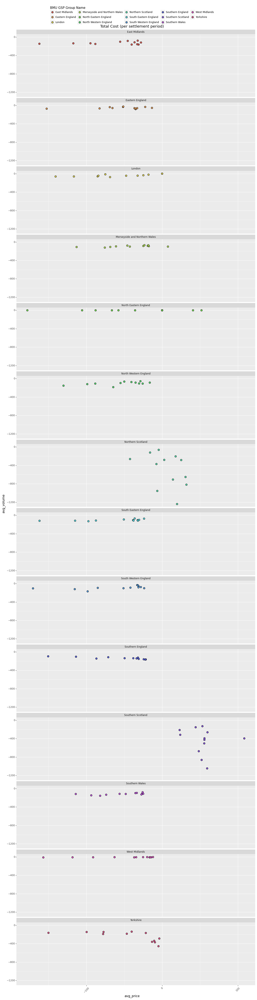

<ggplot: (8771695036221)>

In [ ]:
(ggplot(summary_month) 
 + aes(x="avg_price", y="avg_volume", fill='BMU GSP Group Name')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('Total Cost (per settlement period)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top')
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

##### - SP range per month

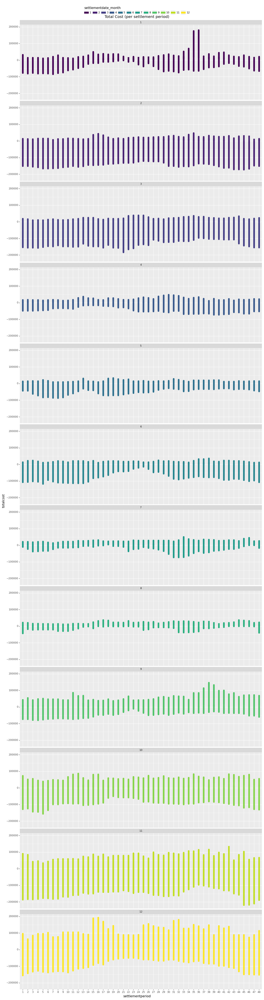

<ggplot: (8771692197570)>

In [ ]:
(ggplot(data_df) 
 + aes(x="settlementperiod", y="totalcost", color='settlementdate_month') #, group='settlementdate_month'
 + geom_line(size=3)
 #+ theme(axis_text_x=element_text(rotation=90))
 + ggtitle('Total Cost (per settlement period)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top')
 + facet_wrap("settlementdate_month", ncol=1)
)

##### - Day range per month

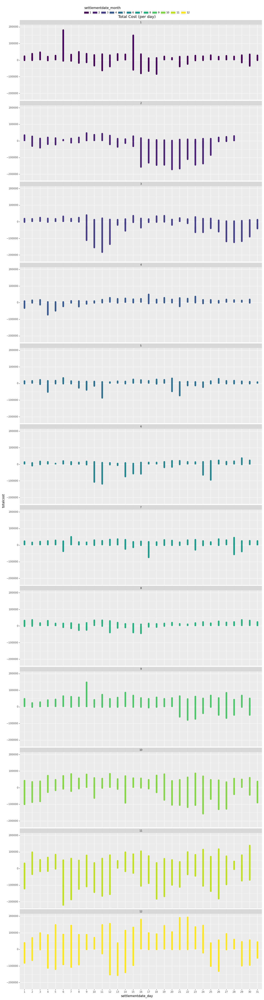

<ggplot: (8771694636978)>

In [ ]:
#(ggplot(data_df[data_df['settlementdate_month'].isin([1,2])])
(ggplot(data_df) 
 + aes(x="settlementdate_day",y="totalcost", color='settlementdate_month') #, group='settlementdate_month'
 + geom_line(size=3)
 #+ theme(axis_text_x=element_text(rotation=90))
 + ggtitle('Total Cost (per day)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top')
 + facet_wrap("settlementdate_month", ncol=1)
)

##### - Month range per year

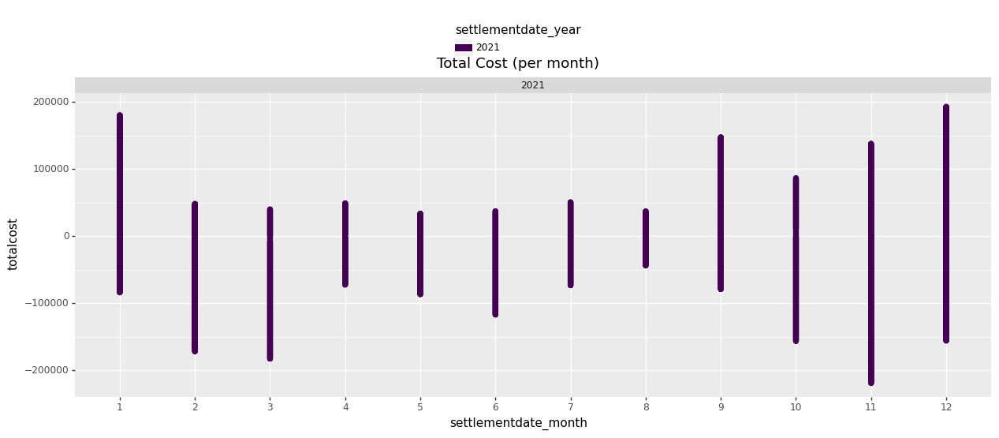

<ggplot: (8771691581392)>

In [ ]:
#(ggplot(data_df[data_df['settlementdate_month'].isin([1,2])])
(ggplot(data_df) 
 + aes(x="settlementdate_month",y="totalcost", color='settlementdate_year') #, group='settlementdate_month'
 + geom_line(size=3)
 #+ theme(axis_text_x=element_text(rotation=90))
 + ggtitle('Total Cost (per month)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 5), legend_position='top')
 + facet_wrap("settlementdate_year", ncol=1)
)

#### 1.2. OFFERS: VALORES MEDIOS, MÍNIMOS Y MÁXIMOS DE PRECIO&VOLUMEN + Nº OFERTAS (POR ZONA)

Uno de los mayores drivers es la localización (volumen medio, precio medio, precio por volumen, precio máximo, número de ofertas aprobadas)

Estacionalidad, Tendencia

##### - Dataset

In [ ]:
data_2021_OFFER = data_2021[data_2021['recordtype']=='OFFER']
data_2021_OFFER.insert(loc=7, column='nr', value=1)
data_2021_OFFER.head()

,recordtype,settlementdate,settlementdate_year,settlementdate_month,settlementdate_day,settlementperiod,BMU ID,nr,acceptedprice,acceptedvolume,...,BMU Party ID,BMU Party Name,Trading Unit,PC Flag,PC Status,Transmission Loss Factor,Generation Capacity,Demand Capacity,Base TU Flag,FPN Flag
265700,OFFER,2021-01-01,2021,1,1,1,T_CARR-2,1,74.9,248.334,...,Marble Power Limited,MARBLE,DEFAULT__P,NaN,Consumption (C),-0.052206,46.000,-45.425,True (T),True (T)
265701,OFFER,2021-01-01,2021,1,1,1,T_CDCL-1,1,71.9,322.584,...,Corriegarth Wind Energy LTD,CRGTHW,NaN,NaN,Production (P),-0.052206,69.000,0.000,False (F),True (T)
265702,OFFER,2021-01-01,2021,1,1,1,T_DAMC-1,1,72.0,270.000,...,Clyde Windfarm (Scotland),CWSL,NaN,NaN,Production (P),-0.018870,200.000,-10.000,False (F),True (T)
265703,OFFER,2021-01-01,2021,1,1,1,T_GRAI-6,1,71.9,230.188,...,Pivoted Power LLP,PIVOT,NaN,Consumption (C),Consumption (C),0.031460,49.598,-49.762,False (F),True (T)
265704,OFFER,2021-01-01,2021,1,1,1,T_GRAI-7,1,70.0,230.000,...,Crossdykes WF Limited,CDWF0620,NaN,NaN,Production (P),-0.006038,23.764,-0.200,False (F),True (T)


In [ ]:
selected_cols = ['recordtype', 'settlementdate','settlementperiod', 'nr',
                 'acceptedvolume', 'totalcost', 'BMU GSP Group Name']

In [ ]:
aggregate_cols = ['settlementdate', 'settlementperiod', 'BMU GSP Group Name']

In [ ]:
data_df = pd.pivot_table(data_2021_OFFER[selected_cols],
                         index=aggregate_cols, 
                         aggfunc={'nr':'sum', 'acceptedvolume':'sum', 'totalcost':'sum'})

data_df = data_df.rename(columns={'acceptedvolume':'totalvolume'})
data_df = data_df.reset_index()
data_df.insert(loc=4, column='averageprice', value=data_df['totalcost']/data_df['totalvolume'])
data_df = data_df[['settlementdate',	'settlementperiod', 'BMU GSP Group Name', 'nr', 'totalvolume',	'averageprice',	'totalcost']]
data_df = data_df.fillna(0)
data_df

,settlementdate,settlementperiod,BMU GSP Group Name,nr,totalvolume,averageprice,totalcost
0,2021-01-01,1,East Midlands,1,322.584,71.900000,23193.7896
1,2021-01-01,1,Eastern England,0,0.000,0.000000,0.0000
2,2021-01-01,1,London,0,0.000,0.000000,0.0000
3,2021-01-01,1,Merseyside and Northern Wales,0,0.000,0.000000,0.0000
4,2021-01-01,1,North Eastern England,0,0.000,0.000000,0.0000
...,...,...,...,...,...,...,...
245275,2021-12-31,48,Southern England,1,49.000,250.000000,12250.0000
245276,2021-12-31,48,Southern Scotland,0,0.000,0.000000,0.0000
245277,2021-12-31,48,Southern Wales,1,65.000,250.000000,16250.0000
245278,2021-12-31,48,West Midlands,0,0.000,0.000000,0.0000


In [ ]:
data_df.insert(loc=1, column='settlementdate_year', value=data_df['settlementdate'].dt.year)

order = list(data_df['settlementdate_year'].unique())
order.sort()
data = data_df['settlementdate_year']
data_df['settlementdate_year'] = pd.Categorical(data, order, ordered=True)

In [ ]:
data_df.insert(loc=2, column='settlementdate_month', value=data_df['settlementdate'].dt.month)

order = list(data_df['settlementdate_month'].unique())
order.sort()
data = data_df['settlementdate_month']
data_df['settlementdate_month'] = pd.Categorical(data, order, ordered=True)

In [ ]:
data_df.insert(loc=3, column='settlementdate_day', value=data_df['settlementdate'].dt.day)

order = list(data_df['settlementdate_day'].unique())
order.sort()
data = data_df['settlementdate_day']
data_df['settlementdate_day'] = pd.Categorical(data, order, ordered=True)


In [ ]:
data_df

,settlementdate,settlementdate_year,settlementdate_month,settlementdate_day,settlementperiod,BMU GSP Group Name,nr,totalvolume,averageprice,totalcost
0,2021-01-01,2021,1,1,1,East Midlands,1,322.584,71.900000,23193.7896
1,2021-01-01,2021,1,1,1,Eastern England,0,0.000,0.000000,0.0000
2,2021-01-01,2021,1,1,1,London,0,0.000,0.000000,0.0000
3,2021-01-01,2021,1,1,1,Merseyside and Northern Wales,0,0.000,0.000000,0.0000
4,2021-01-01,2021,1,1,1,North Eastern England,0,0.000,0.000000,0.0000
...,...,...,...,...,...,...,...,...,...,...
245275,2021-12-31,2021,12,31,48,Southern England,1,49.000,250.000000,12250.0000
245276,2021-12-31,2021,12,31,48,Southern Scotland,0,0.000,0.000000,0.0000
245277,2021-12-31,2021,12,31,48,Southern Wales,1,65.000,250.000000,16250.0000
245278,2021-12-31,2021,12,31,48,West Midlands,0,0.000,0.000000,0.0000


##### - Summary table

In [ ]:
data_df.head()

,settlementdate,settlementdate_year,settlementdate_month,settlementdate_day,settlementperiod,BMU GSP Group Name,nr,totalvolume,averageprice,totalcost
0,2021-01-01,2021,1,1,1,East Midlands,1,322.584,71.9,23193.7896
1,2021-01-01,2021,1,1,1,Eastern England,0,0.000,0.0,0.0000
2,2021-01-01,2021,1,1,1,London,0,0.000,0.0,0.0000
3,2021-01-01,2021,1,1,1,Merseyside and Northern Wales,0,0.000,0.0,0.0000
4,2021-01-01,2021,1,1,1,North Eastern England,0,0.000,0.0,0.0000


In [ ]:
cols = ['settlementdate_year', 'settlementdate_month', 'BMU GSP Group Name',
        'nr', 'perc_nr_month', 'avg_price', 'med_price', 'max_price', 'min_price', 
        'avg_volume', 'med_volume', 'max_volume', 'min_volume',
        'avg_cost', 'med_cost', 'max_cost', 'min_cost', 'totalcost']

In [ ]:
summary_month = pd.DataFrame(columns=cols)
summary_month

,settlementdate_year,settlementdate_month,BMU GSP Group Name,nr,perc_nr_month,avg_price,med_price,max_price,min_price,avg_volume,med_volume,max_volume,min_volume,avg_cost,med_cost,max_cost,min_cost


In [ ]:
years = list(data_df['settlementdate_year'].unique())
months = list(data_df['settlementdate_month'].unique())
gsp_groups = list(data_df['BMU GSP Group Name'].unique())

In [ ]:
i = 0

for x in years:
  for y in months:

    df_month = data_df[(data_df['settlementdate_year']==x)&(data_df['settlementdate_month']==y)&(data_df['totalvolume']!=0)]
    nr_month = round(df_month['nr'].sum(), 0)

    for z in gsp_groups:

      df = data_df[(data_df['settlementdate_year']==x)&(data_df['settlementdate_month']==y)&(data_df['BMU GSP Group Name']==z)&(data_df['totalvolume']!=0)]

      summary_month.loc[i,'settlementdate_year'] = x
      summary_month.loc[i,'settlementdate_month'] = y
      summary_month.loc[i,'BMU GSP Group Name'] = z
      summary_month.loc[i,'nr'] = round(df['nr'].sum(), 0)
      if nr_month != 0:
        summary_month.loc[i,'perc_nr_month'] = round(df['nr'].sum() / nr_month * 100, 2)
      summary_month.loc[i,'avg_price'] = round(df['averageprice'].mean(), 2)
      summary_month.loc[i,'med_price'] = round(df['averageprice'].median(), 2)
      summary_month.loc[i,'max_price'] = round(df['averageprice'].max(), 2)
      summary_month.loc[i,'min_price'] = round(df['averageprice'].min(), 2)
      summary_month.loc[i,'avg_volume'] = round(df['totalvolume'].mean(), 3)
      summary_month.loc[i,'med_volume'] = round(df['totalvolume'].median(), 3)
      summary_month.loc[i,'max_volume'] = round(df['totalvolume'].max(), 3)
      summary_month.loc[i,'min_volume'] = round(df['totalvolume'].min(), 3)
      summary_month.loc[i,'avg_cost'] = round(df['totalcost'].mean(), 2)
      summary_month.loc[i,'med_cost'] = round(df['totalcost'].median(), 2)
      summary_month.loc[i,'max_cost'] = round(df['totalcost'].max(), 2)
      summary_month.loc[i,'min_cost'] = round(df['totalcost'].min(), 2)
      summary_month.loc[i,'totalcost'] = round(df['totalcost'].sum(), 2)

      i += 1

summary_month = summary_month.fillna(0)

In [ ]:
summary_month

,settlementdate_year,settlementdate_month,BMU GSP Group Name,nr,perc_nr_month,avg_price,med_price,max_price,min_price,avg_volume,med_volume,max_volume,min_volume,avg_cost,med_cost,max_cost,min_cost,totalcost
0,2021,1,East Midlands,1735,11.36,80.32,74.54,399.00,35.00,250.628,195.000,1813.114,0.001,19092.64,14350.00,144490.08,0.04,17431582.80
1,2021,1,Eastern England,976,6.39,133.51,84.00,2750.00,37.00,212.951,123.000,971.780,0.001,36569.66,9582.76,1127505.50,0.04,25050217.93
2,2021,1,London,6,0.04,399.00,399.00,399.00,399.00,111.511,114.466,132.000,88.066,44492.76,45671.93,52668.00,35138.33,133478.27
3,2021,1,Merseyside and Northern Wales,2251,14.74,180.13,94.03,2750.00,31.00,194.156,134.775,1539.058,0.001,36770.92,13232.46,670818.50,0.19,35226539.00
4,2021,1,North Eastern England,105,0.69,90.07,89.68,120.00,78.66,2.097,1.866,6.000,0.003,188.80,169.17,535.75,0.25,19823.75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163,2021,12,Southern England,773,5.38,289.24,280.00,549.00,100.00,235.551,50.517,1557.000,0.001,60590.84,14425.20,367850.00,0.15,30416600.68
164,2021,12,Southern Scotland,111,0.77,367.97,327.17,9999.00,-16.00,24.597,12.000,237.282,0.033,3420.61,2224.76,12609.88,-1545.00,290752.04
165,2021,12,Southern Wales,835,5.82,312.62,300.20,597.08,15.00,104.826,57.675,635.776,0.001,30329.03,18926.03,160533.44,0.30,11767663.42
166,2021,12,West Midlands,531,3.70,356.52,340.15,574.00,271.30,34.730,20.674,177.042,0.033,12139.65,7159.65,61511.14,9.60,2864957.94


In [ ]:
cols = ['settlementdate_year', 'BMU GSP Group Name',
        'nr', 'perc_nr_year', 'avg_price', 'med_price', 'max_price', 'min_price', 
        'avg_volume', 'med_volume', 'max_volume', 'min_volume',
        'avg_cost', 'med_cost', 'max_cost', 'min_cost', 'totalcost']

In [ ]:
summary_year = pd.DataFrame(columns=cols)
summary_year

,settlementdate_year,BMU GSP Group Name,nr,perc_nr_year,avg_price,med_price,max_price,min_price,avg_volume,med_volume,max_volume,min_volume,avg_cost,med_cost,max_cost,min_cost


In [ ]:
years = list(data_df['settlementdate_year'].unique())
gsp_groups = list(data_df['BMU GSP Group Name'].unique())

In [ ]:
i = 0

for x in years:

  df_year = data_df[(data_df['settlementdate_year']==x)&(data_df['totalvolume']!=0)]
  nr_year = round(df_year['nr'].sum(), 0)

  for z in gsp_groups:

    df = data_df[(data_df['settlementdate_year']==x)&(data_df['BMU GSP Group Name']==z)&(data_df['totalvolume']!=0)]

    summary_year.loc[i,'settlementdate_year'] = x
    summary_year.loc[i,'BMU GSP Group Name'] = z
    summary_year.loc[i,'nr'] = round(df['nr'].sum(), 0)
    if nr_year != 0:
      summary_year.loc[i,'perc_nr_year'] = round(df['nr'].sum() / nr_year * 100, 2)
    summary_year.loc[i,'avg_price'] = round(df['averageprice'].mean(), 2)
    summary_year.loc[i,'med_price'] = round(df['averageprice'].median(), 2)
    summary_year.loc[i,'max_price'] = round(df['averageprice'].max(), 2)
    summary_year.loc[i,'min_price'] = round(df['averageprice'].min(), 2)
    summary_year.loc[i,'avg_volume'] = round(df['totalvolume'].mean(), 3)
    summary_year.loc[i,'med_volume'] = round(df['totalvolume'].median(), 3)
    summary_year.loc[i,'max_volume'] = round(df['totalvolume'].max(), 3)
    summary_year.loc[i,'min_volume'] = round(df['totalvolume'].min(), 3)
    summary_year.loc[i,'avg_cost'] = round(df['totalcost'].mean(), 2)
    summary_year.loc[i,'med_cost'] = round(df['totalcost'].median(), 2)
    summary_year.loc[i,'max_cost'] = round(df['totalcost'].max(), 2)
    summary_year.loc[i,'min_cost'] = round(df['totalcost'].min(), 2)
    summary_year.loc[i,'totalcost'] = round(df['totalcost'].sum(), 2)

    i += 1

summary_year = summary_year.fillna(0)

In [ ]:
summary_year

,settlementdate_year,BMU GSP Group Name,nr,perc_nr_year,avg_price,med_price,max_price,min_price,avg_volume,med_volume,max_volume,min_volume,avg_cost,med_cost,max_cost,min_cost,totalcost
0,2021,East Midlands,23979,11.54,160.73,115.00,3800.0,-50.00,263.390,200.000,2327.436,0.001,41933.53,24308.81,2105400.00,-24.20,5.065989e+08
1,2021,Eastern England,15125,7.28,226.76,129.99,4000.0,17.10,212.866,120.558,1355.466,0.001,61043.34,16128.77,1730753.75,0.02,5.084910e+08
2,2021,London,1211,0.58,164.81,130.00,999.0,69.90,143.807,124.710,440.000,0.001,24002.55,16439.65,119880.00,0.13,2.827500e+07
3,2021,Merseyside and Northern Wales,27294,13.14,187.50,127.94,4000.0,31.00,218.660,191.666,1571.962,0.001,41894.51,22856.72,2088506.25,0.05,5.465139e+08
4,2021,North Eastern England,1975,0.95,133.94,125.00,447.0,0.00,2.052,1.894,6.000,0.003,269.22,219.69,999.00,0.00,5.316999e+05
5,2021,North Western England,25253,12.15,147.42,123.95,825.0,-85.02,146.055,103.200,1006.450,0.001,20578.59,13571.85,182953.13,-3758.98,1.755560e+08
6,2021,Northern Scotland,15428,7.42,156.06,120.00,9999.0,-53.64,113.535,65.991,1100.000,0.001,16459.43,9163.05,383417.50,-2308.42,1.158744e+08
7,2021,South Eastern England,19283,9.28,171.40,116.00,3875.0,3.89,304.339,230.000,1947.256,0.001,48197.03,25758.69,1820993.70,0.05,5.363366e+08
8,2021,South Western England,16755,8.06,187.48,124.83,3950.0,-50.00,269.497,250.000,1458.666,0.001,56268.06,26563.80,2662880.00,-175.00,5.214361e+08
9,2021,Southern England,13978,6.73,137.77,109.79,1724.0,20.00,254.370,60.137,1832.814,0.001,32803.39,7558.13,405633.79,0.04,2.795505e+08


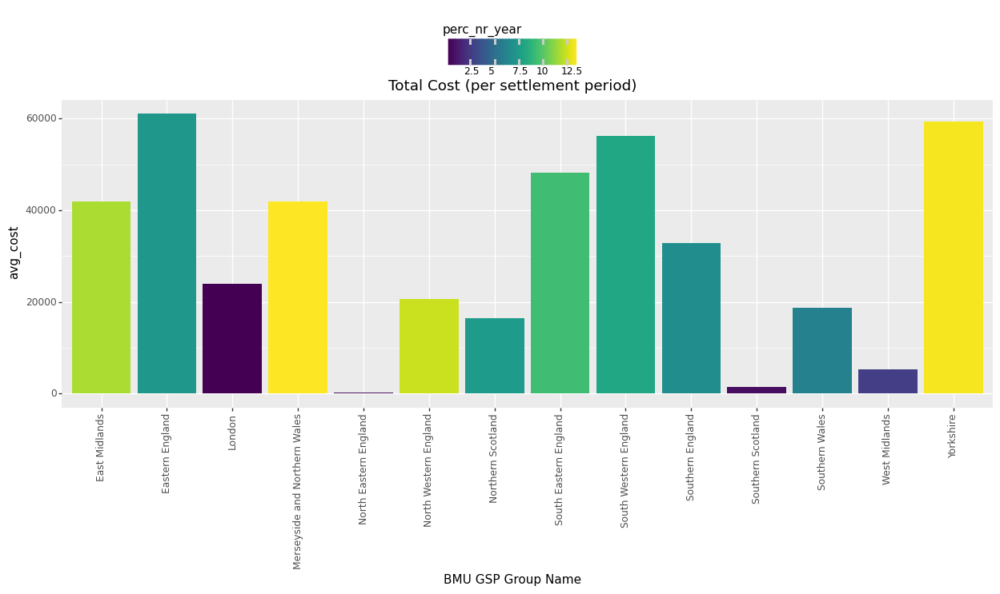

<ggplot: (8771694702043)>

In [ ]:
(ggplot(summary_year) 
 + aes(x="BMU GSP Group Name", y="avg_cost", fill='perc_nr_year')
 + geom_bar(stat='identity', size=3)
 + theme(axis_text_x=element_text(rotation=90))
 + ggtitle('Total Cost (per settlement period)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 5), legend_position='top')
)

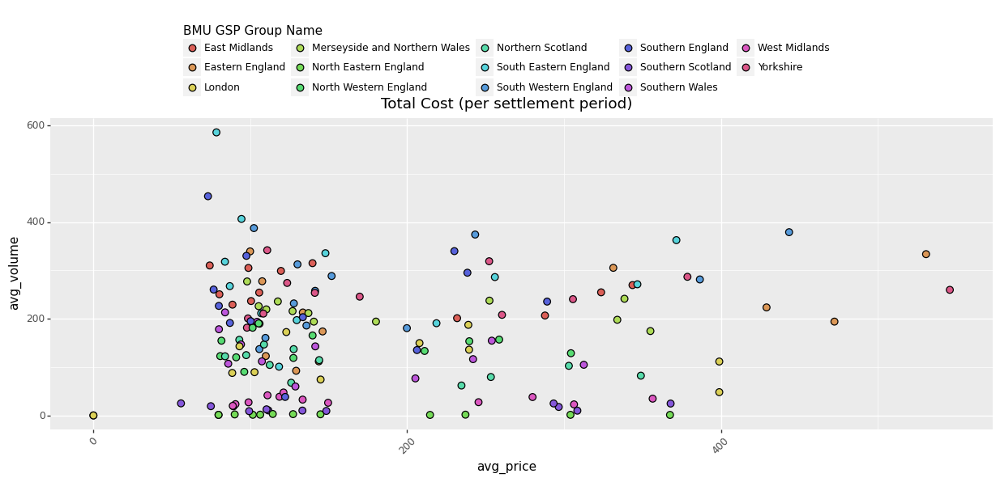

<ggplot: (8771695017579)>

In [ ]:
(ggplot(summary_month) 
 + aes(x="avg_price", y="avg_volume", fill='BMU GSP Group Name')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('Total Cost (per settlement period)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 5), legend_position='top')
)

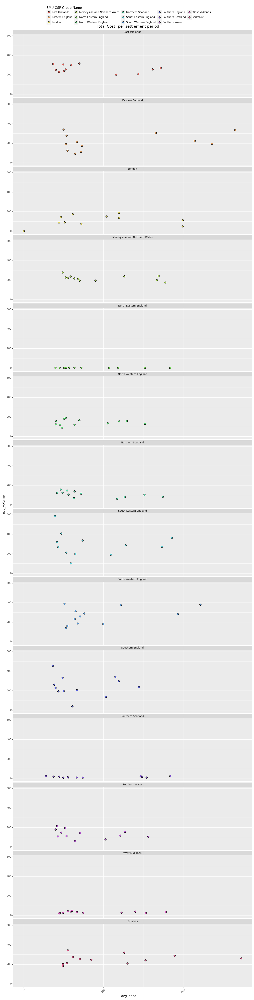

<ggplot: (8771697253569)>

In [ ]:
(ggplot(summary_month) 
 + aes(x="avg_price", y="avg_volume", fill='BMU GSP Group Name')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('Total Cost (per settlement period)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top')
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

##### - SP range per month

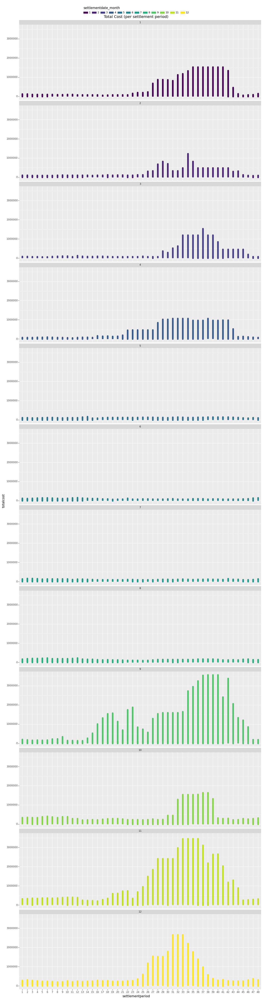

<ggplot: (8771694783984)>

In [ ]:
(ggplot(data_df) 
 + aes(x="settlementperiod", y="totalcost", color='settlementdate_month') #, group='settlementdate_month'
 + geom_line(size=3)
 #+ theme(axis_text_x=element_text(rotation=90))
 + ggtitle('Total Cost (per settlement period)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top')
 + facet_wrap("settlementdate_month", ncol=1)
)

##### - Day range per month

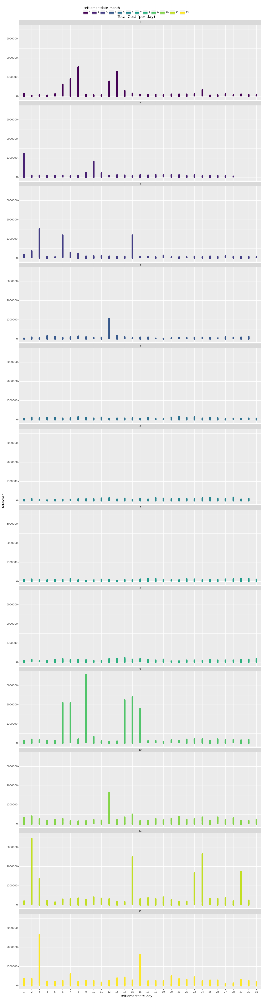

<ggplot: (8771693588643)>

In [ ]:
#(ggplot(data_df[data_df['settlementdate_month'].isin([1,2])])
(ggplot(data_df) 
 + aes(x="settlementdate_day",y="totalcost", color='settlementdate_month') #, group='settlementdate_month'
 + geom_line(size=3)
 #+ theme(axis_text_x=element_text(rotation=90))
 + ggtitle('Total Cost (per day)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top')
 + facet_wrap("settlementdate_month", ncol=1)
)

##### - Month range per year

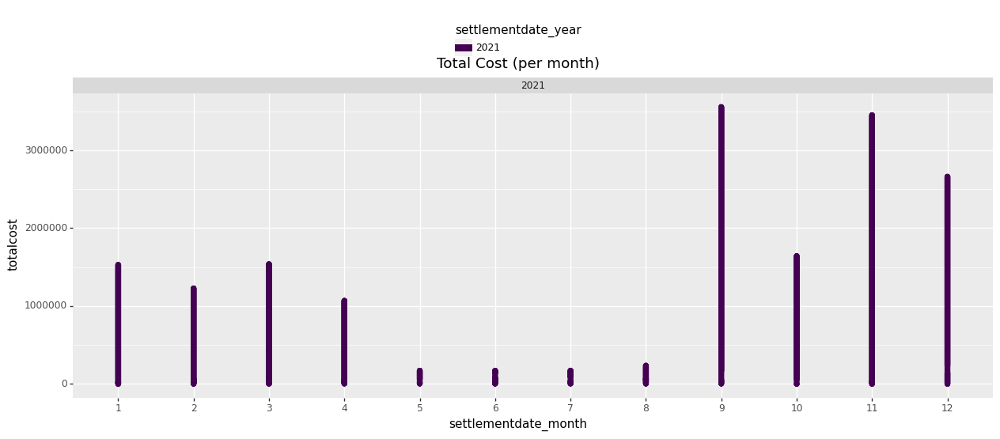

<ggplot: (8771697638965)>

In [ ]:
#(ggplot(data_df[data_df['settlementdate_month'].isin([1,2])])
(ggplot(data_df) 
 + aes(x="settlementdate_month",y="totalcost", color='settlementdate_year') #, group='settlementdate_month'
 + geom_line(size=3)
 #+ theme(axis_text_x=element_text(rotation=90))
 + ggtitle('Total Cost (per month)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 5), legend_position='top')
 + facet_wrap("settlementdate_year", ncol=1)
)

#### 2. OFERTAN QUE SE ACEPTAN MÁS O MENOS -> Cuartiles de precio y volumen (POR ZONA)

Percentiles de aceptación

- Por settlement period
- Por día
- Por semana
- Por mes

#### 3.1. BIDS: DISTRIBUCIÓN DE FUEL TYPE (POR ZONA)

Estacionalidad, Tendencia

##### - Dataset

In [ ]:
data_2021_BID = data_2021[data_2021['recordtype']=='BID']
data_2021_BID.insert(loc=7, column='nr', value=1)
data_2021_BID.head()

,recordtype,settlementdate,settlementdate_year,settlementdate_month,settlementdate_day,settlementperiod,BMU ID,nr,acceptedprice,acceptedvolume,...,BMU Party ID,BMU Party Name,Trading Unit,PC Flag,PC Status,Transmission Loss Factor,Generation Capacity,Demand Capacity,Base TU Flag,FPN Flag
0,BID,2021-01-01,2021,1,1,1,E_GYAR-1,1,37.0,-18.366,...,RWE Generation UK plc,INNOGY01,NaN,NaN,Production (P),0.004895,420.0,-18.0,False (F),True (T)
1,BID,2021-01-01,2021,1,1,1,E_SHOS-1,1,35.0,-0.666,...,VPI Power Limited,SPGEN01,NaN,NaN,Production (P),0.012051,436.0,-16.0,False (F),True (T)
2,BID,2021-01-01,2021,1,1,1,T_CDCL-1,1,40.0,-11.084,...,Uniper UK Limited,EECL,NaN,NaN,Production (P),0.005473,445.0,-12.0,False (F),True (T)
3,BID,2021-01-01,2021,1,1,1,T_MRWD-1,1,37.1,-174.768,...,Marchwood Power Limited,MPL,NaN,NaN,Production (P),0.017790,920.0,-15.0,False (F),True (T)
4,BID,2021-01-01,2021,1,1,1,T_PEMB-11,1,37.0,-33.634,...,RWE Generation UK plc,INNOGY01,Pembroke Power Station,NaN,Production (P),0.009636,475.0,-11.0,False (F),True (T)


In [ ]:
data_2021_BID.columns

Index(['recordtype', 'settlementdate', 'settlementdate_year',
       'settlementdate_month', 'settlementdate_day', 'settlementperiod',
       'BMU ID', 'nr', 'acceptedprice', 'acceptedvolume', 'totalcost',
       'BMU Type', 'BMU Fuel Type', 'BMU GSP Group Id', 'BMU GSP Group Name',
       'LOC LAT', 'LOC LONG', 'GSP LOC Center', 'LOC Center LAT',
       'LOC Center LONG', 'BMU Party ID', 'BMU Party Name', 'Trading Unit',
       'PC Flag', 'PC Status', 'Transmission Loss Factor',
       'Generation Capacity', 'Demand Capacity', 'Base TU Flag', 'FPN Flag'],
      dtype='object')

In [ ]:
'''
['recordtype', 'settlementdate', 'settlementperiod',
'BMU Type', 'BMU Fuel Type', 'BMU GSP Group Name',
'Trading Unit', 'PC Flag', 'PC Status',
'Transmission Loss Factor', 'Generation Capacity', 'Demand Capacity',
'Credit Assessment Load Factor','BMU Credit Assessment Export Capability',
'BMU Credit Assessment Import Capability', 'Exempt Export Flag',
'Base TU Flag', 'FPN Flag', 'Interconnector']
'''

"\n['recordtype', 'settlementdate', 'settlementperiod',\n'BMU Type', 'BMU Fuel Type', 'BMU GSP Group Name',\n'Trading Unit', 'PC Flag', 'PC Status',\n'Transmission Loss Factor', 'Generation Capacity', 'Demand Capacity',\n'Credit Assessment Load Factor','BMU Credit Assessment Export Capability',\n'BMU Credit Assessment Import Capability', 'Exempt Export Flag',\n'Base TU Flag', 'FPN Flag', 'Interconnector']\n"

In [ ]:
selected_cols = ['recordtype', 'settlementdate', 'settlementperiod', 'nr',
                 'acceptedprice', 'acceptedvolume', 'totalcost',
                 'BMU Fuel Type', 'BMU GSP Group Name']

In [ ]:
aggregate_cols = ['settlementdate', 'settlementperiod', 'BMU GSP Group Name', 'BMU Fuel Type']

In [ ]:
data_df = pd.pivot_table(data_2021_BID[selected_cols],
                         index=aggregate_cols, 
                         aggfunc={'nr':'sum', 'acceptedvolume':'sum', 'totalcost':'sum'})

data_df = data_df.rename(columns={'acceptedvolume':'totalvolume'})
data_df = data_df.reset_index()
data_df.insert(loc=4, column='averageprice', value=data_df['totalcost']/data_df['totalvolume'])
data_df = data_df[['settlementdate',	'settlementperiod', 'BMU GSP Group Name', 'BMU Fuel Type', 'nr', 'totalvolume',	'averageprice',	'totalcost']]
data_df = data_df.fillna(0)
data_df

,settlementdate,settlementperiod,BMU GSP Group Name,BMU Fuel Type,nr,totalvolume,averageprice,totalcost
0,2021-01-01,1,East Midlands,BATTERY,0,0.000,0.0,0.00
1,2021-01-01,1,East Midlands,BIOMASS,0,0.000,0.0,0.00
2,2021-01-01,1,East Midlands,CCGT,1,-11.084,-40.0,443.36
3,2021-01-01,1,East Midlands,COAL,0,0.000,0.0,0.00
4,2021-01-01,1,East Midlands,NPSHYD,0,0.000,0.0,0.00
...,...,...,...,...,...,...,...,...
2207515,2021-12-31,48,Yorkshire,NPSHYD,0,0.000,0.0,0.00
2207516,2021-12-31,48,Yorkshire,OCGT,0,0.000,0.0,0.00
2207517,2021-12-31,48,Yorkshire,OTHER,0,0.000,0.0,0.00
2207518,2021-12-31,48,Yorkshire,PS,0,0.000,0.0,0.00


In [ ]:
data_df.insert(loc=1, column='settlementdate_year', value=data_df['settlementdate'].dt.year)

order = list(data_df['settlementdate_year'].unique())
order.sort()
data = data_df['settlementdate_year']
data_df['settlementdate_year'] = pd.Categorical(data, order, ordered=True)

In [ ]:
data_df.insert(loc=2, column='settlementdate_month', value=data_df['settlementdate'].dt.month)

order = list(data_df['settlementdate_month'].unique())
order.sort()
data = data_df['settlementdate_month']
data_df['settlementdate_month'] = pd.Categorical(data, order, ordered=True)

In [ ]:
data_df.insert(loc=3, column='settlementdate_day', value=data_df['settlementdate'].dt.day)

order = list(data_df['settlementdate_day'].unique())
order.sort()
data = data_df['settlementdate_day']
data_df['settlementdate_day'] = pd.Categorical(data, order, ordered=True)


In [ ]:
data_df

,settlementdate,settlementdate_year,settlementdate_month,settlementdate_day,settlementperiod,BMU GSP Group Name,BMU Fuel Type,nr,totalvolume,averageprice,totalcost
0,2021-01-01,2021,1,1,1,East Midlands,BATTERY,0,0.000,0.0,0.00
1,2021-01-01,2021,1,1,1,East Midlands,BIOMASS,0,0.000,0.0,0.00
2,2021-01-01,2021,1,1,1,East Midlands,CCGT,1,-11.084,-40.0,443.36
3,2021-01-01,2021,1,1,1,East Midlands,COAL,0,0.000,0.0,0.00
4,2021-01-01,2021,1,1,1,East Midlands,NPSHYD,0,0.000,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...
2207515,2021-12-31,2021,12,31,48,Yorkshire,NPSHYD,0,0.000,0.0,0.00
2207516,2021-12-31,2021,12,31,48,Yorkshire,OCGT,0,0.000,0.0,0.00
2207517,2021-12-31,2021,12,31,48,Yorkshire,OTHER,0,0.000,0.0,0.00
2207518,2021-12-31,2021,12,31,48,Yorkshire,PS,0,0.000,0.0,0.00


##### - Summary table

In [ ]:
data_df.head()

,settlementdate,settlementdate_year,settlementdate_month,settlementdate_day,settlementperiod,BMU GSP Group Name,BMU Fuel Type,nr,totalvolume,averageprice,totalcost
0,2021-01-01,2021,1,1,1,East Midlands,BATTERY,0,0.000,0.0,0.00
1,2021-01-01,2021,1,1,1,East Midlands,BIOMASS,0,0.000,0.0,0.00
2,2021-01-01,2021,1,1,1,East Midlands,CCGT,1,-11.084,-40.0,443.36
3,2021-01-01,2021,1,1,1,East Midlands,COAL,0,0.000,0.0,0.00
4,2021-01-01,2021,1,1,1,East Midlands,NPSHYD,0,0.000,0.0,0.00


In [ ]:
cols = ['settlementdate_year', 'settlementdate_month', 'BMU GSP Group Name', 'BMU Fuel Type',
        'nr', 'perc_nr_month', 'perc_nr_gsp', 'avg_price', 'max_price', 'min_price', 
        'avg_volume', 'max_volume', 'min_volume',
        'perc_avgcost_month', 'perc_avgcost_gsp', 'avg_cost', 'max_cost', 'min_cost']

In [ ]:
summary_month = pd.DataFrame(columns=cols)
summary_month

,settlementdate_year,settlementdate_month,BMU GSP Group Name,BMU Fuel Type,nr,perc_nr_month,perc_nr_gsp,avg_price,max_price,min_price,avg_volume,max_volume,min_volume,perc_avgcost_month,perc_avgcost_gsp,avg_cost,max_cost,min_cost


In [ ]:
years = list(data_df['settlementdate_year'].unique())
months = list(data_df['settlementdate_month'].unique())
gsp_groups = list(data_df['BMU GSP Group Name'].unique())
fuel_types = list(data_df['BMU Fuel Type'].unique())

In [ ]:
i = 0

for x in years:
  for y in months:

    df_month = data_df[(data_df['settlementdate_year']==x)&(data_df['settlementdate_month']==y)&(data_df['totalvolume']!=0)]
    nr_month = round(df_month['nr'].sum(), 0)
    cost_month = round(df_month['totalcost'].sum(), 0)

    for z in gsp_groups:

      df_gsp = data_df[(data_df['settlementdate_year']==x)&(data_df['settlementdate_month']==y)&(data_df['BMU GSP Group Name']==z)&(data_df['totalvolume']!=0)]
      nr_gsp = round(df_gsp['nr'].sum(), 0)
      cost_gsp = round(df_gsp['totalcost'].sum(), 0)

      for u in fuel_types:

        df = data_df[(data_df['settlementdate_year']==x)&(data_df['settlementdate_month']==y)&(data_df['BMU GSP Group Name']==z)&(data_df['BMU Fuel Type']==u)&(data_df['totalvolume']!=0)]

        summary_month.loc[i,'settlementdate_year'] = x
        summary_month.loc[i,'settlementdate_month'] = y
        summary_month.loc[i,'BMU GSP Group Name'] = z
        summary_month.loc[i,'BMU Fuel Type'] = u

        summary_month.loc[i,'nr'] = round(df['nr'].sum(), 0)
        if nr_month != 0:
          summary_month.loc[i,'perc_nr_month'] = round(df['nr'].sum() / nr_month * 100, 2)
        if nr_gsp != 0:
          summary_month.loc[i,'perc_nr_gsp'] = round(df['nr'].sum() / nr_gsp * 100, 2)

        summary_month.loc[i,'avg_price'] = round(df['averageprice'].mean(), 2)
        summary_month.loc[i,'med_price'] = round(df['averageprice'].median(), 2)
        summary_month.loc[i,'max_price'] = round(df['averageprice'].max(), 2)
        summary_month.loc[i,'min_price'] = round(df['averageprice'].min(), 2)

        summary_month.loc[i,'avg_volume'] = round(df['totalvolume'].mean(), 3)
        summary_month.loc[i,'med_volume'] = round(df['totalvolume'].median(), 3)
        summary_month.loc[i,'max_volume'] = round(df['totalvolume'].max(), 3)
        summary_month.loc[i,'min_volume'] = round(df['totalvolume'].min(), 3)

        summary_month.loc[i,'avg_cost'] = round(df['totalcost'].mean(), 2)
        summary_month.loc[i,'med_cost'] = round(df['totalcost'].median(), 2)
        summary_month.loc[i,'max_cost'] = round(df['totalcost'].max(), 2)
        summary_month.loc[i,'min_cost'] = round(df['totalcost'].min(), 2)

        i += 1

summary_month = summary_month.fillna(0)

In [ ]:
order = list(summary_month['settlementdate_year'].unique())
order.sort()
data = summary_month['settlementdate_year']
summary_month['settlementdate_year'] = pd.Categorical(data, order, ordered=True)

In [ ]:
order = list(summary_month['settlementdate_month'].unique())
order.sort()
data = summary_month['settlementdate_month']
summary_month['settlementdate_month'] = pd.Categorical(data, order, ordered=True)

In [ ]:
summary_month

,settlementdate_year,settlementdate_month,BMU GSP Group Name,BMU Fuel Type,nr,perc_nr_month,perc_nr_gsp,avg_price,max_price,min_price,...,max_volume,min_volume,perc_avgcost_month,perc_avgcost_gsp,avg_cost,max_cost,min_cost,med_price,med_volume,med_cost
0,2021,1,East Midlands,BATTERY,0,0.00,0.00,0.00,0.00,0.00,...,0.000,0.000,0,0,0.00,0.00,0.00,0.00,0.000,0.00
1,2021,1,East Midlands,BIOMASS,0,0.00,0.00,0.00,0.00,0.00,...,0.000,0.000,0,0,0.00,0.00,0.00,0.00,0.000,0.00
2,2021,1,East Midlands,CCGT,1502,8.50,63.32,-39.69,-0.00,-60.00,...,-0.001,-919.250,0,0,5041.03,36148.91,0.00,-41.76,-76.623,2804.44
3,2021,1,East Midlands,COAL,737,4.17,31.07,-40.40,-0.00,-52.00,...,-0.001,-659.386,0,0,5003.85,31881.31,0.00,-43.69,-78.096,2989.82
4,2021,1,East Midlands,NPSHYD,0,0.00,0.00,0.00,0.00,0.00,...,0.000,0.000,0,0,0.00,0.00,0.00,0.00,0.000,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1507,2021,12,Yorkshire,NPSHYD,0,0.00,0.00,0.00,0.00,0.00,...,0.000,0.000,0,0,0.00,0.00,0.00,0.00,0.000,0.00
1508,2021,12,Yorkshire,OCGT,38,0.14,1.38,-242.05,-157.00,-325.00,...,-0.534,-48.000,0,0,5922.42,13728.00,139.91,-264.00,-24.000,6172.35
1509,2021,12,Yorkshire,OTHER,66,0.25,2.41,-235.46,-160.00,-297.02,...,-0.008,-54.215,0,0,4997.98,15475.23,2.23,-258.60,-18.568,4788.20
1510,2021,12,Yorkshire,PS,0,0.00,0.00,0.00,0.00,0.00,...,0.000,0.000,0,0,0.00,0.00,0.00,0.00,0.000,0.00


In [ ]:
summary_month[(summary_month['settlementdate_month']==1)&(summary_month['BMU GSP Group Name'].isin(['East Midlands', 'Southern England', 'Yorkshire']))]

,settlementdate_year,settlementdate_month,BMU GSP Group Name,BMU Fuel Type,nr,perc_nr_month,perc_nr_gsp,avg_price,max_price,min_price,...,max_volume,min_volume,perc_avgcost_month,perc_avgcost_gsp,avg_cost,max_cost,min_cost,med_price,med_volume,med_cost
0,2021,1,East Midlands,BATTERY,0,0.00,0.00,0.00,0.00,0.00,...,0.000,0.000,0,0,0.00,0.00,0.00,0.00,0.000,0.00
1,2021,1,East Midlands,BIOMASS,0,0.00,0.00,0.00,0.00,0.00,...,0.000,0.000,0,0,0.00,0.00,0.00,0.00,0.000,0.00
2,2021,1,East Midlands,CCGT,1502,8.50,63.32,-39.69,-0.00,-60.00,...,-0.001,-919.250,0,0,5041.03,36148.91,0.00,-41.76,-76.623,2804.44
3,2021,1,East Midlands,COAL,737,4.17,31.07,-40.40,-0.00,-52.00,...,-0.001,-659.386,0,0,5003.85,31881.31,0.00,-43.69,-78.096,2989.82
4,2021,1,East Midlands,NPSHYD,0,0.00,0.00,0.00,0.00,0.00,...,0.000,0.000,0,0,0.00,0.00,0.00,0.00,0.000,0.00
5,2021,1,East Midlands,OCGT,4,0.02,0.17,-75.00,-75.00,-75.00,...,-1.500,-12.166,0,0,512.48,912.45,112.50,-75.00,-6.833,512.48
6,2021,1,East Midlands,OTHER,127,0.72,5.35,-51.54,-25.00,-85.00,...,-0.003,-32.000,0,0,436.24,1776.00,0.14,-53.00,-3.134,148.41
7,2021,1,East Midlands,PS,0,0.00,0.00,0.00,0.00,0.00,...,0.000,0.000,0,0,0.00,0.00,0.00,0.00,0.000,0.00
8,2021,1,East Midlands,WIND,2,0.01,0.08,148.68,148.68,148.68,...,-8.716,-12.070,0,0,-1545.23,-1295.89,-1794.57,148.68,-10.393,-1545.23
81,2021,1,Southern England,BATTERY,82,0.46,6.33,-19.18,47.45,-71.00,...,-0.001,-16.000,0,0,56.34,800.00,-217.54,-11.80,-2.084,16.90


In [ ]:
cols = ['settlementdate_year', 'BMU GSP Group Name', 'BMU Fuel Type',
        'nr', 'perc_nr_month', 'perc_nr_gsp', 'avg_price', 'max_price', 'min_price', 
        'avg_volume', 'max_volume', 'min_volume',
        'perc_avgcost_month', 'perc_avgcost_gsp', 'avg_cost', 'max_cost', 'min_cost', 'totalcost']

In [ ]:
summary_year = pd.DataFrame(columns=cols)
summary_year

,settlementdate_year,BMU GSP Group Name,BMU Fuel Type,nr,perc_nr_month,perc_nr_gsp,avg_price,max_price,min_price,avg_volume,max_volume,min_volume,perc_avgcost_month,perc_avgcost_gsp,avg_cost,max_cost,min_cost,totalcost


In [ ]:
years = list(data_df['settlementdate_year'].unique())
gsp_groups = list(data_df['BMU GSP Group Name'].unique())
fuel_types = list(data_df['BMU Fuel Type'].unique())

In [ ]:
i = 0

for x in years:

    df_year = data_df[(data_df['settlementdate_year']==x)&(data_df['totalvolume']!=0)]
    nr_year = round(df_month['nr'].sum(), 0)
    cost_year = round(df_month['totalcost'].sum(), 0)

    for z in gsp_groups:

      df_gsp = data_df[(data_df['settlementdate_year']==x)&(data_df['BMU GSP Group Name']==z)&(data_df['totalvolume']!=0)]
      nr_gsp = round(df_gsp['nr'].sum(), 0)
      cost_gsp = round(df_gsp['totalcost'].sum(), 0)

      for u in fuel_types:

        df = data_df[(data_df['settlementdate_year']==x)&(data_df['BMU GSP Group Name']==z)&(data_df['BMU Fuel Type']==u)&(data_df['totalvolume']!=0)]

        summary_year.loc[i,'settlementdate_year'] = x
        summary_year.loc[i,'BMU GSP Group Name'] = z
        summary_year.loc[i,'BMU Fuel Type'] = u

        summary_year.loc[i,'nr'] = round(df['nr'].sum(), 0)
        if nr_year != 0:
          summary_year.loc[i,'perc_nr_year'] = round(df['nr'].sum() / nr_year * 100, 2)
        if nr_gsp != 0:
          summary_year.loc[i,'perc_nr_gsp'] = round(df['nr'].sum() / nr_gsp * 100, 2)

        summary_year.loc[i,'avg_price'] = round(df['averageprice'].mean(), 2)
        summary_year.loc[i,'med_price'] = round(df['averageprice'].median(), 2)
        summary_year.loc[i,'max_price'] = round(df['averageprice'].max(), 2)
        summary_year.loc[i,'min_price'] = round(df['averageprice'].min(), 2)

        summary_year.loc[i,'avg_volume'] = round(df['totalvolume'].mean(), 3)
        summary_year.loc[i,'med_volume'] = round(df['totalvolume'].median(), 3)
        summary_year.loc[i,'max_volume'] = round(df['totalvolume'].max(), 3)
        summary_year.loc[i,'min_volume'] = round(df['totalvolume'].min(), 3)

        summary_year.loc[i,'avg_cost'] = round(df['totalcost'].mean(), 2)
        summary_year.loc[i,'med_cost'] = round(df['totalcost'].median(), 2)
        summary_year.loc[i,'max_cost'] = round(df['totalcost'].max(), 2)
        summary_year.loc[i,'min_cost'] = round(df['totalcost'].min(), 2)
        summary_year.loc[i,'totalcost'] = round(df['totalcost'].min(), 2)

        i += 1

summary_year = summary_year.fillna(0)

In [ ]:
order = list(summary_year['settlementdate_year'].unique())
order.sort()
data = summary_year['settlementdate_year']
summary_year['settlementdate_year'] = pd.Categorical(data, order, ordered=True)

In [ ]:
summary_year

,settlementdate_year,BMU GSP Group Name,BMU Fuel Type,nr,perc_nr_month,perc_nr_gsp,avg_price,max_price,min_price,avg_volume,...,perc_avgcost_month,perc_avgcost_gsp,avg_cost,max_cost,min_cost,totalcost,perc_nr_year,med_price,med_volume,med_cost
0,2021,East Midlands,BATTERY,805,0,3.68,-34.20,50.00,-225.71,-1.886,...,0,0,57.33,996.88,-129.10,-129.10,3.06,-33.57,-1.317,28.28
1,2021,East Midlands,BIOMASS,0,0,0.00,0.00,0.00,0.00,0.000,...,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.000,0.00
2,2021,East Midlands,CCGT,15335,0,70.16,-63.06,-0.00,-281.00,-111.816,...,0,0,7161.71,165250.00,0.00,0.00,58.24,-48.95,-69.320,3344.94
3,2021,East Midlands,COAL,4922,0,22.52,-74.63,-0.00,-235.00,-112.625,...,0,0,8828.75,97659.45,0.00,0.00,18.69,-58.10,-79.334,4692.54
4,2021,East Midlands,NPSHYD,0,0,0.00,0.00,0.00,0.00,0.000,...,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.000,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121,2021,Yorkshire,NPSHYD,0,0,0.00,0.00,0.00,0.00,0.000,...,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.000,0.00
122,2021,Yorkshire,OCGT,362,0,0.81,-111.25,-40.11,-380.00,-19.297,...,0,0,2205.04,13728.00,0.09,0.09,1.37,-84.50,-14.400,1253.92
123,2021,Yorkshire,OTHER,830,0,1.85,-76.19,-10.00,-297.02,-16.382,...,0,0,1294.93,15475.23,0.05,0.05,3.15,-50.44,-10.717,585.62
124,2021,Yorkshire,PS,0,0,0.00,0.00,0.00,0.00,0.000,...,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.000,0.00


In [ ]:
summary_year[summary_year['BMU GSP Group Name'].isin(['East Midlands', 'Southern England', 'Yorkshire'])]

,settlementdate_year,BMU GSP Group Name,BMU Fuel Type,nr,perc_nr_month,perc_nr_gsp,avg_price,max_price,min_price,avg_volume,...,perc_avgcost_month,perc_avgcost_gsp,avg_cost,max_cost,min_cost,totalcost,perc_nr_year,med_price,med_volume,med_cost
0,2021,East Midlands,BATTERY,805,0,3.68,-34.20,50.00,-225.71,-1.886,...,0,0,57.33,996.88,-129.10,-129.10,3.06,-33.57,-1.317,28.28
1,2021,East Midlands,BIOMASS,0,0,0.00,0.00,0.00,0.00,0.000,...,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.000,0.00
2,2021,East Midlands,CCGT,15335,0,70.16,-63.06,-0.00,-281.00,-111.816,...,0,0,7161.71,165250.00,0.00,0.00,58.24,-48.95,-69.320,3344.94
3,2021,East Midlands,COAL,4922,0,22.52,-74.63,-0.00,-235.00,-112.625,...,0,0,8828.75,97659.45,0.00,0.00,18.69,-58.10,-79.334,4692.54
4,2021,East Midlands,NPSHYD,0,0,0.00,0.00,0.00,0.00,0.000,...,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.000,0.00
5,2021,East Midlands,OCGT,8,0,0.04,-70.83,-50.00,-75.00,-9.414,...,0,0,702.90,1275.00,37.50,37.50,0.03,-75.00,-10.116,758.70
6,2021,East Midlands,OTHER,729,0,3.34,-75.95,-10.00,-293.84,-7.706,...,0,0,573.44,8973.33,0.01,0.01,2.77,-53.83,-2.384,164.60
7,2021,East Midlands,PS,0,0,0.00,0.00,0.00,0.00,0.000,...,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.000,0.00
8,2021,East Midlands,WIND,58,0,0.27,148.68,148.68,148.68,-53.095,...,0,0,-7894.12,-1034.22,-29391.66,-29391.66,0.22,148.68,-28.080,-4174.93
81,2021,Southern England,BATTERY,1359,0,8.35,-31.67,75.95,-498.08,-2.393,...,0,0,83.42,3271.68,-510.77,-510.77,5.16,-15.00,-1.500,16.00


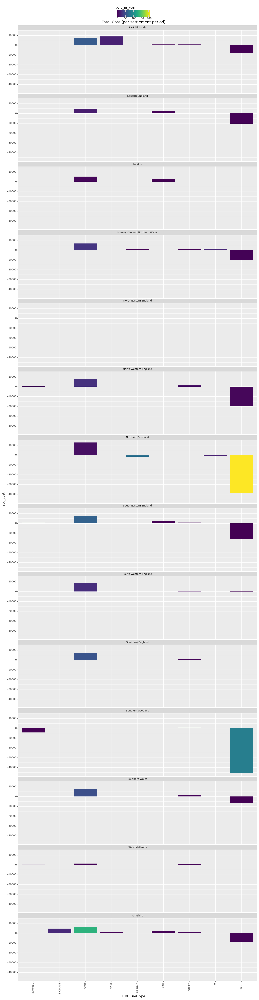

<ggplot: (8771693401236)>

In [ ]:
(ggplot(summary_year) 
 + aes(x="BMU Fuel Type", y="avg_cost", fill='perc_nr_year')
 + geom_bar(stat='identity', size=3)
 + theme(axis_text_x=element_text(rotation=90))
 + ggtitle('Total Cost (per settlement period)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top')
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

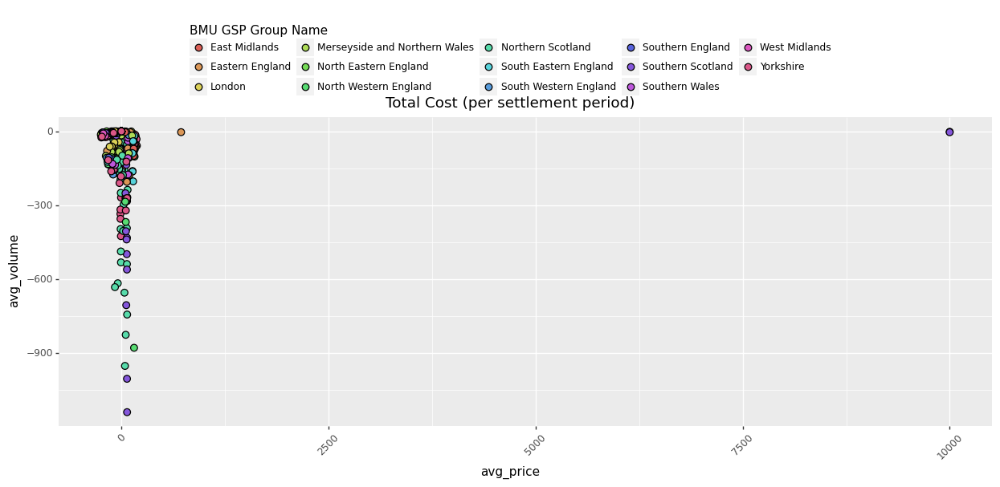

<ggplot: (8771697847621)>

In [ ]:
(ggplot(summary_month) 
 + aes(x="avg_price", y="avg_volume", fill='BMU GSP Group Name')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('Total Cost (per settlement period)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 5), legend_position='top')
)

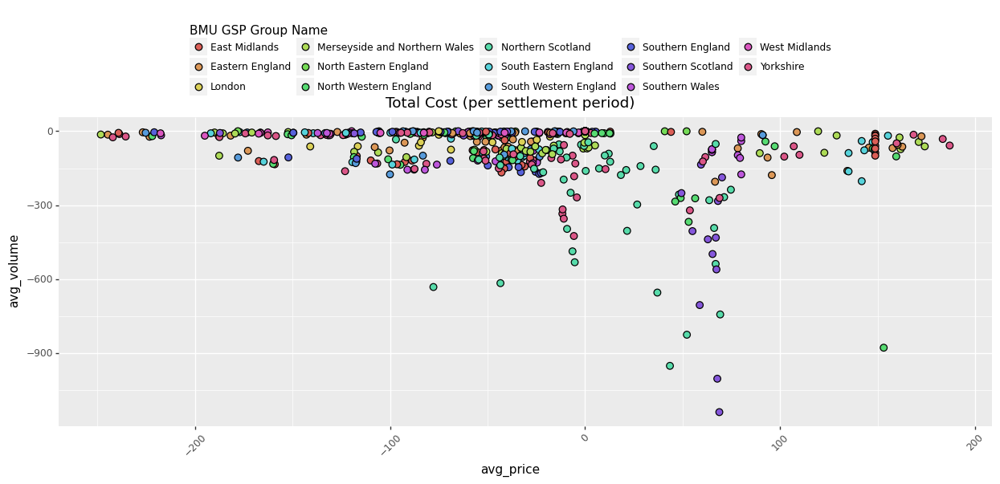

<ggplot: (8771697367401)>

In [ ]:
(ggplot(summary_month[summary_month["avg_price"]<500]) 
 + aes(x="avg_price", y="avg_volume", fill='BMU GSP Group Name')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('Total Cost (per settlement period)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 5), legend_position='top')
)

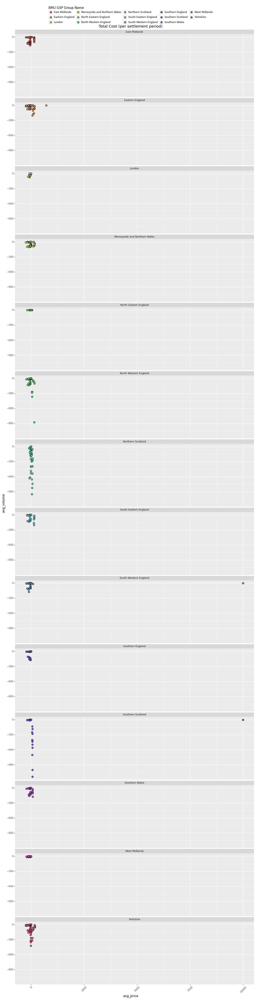

<ggplot: (8771693588823)>

In [ ]:
(ggplot(summary_month) 
 + aes(x="avg_price", y="avg_volume", fill='BMU GSP Group Name')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('Total Cost (per settlement period)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top')
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

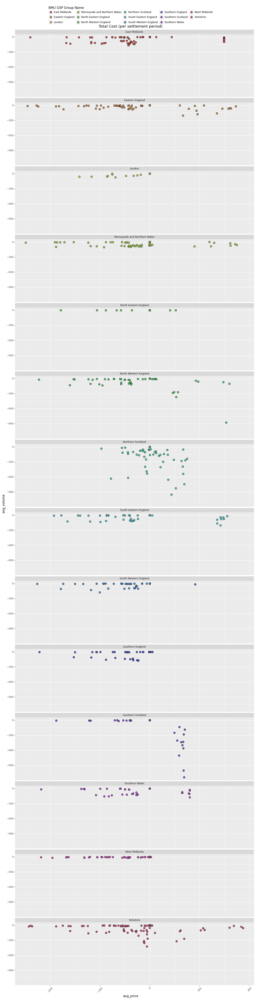

<ggplot: (8771691729635)>

In [ ]:
(ggplot(summary_month[summary_month["avg_price"]<500]) 
 + aes(x="avg_price", y="avg_volume", fill='BMU GSP Group Name')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('Total Cost (per settlement period)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top')
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

##### - GSP breakdown per month

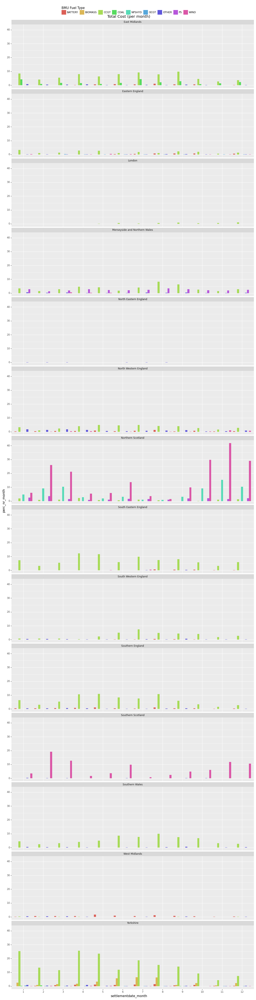

<ggplot: (8771694791158)>

In [ ]:
(ggplot(summary_month) 
 + aes(x="settlementdate_month", y="perc_nr_month", fill='BMU Fuel Type') #, group='settlementdate_month'
 + geom_bar(stat='identity', size=3, position='dodge')
 #+ theme(axis_text_x=element_text(rotation=90))
 + ggtitle('Total Cost (per month)')
 + guides(fill=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top')
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

/usr/local/lib/python3.10/dist-packages/plotnine/facets/facet.py:446: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


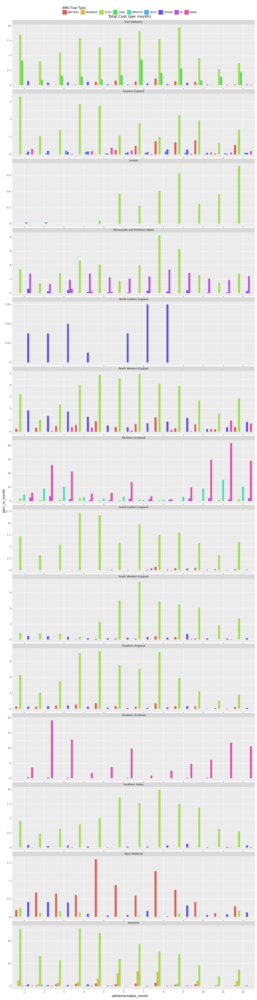

<ggplot: (8771700218556)>

In [ ]:
#(ggplot(data_df[data_df['settlementdate_month'].isin([1,2])])
(ggplot(summary_month) 
 + aes(x="settlementdate_month", y="perc_nr_month", fill='BMU Fuel Type') #, group='settlementdate_month'
 + geom_bar(stat='identity', size=3, position='dodge')
 #+ geom_text(aes(label='perc_nr_month'), stat='identity', va='bottom')
 #+ theme(axis_text_x=element_text(rotation=90))
 + ggtitle('Total Cost (per month)')
 + guides(fill=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top')
 + facet_wrap("BMU GSP Group Name", ncol=1, scales='free')
)

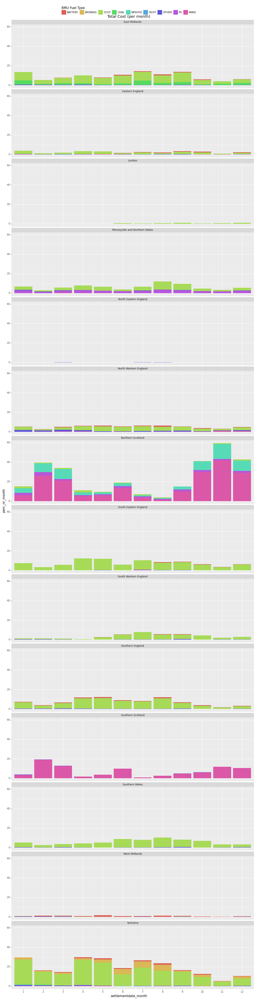

<ggplot: (8771700440677)>

In [ ]:
#(ggplot(data_df[data_df['settlementdate_month'].isin([1,2])])
(ggplot(summary_month) 
 + aes(x="settlementdate_month", y="perc_nr_month", fill='BMU Fuel Type') #, group='settlementdate_month'
 + geom_bar(stat='identity', size=3)
 #+ geom_text(aes(label='perc_nr_month'), stat='identity', va='top')
 #+ theme(axis_text_x=element_text(rotation=90))
 + ggtitle('Total Cost (per month)')
 + guides(fill=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top')
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

/usr/local/lib/python3.10/dist-packages/plotnine/facets/facet.py:446: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


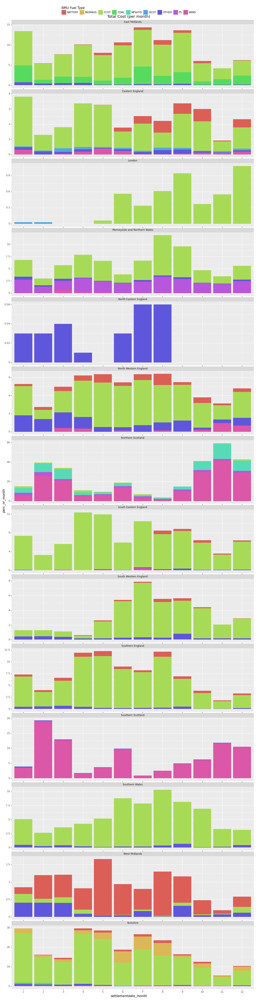

<ggplot: (8771693636212)>

In [ ]:
#(ggplot(data_df[data_df['settlementdate_month'].isin([1,2])])
(ggplot(summary_month) 
 + aes(x="settlementdate_month", y="perc_nr_month", fill='BMU Fuel Type') #, group='settlementdate_month'
 + geom_bar(stat='identity', size=3)
 #+ geom_text(aes(label='perc_nr_month'), stat='identity', va='top')
 #+ theme(axis_text_x=element_text(rotation=90))
 + ggtitle('Total Cost (per month)')
 + guides(fill=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top')
 + facet_wrap("BMU GSP Group Name", ncol=1, scales='free')
)

#### 3.2. OFFERS: DISTRIBUCIÓN DE FUEL TYPE (POR ZONA)

Estacionalidad, Tendencia

##### - Dataset

In [ ]:
data_2021_OFFER = data_2021[data_2021['recordtype']=='BID']
data_2021_OFFER.insert(loc=7, column='nr', value=1)
data_2021_OFFER.head()

,recordtype,settlementdate,settlementdate_year,settlementdate_month,settlementdate_day,settlementperiod,BMU ID,nr,acceptedprice,acceptedvolume,...,BMU Party ID,BMU Party Name,Trading Unit,PC Flag,PC Status,Transmission Loss Factor,Generation Capacity,Demand Capacity,Base TU Flag,FPN Flag
0,BID,2021-01-01,2021,1,1,1,E_GYAR-1,1,37.0,-18.366,...,RWE Generation UK plc,INNOGY01,NaN,NaN,Production (P),0.004895,420.0,-18.0,False (F),True (T)
1,BID,2021-01-01,2021,1,1,1,E_SHOS-1,1,35.0,-0.666,...,VPI Power Limited,SPGEN01,NaN,NaN,Production (P),0.012051,436.0,-16.0,False (F),True (T)
2,BID,2021-01-01,2021,1,1,1,T_CDCL-1,1,40.0,-11.084,...,Uniper UK Limited,EECL,NaN,NaN,Production (P),0.005473,445.0,-12.0,False (F),True (T)
3,BID,2021-01-01,2021,1,1,1,T_MRWD-1,1,37.1,-174.768,...,Marchwood Power Limited,MPL,NaN,NaN,Production (P),0.017790,920.0,-15.0,False (F),True (T)
4,BID,2021-01-01,2021,1,1,1,T_PEMB-11,1,37.0,-33.634,...,RWE Generation UK plc,INNOGY01,Pembroke Power Station,NaN,Production (P),0.009636,475.0,-11.0,False (F),True (T)


In [ ]:
data_2021_BID.columns

Index(['recordtype', 'settlementdate', 'settlementdate_year',
       'settlementdate_month', 'settlementdate_day', 'settlementperiod',
       'BMU ID', 'nr', 'acceptedprice', 'acceptedvolume', 'totalcost',
       'BMU Type', 'BMU Fuel Type', 'BMU GSP Group Id', 'BMU GSP Group Name',
       'LOC LAT', 'LOC LONG', 'GSP LOC Center', 'LOC Center LAT',
       'LOC Center LONG', 'BMU Party ID', 'BMU Party Name', 'Trading Unit',
       'PC Flag', 'PC Status', 'Transmission Loss Factor',
       'Generation Capacity', 'Demand Capacity', 'Base TU Flag', 'FPN Flag'],
      dtype='object')

In [ ]:
'''
['recordtype', 'settlementdate', 'settlementperiod',
'BMU Type', 'BMU Fuel Type', 'BMU GSP Group Name',
'Trading Unit', 'PC Flag', 'PC Status',
'Transmission Loss Factor', 'Generation Capacity', 'Demand Capacity',
'Credit Assessment Load Factor','BMU Credit Assessment Export Capability',
'BMU Credit Assessment Import Capability', 'Exempt Export Flag',
'Base TU Flag', 'FPN Flag', 'Interconnector']
'''

"\n['recordtype', 'settlementdate', 'settlementperiod',\n'BMU Type', 'BMU Fuel Type', 'BMU GSP Group Name',\n'Trading Unit', 'PC Flag', 'PC Status',\n'Transmission Loss Factor', 'Generation Capacity', 'Demand Capacity',\n'Credit Assessment Load Factor','BMU Credit Assessment Export Capability',\n'BMU Credit Assessment Import Capability', 'Exempt Export Flag',\n'Base TU Flag', 'FPN Flag', 'Interconnector']\n"

In [ ]:
selected_cols = ['recordtype', 'settlementdate', 'settlementperiod', 'nr',
                 'acceptedprice', 'acceptedvolume', 'totalcost',
                 'BMU Fuel Type', 'BMU GSP Group Name']

In [ ]:
aggregate_cols = ['settlementdate', 'settlementperiod', 'BMU GSP Group Name', 'BMU Fuel Type']

In [ ]:
data_df = pd.pivot_table(data_2021_OFFER[selected_cols],
                         index=aggregate_cols, 
                         aggfunc={'nr':'sum', 'acceptedvolume':'sum', 'totalcost':'sum'})

data_df = data_df.rename(columns={'acceptedvolume':'totalvolume'})
data_df = data_df.reset_index()
data_df.insert(loc=4, column='averageprice', value=data_df['totalcost']/data_df['totalvolume'])
data_df = data_df[['settlementdate',	'settlementperiod', 'BMU GSP Group Name', 'BMU Fuel Type', 'nr', 'totalvolume',	'averageprice',	'totalcost']]
data_df = data_df.fillna(0)
data_df

,settlementdate,settlementperiod,BMU GSP Group Name,BMU Fuel Type,nr,totalvolume,averageprice,totalcost
0,2021-01-01,1,East Midlands,BATTERY,0,0.000,0.0,0.00
1,2021-01-01,1,East Midlands,BIOMASS,0,0.000,0.0,0.00
2,2021-01-01,1,East Midlands,CCGT,1,-11.084,-40.0,443.36
3,2021-01-01,1,East Midlands,COAL,0,0.000,0.0,0.00
4,2021-01-01,1,East Midlands,NPSHYD,0,0.000,0.0,0.00
...,...,...,...,...,...,...,...,...
2207515,2021-12-31,48,Yorkshire,NPSHYD,0,0.000,0.0,0.00
2207516,2021-12-31,48,Yorkshire,OCGT,0,0.000,0.0,0.00
2207517,2021-12-31,48,Yorkshire,OTHER,0,0.000,0.0,0.00
2207518,2021-12-31,48,Yorkshire,PS,0,0.000,0.0,0.00


In [ ]:
data_df.insert(loc=1, column='settlementdate_year', value=data_df['settlementdate'].dt.year)

order = list(data_df['settlementdate_year'].unique())
order.sort()
data = data_df['settlementdate_year']
data_df['settlementdate_year'] = pd.Categorical(data, order, ordered=True)

In [ ]:
data_df.insert(loc=2, column='settlementdate_month', value=data_df['settlementdate'].dt.month)

order = list(data_df['settlementdate_month'].unique())
order.sort()
data = data_df['settlementdate_month']
data_df['settlementdate_month'] = pd.Categorical(data, order, ordered=True)

In [ ]:
data_df.insert(loc=3, column='settlementdate_day', value=data_df['settlementdate'].dt.day)

order = list(data_df['settlementdate_day'].unique())
order.sort()
data = data_df['settlementdate_day']
data_df['settlementdate_day'] = pd.Categorical(data, order, ordered=True)


In [ ]:
data_df

,settlementdate,settlementdate_year,settlementdate_month,settlementdate_day,settlementperiod,BMU GSP Group Name,BMU Fuel Type,nr,totalvolume,averageprice,totalcost
0,2021-01-01,2021,1,1,1,East Midlands,BATTERY,0,0.000,0.0,0.00
1,2021-01-01,2021,1,1,1,East Midlands,BIOMASS,0,0.000,0.0,0.00
2,2021-01-01,2021,1,1,1,East Midlands,CCGT,1,-11.084,-40.0,443.36
3,2021-01-01,2021,1,1,1,East Midlands,COAL,0,0.000,0.0,0.00
4,2021-01-01,2021,1,1,1,East Midlands,NPSHYD,0,0.000,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...
2207515,2021-12-31,2021,12,31,48,Yorkshire,NPSHYD,0,0.000,0.0,0.00
2207516,2021-12-31,2021,12,31,48,Yorkshire,OCGT,0,0.000,0.0,0.00
2207517,2021-12-31,2021,12,31,48,Yorkshire,OTHER,0,0.000,0.0,0.00
2207518,2021-12-31,2021,12,31,48,Yorkshire,PS,0,0.000,0.0,0.00


##### - Summary table

In [ ]:
data_df.head()

,settlementdate,settlementdate_year,settlementdate_month,settlementdate_day,settlementperiod,BMU GSP Group Name,BMU Fuel Type,nr,totalvolume,averageprice,totalcost
0,2021-01-01,2021,1,1,1,East Midlands,BATTERY,0,0.000,0.0,0.00
1,2021-01-01,2021,1,1,1,East Midlands,BIOMASS,0,0.000,0.0,0.00
2,2021-01-01,2021,1,1,1,East Midlands,CCGT,1,-11.084,-40.0,443.36
3,2021-01-01,2021,1,1,1,East Midlands,COAL,0,0.000,0.0,0.00
4,2021-01-01,2021,1,1,1,East Midlands,NPSHYD,0,0.000,0.0,0.00


In [ ]:
cols = ['settlementdate_year', 'settlementdate_month', 'BMU GSP Group Name', 'BMU Fuel Type',
        'nr', 'perc_nr_month', 'perc_nr_gsp', 'avg_price', 'max_price', 'min_price', 
        'avg_volume', 'max_volume', 'min_volume',
        'perc_avgcost_month', 'perc_avgcost_gsp', 'avg_cost', 'max_cost', 'min_cost']

In [ ]:
summary_month = pd.DataFrame(columns=cols)
summary_month

,settlementdate_year,settlementdate_month,BMU GSP Group Name,BMU Fuel Type,nr,perc_nr_month,perc_nr_gsp,avg_price,max_price,min_price,avg_volume,max_volume,min_volume,perc_avgcost_month,perc_avgcost_gsp,avg_cost,max_cost,min_cost


In [ ]:
years = list(data_df['settlementdate_year'].unique())
months = list(data_df['settlementdate_month'].unique())
gsp_groups = list(data_df['BMU GSP Group Name'].unique())
fuel_types = list(data_df['BMU Fuel Type'].unique())

In [ ]:
i = 0

for x in years:
  for y in months:

    df_month = data_df[(data_df['settlementdate_year']==x)&(data_df['settlementdate_month']==y)&(data_df['totalvolume']!=0)]
    nr_month = round(df_month['nr'].sum(), 0)
    cost_month = round(df_month['totalcost'].sum(), 0)

    for z in gsp_groups:

      df_gsp = data_df[(data_df['settlementdate_year']==x)&(data_df['settlementdate_month']==y)&(data_df['BMU GSP Group Name']==z)&(data_df['totalvolume']!=0)]
      nr_gsp = round(df_gsp['nr'].sum(), 0)
      cost_gsp = round(df_gsp['totalcost'].sum(), 0)

      for u in fuel_types:

        df = data_df[(data_df['settlementdate_year']==x)&(data_df['settlementdate_month']==y)&(data_df['BMU GSP Group Name']==z)&(data_df['BMU Fuel Type']==u)&(data_df['totalvolume']!=0)]

        summary_month.loc[i,'settlementdate_year'] = x
        summary_month.loc[i,'settlementdate_month'] = y
        summary_month.loc[i,'BMU GSP Group Name'] = z
        summary_month.loc[i,'BMU Fuel Type'] = u

        summary_month.loc[i,'nr'] = round(df['nr'].sum(), 0)
        if nr_month != 0:
          summary_month.loc[i,'perc_nr_month'] = round(df['nr'].sum() / nr_month * 100, 2)
        if nr_gsp != 0:
          summary_month.loc[i,'perc_nr_gsp'] = round(df['nr'].sum() / nr_gsp * 100, 2)

        summary_month.loc[i,'avg_price'] = round(df['averageprice'].mean(), 2)
        summary_month.loc[i,'med_price'] = round(df['averageprice'].median(), 2)
        summary_month.loc[i,'max_price'] = round(df['averageprice'].max(), 2)
        summary_month.loc[i,'min_price'] = round(df['averageprice'].min(), 2)

        summary_month.loc[i,'avg_volume'] = round(df['totalvolume'].mean(), 3)
        summary_month.loc[i,'med_volume'] = round(df['totalvolume'].median(), 3)
        summary_month.loc[i,'max_volume'] = round(df['totalvolume'].max(), 3)
        summary_month.loc[i,'min_volume'] = round(df['totalvolume'].min(), 3)

        summary_month.loc[i,'avg_cost'] = round(df['totalcost'].mean(), 2)
        summary_month.loc[i,'med_cost'] = round(df['totalcost'].median(), 2)
        summary_month.loc[i,'max_cost'] = round(df['totalcost'].max(), 2)
        summary_month.loc[i,'min_cost'] = round(df['totalcost'].min(), 2)

        i += 1

summary_month = summary_month.fillna(0)

In [ ]:
order = list(summary_month['settlementdate_year'].unique())
order.sort()
data = summary_month['settlementdate_year']
summary_month['settlementdate_year'] = pd.Categorical(data, order, ordered=True)

In [ ]:
order = list(summary_month['settlementdate_month'].unique())
order.sort()
data = summary_month['settlementdate_month']
summary_month['settlementdate_month'] = pd.Categorical(data, order, ordered=True)

In [ ]:
summary_month

,settlementdate_year,settlementdate_month,BMU GSP Group Name,BMU Fuel Type,nr,perc_nr_month,perc_nr_gsp,avg_price,max_price,min_price,...,max_volume,min_volume,perc_avgcost_month,perc_avgcost_gsp,avg_cost,max_cost,min_cost,med_price,med_volume,med_cost
0,2021,1,East Midlands,BATTERY,0,0.00,0.00,0.00,0.00,0.00,...,0.000,0.000,0,0,0.00,0.00,0.00,0.00,0.000,0.00
1,2021,1,East Midlands,BIOMASS,0,0.00,0.00,0.00,0.00,0.00,...,0.000,0.000,0,0,0.00,0.00,0.00,0.00,0.000,0.00
2,2021,1,East Midlands,CCGT,1502,8.50,63.32,-39.69,-0.00,-60.00,...,-0.001,-919.250,0,0,5041.03,36148.91,0.00,-41.76,-76.623,2804.44
3,2021,1,East Midlands,COAL,737,4.17,31.07,-40.40,-0.00,-52.00,...,-0.001,-659.386,0,0,5003.85,31881.31,0.00,-43.69,-78.096,2989.82
4,2021,1,East Midlands,NPSHYD,0,0.00,0.00,0.00,0.00,0.00,...,0.000,0.000,0,0,0.00,0.00,0.00,0.00,0.000,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1507,2021,12,Yorkshire,NPSHYD,0,0.00,0.00,0.00,0.00,0.00,...,0.000,0.000,0,0,0.00,0.00,0.00,0.00,0.000,0.00
1508,2021,12,Yorkshire,OCGT,38,0.14,1.38,-242.05,-157.00,-325.00,...,-0.534,-48.000,0,0,5922.42,13728.00,139.91,-264.00,-24.000,6172.35
1509,2021,12,Yorkshire,OTHER,66,0.25,2.41,-235.46,-160.00,-297.02,...,-0.008,-54.215,0,0,4997.98,15475.23,2.23,-258.60,-18.568,4788.20
1510,2021,12,Yorkshire,PS,0,0.00,0.00,0.00,0.00,0.00,...,0.000,0.000,0,0,0.00,0.00,0.00,0.00,0.000,0.00


In [ ]:
summary_month[(summary_month['settlementdate_month']==1)&(summary_month['BMU GSP Group Name'].isin(['East Midlands', 'Southern England', 'Yorkshire']))]

,settlementdate_year,settlementdate_month,BMU GSP Group Name,BMU Fuel Type,nr,perc_nr_month,perc_nr_gsp,avg_price,max_price,min_price,...,max_volume,min_volume,perc_avgcost_month,perc_avgcost_gsp,avg_cost,max_cost,min_cost,med_price,med_volume,med_cost
0,2021,1,East Midlands,BATTERY,0,0.00,0.00,0.00,0.00,0.00,...,0.000,0.000,0,0,0.00,0.00,0.00,0.00,0.000,0.00
1,2021,1,East Midlands,BIOMASS,0,0.00,0.00,0.00,0.00,0.00,...,0.000,0.000,0,0,0.00,0.00,0.00,0.00,0.000,0.00
2,2021,1,East Midlands,CCGT,1502,8.50,63.32,-39.69,-0.00,-60.00,...,-0.001,-919.250,0,0,5041.03,36148.91,0.00,-41.76,-76.623,2804.44
3,2021,1,East Midlands,COAL,737,4.17,31.07,-40.40,-0.00,-52.00,...,-0.001,-659.386,0,0,5003.85,31881.31,0.00,-43.69,-78.096,2989.82
4,2021,1,East Midlands,NPSHYD,0,0.00,0.00,0.00,0.00,0.00,...,0.000,0.000,0,0,0.00,0.00,0.00,0.00,0.000,0.00
5,2021,1,East Midlands,OCGT,4,0.02,0.17,-75.00,-75.00,-75.00,...,-1.500,-12.166,0,0,512.48,912.45,112.50,-75.00,-6.833,512.48
6,2021,1,East Midlands,OTHER,127,0.72,5.35,-51.54,-25.00,-85.00,...,-0.003,-32.000,0,0,436.24,1776.00,0.14,-53.00,-3.134,148.41
7,2021,1,East Midlands,PS,0,0.00,0.00,0.00,0.00,0.00,...,0.000,0.000,0,0,0.00,0.00,0.00,0.00,0.000,0.00
8,2021,1,East Midlands,WIND,2,0.01,0.08,148.68,148.68,148.68,...,-8.716,-12.070,0,0,-1545.23,-1295.89,-1794.57,148.68,-10.393,-1545.23
81,2021,1,Southern England,BATTERY,82,0.46,6.33,-19.18,47.45,-71.00,...,-0.001,-16.000,0,0,56.34,800.00,-217.54,-11.80,-2.084,16.90


In [ ]:
cols = ['settlementdate_year', 'BMU GSP Group Name', 'BMU Fuel Type',
        'nr', 'perc_nr_month', 'perc_nr_gsp', 'avg_price', 'max_price', 'min_price', 
        'avg_volume', 'max_volume', 'min_volume',
        'perc_avgcost_month', 'perc_avgcost_gsp', 'avg_cost', 'max_cost', 'min_cost', 'totalcost']

In [ ]:
summary_year = pd.DataFrame(columns=cols)
summary_year

,settlementdate_year,BMU GSP Group Name,BMU Fuel Type,nr,perc_nr_month,perc_nr_gsp,avg_price,max_price,min_price,avg_volume,max_volume,min_volume,perc_avgcost_month,perc_avgcost_gsp,avg_cost,max_cost,min_cost,totalcost


In [ ]:
years = list(data_df['settlementdate_year'].unique())
gsp_groups = list(data_df['BMU GSP Group Name'].unique())
fuel_types = list(data_df['BMU Fuel Type'].unique())

In [ ]:
i = 0

for x in years:

    df_year = data_df[(data_df['settlementdate_year']==x)&(data_df['totalvolume']!=0)]
    nr_year = round(df_month['nr'].sum(), 0)
    cost_year = round(df_month['totalcost'].sum(), 0)

    for z in gsp_groups:

      df_gsp = data_df[(data_df['settlementdate_year']==x)&(data_df['BMU GSP Group Name']==z)&(data_df['totalvolume']!=0)]
      nr_gsp = round(df_gsp['nr'].sum(), 0)
      cost_gsp = round(df_gsp['totalcost'].sum(), 0)

      for u in fuel_types:

        df = data_df[(data_df['settlementdate_year']==x)&(data_df['BMU GSP Group Name']==z)&(data_df['BMU Fuel Type']==u)&(data_df['totalvolume']!=0)]

        summary_year.loc[i,'settlementdate_year'] = x
        summary_year.loc[i,'BMU GSP Group Name'] = z
        summary_year.loc[i,'BMU Fuel Type'] = u

        summary_year.loc[i,'nr'] = round(df['nr'].sum(), 0)
        if nr_year != 0:
          summary_year.loc[i,'perc_nr_year'] = round(df['nr'].sum() / nr_year * 100, 2)
        if nr_gsp != 0:
          summary_year.loc[i,'perc_nr_gsp'] = round(df['nr'].sum() / nr_gsp * 100, 2)

        summary_year.loc[i,'avg_price'] = round(df['averageprice'].mean(), 2)
        summary_year.loc[i,'med_price'] = round(df['averageprice'].median(), 2)
        summary_year.loc[i,'max_price'] = round(df['averageprice'].max(), 2)
        summary_year.loc[i,'min_price'] = round(df['averageprice'].min(), 2)

        summary_year.loc[i,'avg_volume'] = round(df['totalvolume'].mean(), 3)
        summary_year.loc[i,'med_volume'] = round(df['totalvolume'].median(), 3)
        summary_year.loc[i,'max_volume'] = round(df['totalvolume'].max(), 3)
        summary_year.loc[i,'min_volume'] = round(df['totalvolume'].min(), 3)

        summary_year.loc[i,'avg_cost'] = round(df['totalcost'].mean(), 2)
        summary_year.loc[i,'med_cost'] = round(df['totalcost'].median(), 2)
        summary_year.loc[i,'max_cost'] = round(df['totalcost'].max(), 2)
        summary_year.loc[i,'min_cost'] = round(df['totalcost'].min(), 2)
        summary_year.loc[i,'totalcost'] = round(df['totalcost'].min(), 2)

        i += 1

summary_year = summary_year.fillna(0)

In [ ]:
order = list(summary_year['settlementdate_year'].unique())
order.sort()
data = summary_year['settlementdate_year']
summary_year['settlementdate_year'] = pd.Categorical(data, order, ordered=True)

In [ ]:
summary_year

,settlementdate_year,BMU GSP Group Name,BMU Fuel Type,nr,perc_nr_month,perc_nr_gsp,avg_price,max_price,min_price,avg_volume,...,perc_avgcost_month,perc_avgcost_gsp,avg_cost,max_cost,min_cost,totalcost,perc_nr_year,med_price,med_volume,med_cost
0,2021,East Midlands,BATTERY,805,0,3.68,-34.20,50.00,-225.71,-1.886,...,0,0,57.33,996.88,-129.10,-129.10,3.06,-33.57,-1.317,28.28
1,2021,East Midlands,BIOMASS,0,0,0.00,0.00,0.00,0.00,0.000,...,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.000,0.00
2,2021,East Midlands,CCGT,15335,0,70.16,-63.06,-0.00,-281.00,-111.816,...,0,0,7161.71,165250.00,0.00,0.00,58.24,-48.95,-69.320,3344.94
3,2021,East Midlands,COAL,4922,0,22.52,-74.63,-0.00,-235.00,-112.625,...,0,0,8828.75,97659.45,0.00,0.00,18.69,-58.10,-79.334,4692.54
4,2021,East Midlands,NPSHYD,0,0,0.00,0.00,0.00,0.00,0.000,...,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.000,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121,2021,Yorkshire,NPSHYD,0,0,0.00,0.00,0.00,0.00,0.000,...,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.000,0.00
122,2021,Yorkshire,OCGT,362,0,0.81,-111.25,-40.11,-380.00,-19.297,...,0,0,2205.04,13728.00,0.09,0.09,1.37,-84.50,-14.400,1253.92
123,2021,Yorkshire,OTHER,830,0,1.85,-76.19,-10.00,-297.02,-16.382,...,0,0,1294.93,15475.23,0.05,0.05,3.15,-50.44,-10.717,585.62
124,2021,Yorkshire,PS,0,0,0.00,0.00,0.00,0.00,0.000,...,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.000,0.00


In [ ]:
summary_year[summary_year['BMU GSP Group Name'].isin(['East Midlands', 'Southern England', 'Yorkshire'])]

,settlementdate_year,BMU GSP Group Name,BMU Fuel Type,nr,perc_nr_month,perc_nr_gsp,avg_price,max_price,min_price,avg_volume,...,perc_avgcost_month,perc_avgcost_gsp,avg_cost,max_cost,min_cost,totalcost,perc_nr_year,med_price,med_volume,med_cost
0,2021,East Midlands,BATTERY,805,0,3.68,-34.20,50.00,-225.71,-1.886,...,0,0,57.33,996.88,-129.10,-129.10,3.06,-33.57,-1.317,28.28
1,2021,East Midlands,BIOMASS,0,0,0.00,0.00,0.00,0.00,0.000,...,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.000,0.00
2,2021,East Midlands,CCGT,15335,0,70.16,-63.06,-0.00,-281.00,-111.816,...,0,0,7161.71,165250.00,0.00,0.00,58.24,-48.95,-69.320,3344.94
3,2021,East Midlands,COAL,4922,0,22.52,-74.63,-0.00,-235.00,-112.625,...,0,0,8828.75,97659.45,0.00,0.00,18.69,-58.10,-79.334,4692.54
4,2021,East Midlands,NPSHYD,0,0,0.00,0.00,0.00,0.00,0.000,...,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.000,0.00
5,2021,East Midlands,OCGT,8,0,0.04,-70.83,-50.00,-75.00,-9.414,...,0,0,702.90,1275.00,37.50,37.50,0.03,-75.00,-10.116,758.70
6,2021,East Midlands,OTHER,729,0,3.34,-75.95,-10.00,-293.84,-7.706,...,0,0,573.44,8973.33,0.01,0.01,2.77,-53.83,-2.384,164.60
7,2021,East Midlands,PS,0,0,0.00,0.00,0.00,0.00,0.000,...,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.000,0.00
8,2021,East Midlands,WIND,58,0,0.27,148.68,148.68,148.68,-53.095,...,0,0,-7894.12,-1034.22,-29391.66,-29391.66,0.22,148.68,-28.080,-4174.93
81,2021,Southern England,BATTERY,1359,0,8.35,-31.67,75.95,-498.08,-2.393,...,0,0,83.42,3271.68,-510.77,-510.77,5.16,-15.00,-1.500,16.00


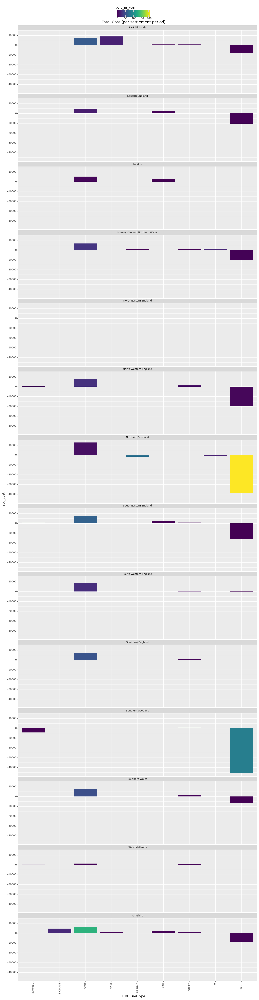

<ggplot: (8771693517530)>

In [ ]:
(ggplot(summary_year) 
 + aes(x="BMU Fuel Type", y="avg_cost", fill='perc_nr_year')
 + geom_bar(stat='identity', size=3)
 + theme(axis_text_x=element_text(rotation=90))
 + ggtitle('Total Cost (per settlement period)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top')
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

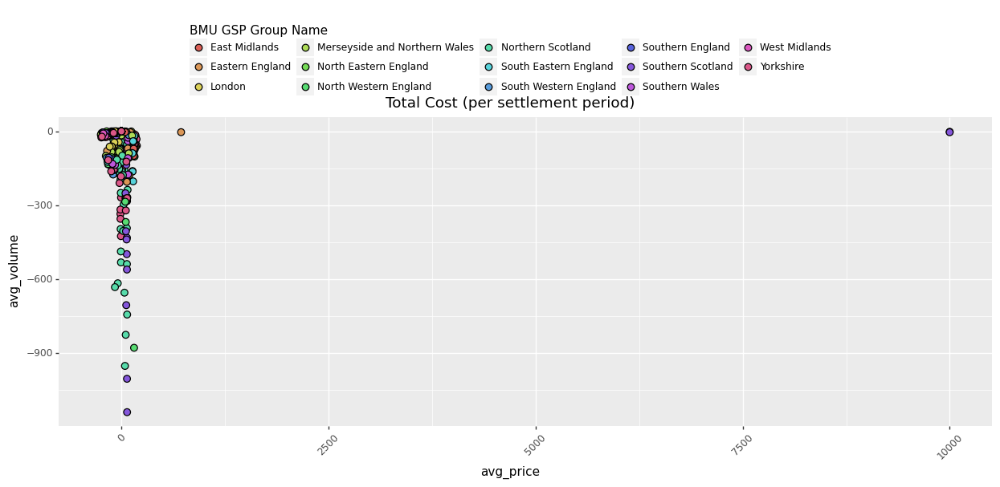

<ggplot: (8771697714747)>

In [ ]:
(ggplot(summary_month) 
 + aes(x="avg_price", y="avg_volume", fill='BMU GSP Group Name')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('Total Cost (per settlement period)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 5), legend_position='top')
)

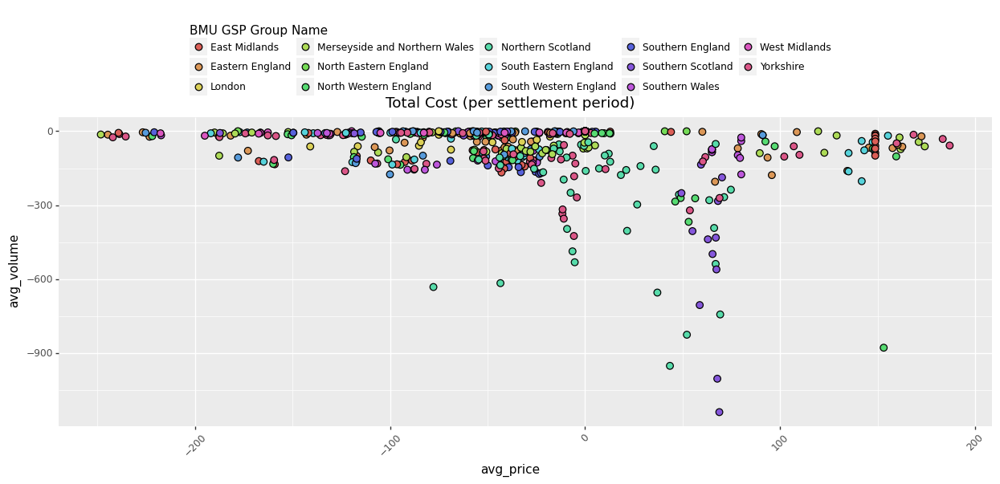

<ggplot: (8771700273513)>

In [ ]:
(ggplot(summary_month[summary_month["avg_price"]<500]) 
 + aes(x="avg_price", y="avg_volume", fill='BMU GSP Group Name')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('Total Cost (per settlement period)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 5), legend_position='top')
)

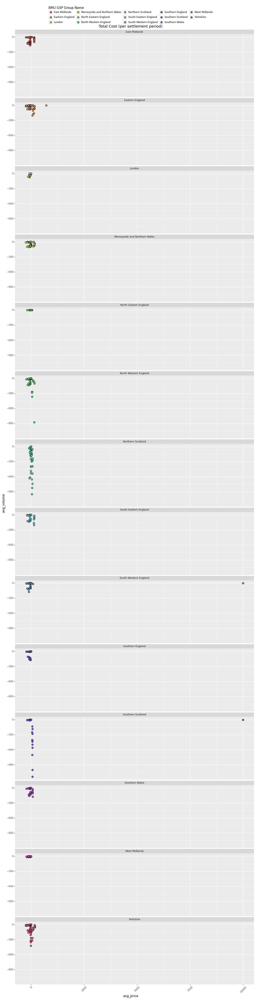

<ggplot: (8771697456495)>

In [ ]:
(ggplot(summary_month) 
 + aes(x="avg_price", y="avg_volume", fill='BMU GSP Group Name')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('Total Cost (per settlement period)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top')
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

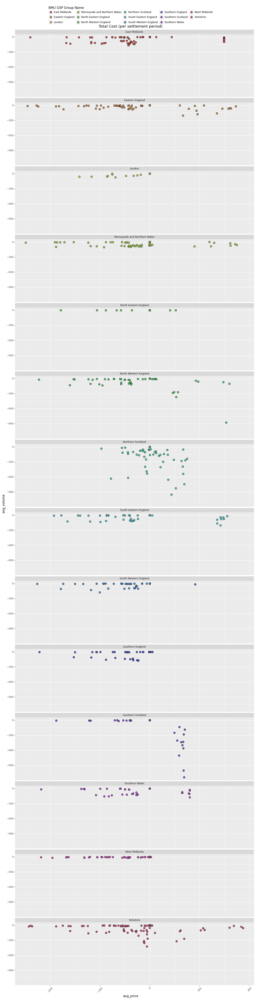

<ggplot: (8771700952155)>

In [ ]:
(ggplot(summary_month[summary_month["avg_price"]<500]) 
 + aes(x="avg_price", y="avg_volume", fill='BMU GSP Group Name')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('Total Cost (per settlement period)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top')
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

##### - GSP breakdown per month

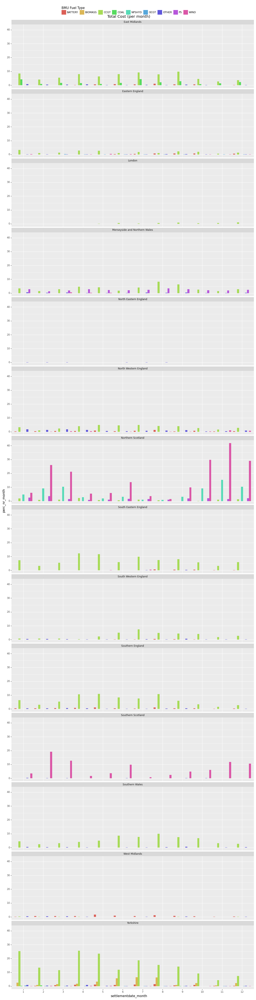

<ggplot: (8771697613515)>

In [ ]:
(ggplot(summary_month) 
 + aes(x="settlementdate_month", y="perc_nr_month", fill='BMU Fuel Type') #, group='settlementdate_month'
 + geom_bar(stat='identity', size=3, position='dodge')
 #+ theme(axis_text_x=element_text(rotation=90))
 + ggtitle('Total Cost (per month)')
 + guides(fill=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top')
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

/usr/local/lib/python3.10/dist-packages/plotnine/facets/facet.py:446: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


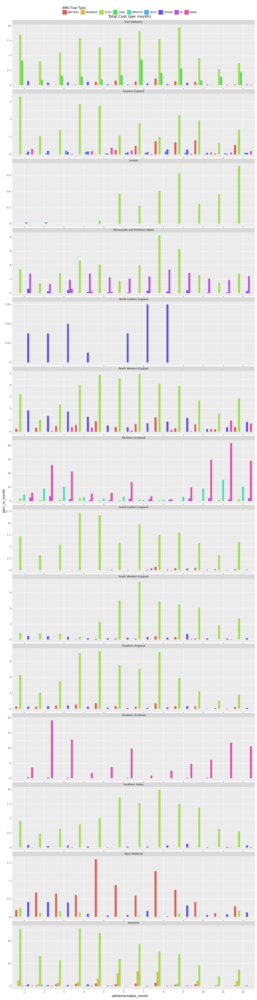

<ggplot: (8771697390932)>

In [ ]:
#(ggplot(data_df[data_df['settlementdate_month'].isin([1,2])])
(ggplot(summary_month) 
 + aes(x="settlementdate_month", y="perc_nr_month", fill='BMU Fuel Type') #, group='settlementdate_month'
 + geom_bar(stat='identity', size=3, position='dodge')
 #+ geom_text(aes(label='perc_nr_month'), stat='identity', va='bottom')
 #+ theme(axis_text_x=element_text(rotation=90))
 + ggtitle('Total Cost (per month)')
 + guides(fill=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top')
 + facet_wrap("BMU GSP Group Name", ncol=1, scales='free')
)

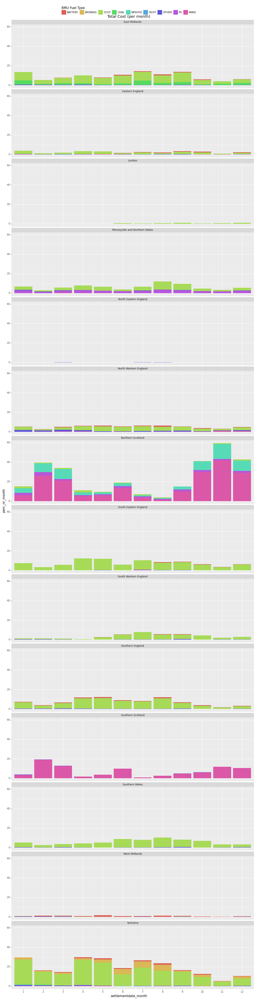

<ggplot: (8771694102102)>

In [ ]:
#(ggplot(data_df[data_df['settlementdate_month'].isin([1,2])])
(ggplot(summary_month) 
 + aes(x="settlementdate_month", y="perc_nr_month", fill='BMU Fuel Type') #, group='settlementdate_month'
 + geom_bar(stat='identity', size=3)
 #+ geom_text(aes(label='perc_nr_month'), stat='identity', va='top')
 #+ theme(axis_text_x=element_text(rotation=90))
 + ggtitle('Total Cost (per month)')
 + guides(fill=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top')
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

/usr/local/lib/python3.10/dist-packages/plotnine/facets/facet.py:446: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


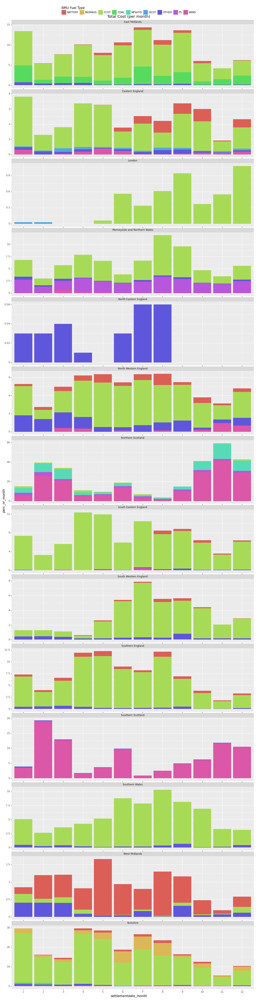

<ggplot: (8771694464550)>

In [ ]:
#(ggplot(data_df[data_df['settlementdate_month'].isin([1,2])])
(ggplot(summary_month) 
 + aes(x="settlementdate_month", y="perc_nr_month", fill='BMU Fuel Type') #, group='settlementdate_month'
 + geom_bar(stat='identity', size=3)
 #+ geom_text(aes(label='perc_nr_month'), stat='identity', va='top')
 #+ theme(axis_text_x=element_text(rotation=90))
 + ggtitle('Total Cost (per month)')
 + guides(fill=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top')
 + facet_wrap("BMU GSP Group Name", ncol=1, scales='free')
)

#### 4. DISTRIBUCIÓN DE PC Status (POR ZONA)

Estacionalidad, Tendencia

- Por settlement period
- Por día
- Por semana
- Por mes

#### 5.1. VALORES MEDIOS, MÍNIMOS Y MÁXIMOS DE CAP. GENERACIÓN DE LAS BMUs (POR ZONA)

Estacionalidad, Tendencia

- Por settlement period
- Por día
- Por semana
- Por mes
- Por año

#### 5.2. VALORES MEDIOS, MÍNIMOS Y MÁXIMOS DE CAP. CONSUMO DE LAS BMUs (POR ZONA)

Estacionalidad, Tendencia

- Por settlement period
- Por día
- Por semana
- Por mes
- Por año

#### 5.3. VALORES MEDIOS, MÍNIMOS Y MÁXIMOS DE TLF DE LAS BMUs (POR ZONA)

Estacionalidad, Tendencia

- Por settlement period
- Por día
- Por semana
- Por mes
- Por año

## ANALYSIS / INSIGHTS (2021-2023)

#### LOADING THE DATASET

In [11]:
#file_path = 'C:/Users/FAL/Desktop/QEnergy/Data/Data/data_final.csv'
file_path = '/content/drive/MyDrive/QEnergy/Data/data_final.csv'

In [12]:
data_final = pd.read_csv(file_path)
#data_final = data_final.loc[600000:700000,:]
data_final.insert(loc=9, column='totalcost', value=data_final['acceptedprice']*abs(data_final['acceptedvolume']))
data_final

,recordtype,settlementdate,settlementdate_year,settlementdate_month,settlementdate_day,settlementperiod,BMU ID,acceptedprice,acceptedvolume,totalcost,...,Transmission Loss Factor,Generation Capacity,Demand Capacity,Credit Assessment Load Factor,BMU Credit Assessment Export Capability,BMU Credit Assessment Import Capability,Exempt Export Flag,Base TU Flag,FPN Flag,Interconnector
0,BID,2021-01-01,2021,1,1,1,E_GYAR-1,37.0,-18.366,679.5420,...,0.004895,420.0,-18.0,NaN,NaN,NaN,False (F),False (F),True (T),NaN
1,BID,2021-01-01,2021,1,1,1,E_SHOS-1,35.0,-0.666,23.3100,...,0.012051,436.0,-16.0,NaN,NaN,NaN,False (F),False (F),True (T),NaN
2,BID,2021-01-01,2021,1,1,1,T_CDCL-1,40.0,-11.084,443.3600,...,0.005473,445.0,-12.0,NaN,NaN,NaN,False (F),False (F),True (T),NaN
3,BID,2021-01-01,2021,1,1,1,T_MRWD-1,37.1,-174.768,6483.8928,...,0.017790,920.0,-15.0,NaN,NaN,NaN,False (F),False (F),True (T),NaN
4,BID,2021-01-01,2021,1,1,1,T_PEMB-11,37.0,-33.634,1244.4580,...,0.009636,475.0,-11.0,NaN,NaN,NaN,False (F),False (F),True (T),NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1044179,OFFER,2023-03-01,2023,3,1,9,T_CNQPS-2,159.0,230.000,36570.0000,...,0.002671,352.0,-20.0,NaN,NaN,NaN,False (F),False (F),True (T),NaN
1044180,OFFER,2023-03-01,2023,3,1,9,T_PEMB-11,150.0,16.430,2464.5000,...,0.005824,475.0,-11.0,NaN,NaN,NaN,False (F),False (F),True (T),NaN
1044181,OFFER,2023-03-01,2023,3,1,9,T_SEAB-1,165.0,476.000,78540.0000,...,0.012720,830.0,-11.0,NaN,NaN,NaN,False (F),False (F),True (T),NaN
1044182,OFFER,2023-03-01,2023,3,1,9,T_SHBA-1,200.0,0.432,86.4000,...,-0.005257,821.4,-10.0,NaN,NaN,NaN,False (F),False (F),True (T),NaN


In [13]:
drop_cols = ['Credit Assessment Load Factor','BMU Credit Assessment Export Capability',
             'BMU Credit Assessment Import Capability','Exempt Export Flag','Interconnector']
data_final = data_final.drop(drop_cols, axis=1)

In [14]:
data_final['settlementdate'] = pd.to_datetime(data_final['settlementdate'])
data_final['settlementdate_year'] = data_final['settlementdate_year'].astype('category')
data_final['settlementdate_month'] = data_final['settlementdate_month'].astype('category')
data_final['settlementdate_day'] = data_final['settlementdate_day'].astype('category')
data_final['settlementperiod'] = data_final['settlementperiod'].astype('category')

In [15]:
data_final.columns

Index(['recordtype', 'settlementdate', 'settlementdate_year',
       'settlementdate_month', 'settlementdate_day', 'settlementperiod',
       'BMU ID', 'acceptedprice', 'acceptedvolume', 'totalcost', 'BMU Type',
       'BMU Fuel Type', 'BMU GSP Group Id', 'BMU GSP Group Name', 'LOC LAT',
       'LOC LONG', 'GSP LOC Center', 'LOC Center LAT', 'LOC Center LONG',
       'BMU Party ID', 'BMU Party Name', 'Trading Unit', 'PC Flag',
       'PC Status', 'Transmission Loss Factor', 'Generation Capacity',
       'Demand Capacity', 'Base TU Flag', 'FPN Flag'],
      dtype='object')

In [16]:
data_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1044184 entries, 0 to 1044183
Data columns (total 29 columns):
 #   Column                    Non-Null Count    Dtype         
---  ------                    --------------    -----         
 0   recordtype                1044184 non-null  object        
 1   settlementdate            1044184 non-null  datetime64[ns]
 2   settlementdate_year       1044184 non-null  category      
 3   settlementdate_month      1044184 non-null  category      
 4   settlementdate_day        1044184 non-null  category      
 5   settlementperiod          1044184 non-null  category      
 6   BMU ID                    1044184 non-null  object        
 7   acceptedprice             1044184 non-null  float64       
 8   acceptedvolume            1044184 non-null  float64       
 9   totalcost                 1044184 non-null  float64       
 10  BMU Type                  1044184 non-null  object        
 11  BMU Fuel Type             1044184 non-null  object

In [17]:
data_final[(data_final['BMU Party ID'].str.contains('Stat'))&(data_final['BMU Fuel Type']=='BATTERY')]

,recordtype,settlementdate,settlementdate_year,settlementdate_month,settlementdate_day,settlementperiod,BMU ID,acceptedprice,acceptedvolume,totalcost,...,BMU Party ID,BMU Party Name,Trading Unit,PC Flag,PC Status,Transmission Loss Factor,Generation Capacity,Demand Capacity,Base TU Flag,FPN Flag
57248,BID,2021-03-11,2021,3,11,36,2__MSTAT001,13.630,-3.284,44.76092,...,Statkraft Markets Gmbh,STATKRA1,DEFAULT__M,NaN,Consumption (C),-0.006038,50.000,-50.000,True (T),True (T)
57448,BID,2021-03-11,2021,3,11,40,2__MSTAT001,12.785,-1.434,18.33369,...,Statkraft Markets Gmbh,STATKRA1,DEFAULT__M,NaN,Consumption (C),-0.006038,50.000,-50.000,True (T),True (T)
58699,BID,2021-03-12,2021,3,12,17,2__MSTAT001,21.460,-6.758,145.02668,...,Statkraft Markets Gmbh,STATKRA1,DEFAULT__M,NaN,Consumption (C),-0.006038,50.000,-50.000,True (T),True (T)
58854,BID,2021-03-12,2021,3,12,22,2__MSTAT001,9.980,-17.050,170.15900,...,Statkraft Markets Gmbh,STATKRA1,DEFAULT__M,NaN,Consumption (C),-0.006038,50.000,-50.000,True (T),True (T)
59050,BID,2021-03-12,2021,3,12,28,2__MSTAT001,16.435,-18.332,301.28642,...,Statkraft Markets Gmbh,STATKRA1,DEFAULT__M,NaN,Consumption (C),-0.006038,50.000,-50.000,True (T),True (T)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1043632,OFFER,2023-02-26,2023,2,26,48,2__MSTAT001,192.835,12.302,2372.25617,...,Statkraft Markets Gmbh,STATKRA1,DEFAULT__M,NaN,Consumption (C),-0.005257,50.403,-51.021,True (T),True (T)
1043656,OFFER,2023-02-27,2023,2,27,8,2__MSTAT001,132.010,11.250,1485.11250,...,Statkraft Markets Gmbh,STATKRA1,DEFAULT__M,NaN,Consumption (C),-0.005257,50.403,-51.021,True (T),True (T)
1043671,OFFER,2023-02-27,2023,2,27,11,2__MSTAT001,135.730,10.834,1470.49882,...,Statkraft Markets Gmbh,STATKRA1,DEFAULT__M,NaN,Consumption (C),-0.005257,50.403,-51.021,True (T),True (T)
1043994,OFFER,2023-02-28,2023,2,28,15,2__MSTAT001,147.940,13.160,1946.89040,...,Statkraft Markets Gmbh,STATKRA1,DEFAULT__M,NaN,Consumption (C),-0.005257,50.403,-51.021,True (T),True (T)


#### 1.1. BIDS: VALORES MEDIOS, MÍNIMOS Y MÁXIMOS DE PRECIO&VOLUMEN + Nº OFERTAS (POR ZONA)

Uno de los mayores drivers es la localización (volumen medio, precio medio, precio por volumen, precio máximo, número de ofertas aprobadas)

Estacionalidad, Tendencia


##### - Dataset

In [18]:
data_final_BID = data_final[data_final['recordtype']=='BID']
data_final_BID.insert(loc=7, column='nr', value=1)
data_final_BID.head()

,recordtype,settlementdate,settlementdate_year,settlementdate_month,settlementdate_day,settlementperiod,BMU ID,nr,acceptedprice,acceptedvolume,...,BMU Party ID,BMU Party Name,Trading Unit,PC Flag,PC Status,Transmission Loss Factor,Generation Capacity,Demand Capacity,Base TU Flag,FPN Flag
0,BID,2021-01-01,2021,1,1,1,E_GYAR-1,1,37.0,-18.366,...,RWE Generation UK plc,INNOGY01,NaN,NaN,Production (P),0.004895,420.0,-18.0,False (F),True (T)
1,BID,2021-01-01,2021,1,1,1,E_SHOS-1,1,35.0,-0.666,...,VPI Power Limited,SPGEN01,NaN,NaN,Production (P),0.012051,436.0,-16.0,False (F),True (T)
2,BID,2021-01-01,2021,1,1,1,T_CDCL-1,1,40.0,-11.084,...,Uniper UK Limited,EECL,NaN,NaN,Production (P),0.005473,445.0,-12.0,False (F),True (T)
3,BID,2021-01-01,2021,1,1,1,T_MRWD-1,1,37.1,-174.768,...,Marchwood Power Limited,MPL,NaN,NaN,Production (P),0.017790,920.0,-15.0,False (F),True (T)
4,BID,2021-01-01,2021,1,1,1,T_PEMB-11,1,37.0,-33.634,...,RWE Generation UK plc,INNOGY01,Pembroke Power Station,NaN,Production (P),0.009636,475.0,-11.0,False (F),True (T)


In [19]:
selected_cols = ['recordtype', 'settlementdate','settlementperiod', 'nr',
                 'acceptedvolume', 'totalcost', 'BMU GSP Group Name']

In [20]:
aggregate_cols = ['recordtype', 'settlementdate', 'settlementperiod', 'BMU GSP Group Name']

In [21]:
data_df = pd.pivot_table(data_final_BID[selected_cols],
                         index=aggregate_cols, 
                         aggfunc={'nr':'sum', 'acceptedvolume':'sum', 'totalcost':'sum'})

data_df = data_df.rename(columns={'acceptedvolume':'totalvolume'})
data_df = data_df.reset_index()
data_df.insert(loc=4, column='averageprice', value=( data_df['totalcost'] / abs(data_df['totalvolume']) ))
data_df = data_df[['recordtype','settlementdate',	'settlementperiod', 'BMU GSP Group Name', 'nr', 'totalvolume',	'averageprice',	'totalcost']]
data_df = data_df.fillna(0)
data_df

,recordtype,settlementdate,settlementperiod,BMU GSP Group Name,nr,totalvolume,averageprice,totalcost
0,BID,2021-01-01,1,East Midlands,1,-11.084,40.0,443.360
1,BID,2021-01-01,1,Eastern England,1,-18.366,37.0,679.542
2,BID,2021-01-01,1,London,0,0.000,0.0,0.000
3,BID,2021-01-01,1,Merseyside and Northern Wales,0,0.000,0.0,0.000
4,BID,2021-01-01,1,North Eastern England,0,0.000,0.0,0.000
...,...,...,...,...,...,...,...,...
530203,BID,2023-03-01,48,Southern England,0,0.000,0.0,0.000
530204,BID,2023-03-01,48,Southern Scotland,0,0.000,0.0,0.000
530205,BID,2023-03-01,48,Southern Wales,0,0.000,0.0,0.000
530206,BID,2023-03-01,48,West Midlands,0,0.000,0.0,0.000


In [22]:
data_df.insert(loc=1, column='settlementdate_year', value=data_df['settlementdate'].dt.year)

order = list(data_df['settlementdate_year'].unique())
order.sort()
data = data_df['settlementdate_year']
data_df['settlementdate_year'] = pd.Categorical(data, order, ordered=True)

In [23]:
data_df.insert(loc=2, column='settlementdate_month', value=data_df['settlementdate'].dt.month)

order = list(data_df['settlementdate_month'].unique())
order.sort()
data = data_df['settlementdate_month']
data_df['settlementdate_month'] = pd.Categorical(data, order, ordered=True)

In [24]:
data_df.insert(loc=3, column='settlementdate_day', value=data_df['settlementdate'].dt.day)

order = list(data_df['settlementdate_day'].unique())
order.sort()
data = data_df['settlementdate_day']
data_df['settlementdate_day'] = pd.Categorical(data, order, ordered=True)


In [25]:
data_df

,recordtype,settlementdate_year,settlementdate_month,settlementdate_day,settlementdate,settlementperiod,BMU GSP Group Name,nr,totalvolume,averageprice,totalcost
0,BID,2021,1,1,2021-01-01,1,East Midlands,1,-11.084,40.0,443.360
1,BID,2021,1,1,2021-01-01,1,Eastern England,1,-18.366,37.0,679.542
2,BID,2021,1,1,2021-01-01,1,London,0,0.000,0.0,0.000
3,BID,2021,1,1,2021-01-01,1,Merseyside and Northern Wales,0,0.000,0.0,0.000
4,BID,2021,1,1,2021-01-01,1,North Eastern England,0,0.000,0.0,0.000
...,...,...,...,...,...,...,...,...,...,...,...
530203,BID,2023,3,1,2023-03-01,48,Southern England,0,0.000,0.0,0.000
530204,BID,2023,3,1,2023-03-01,48,Southern Scotland,0,0.000,0.0,0.000
530205,BID,2023,3,1,2023-03-01,48,Southern Wales,0,0.000,0.0,0.000
530206,BID,2023,3,1,2023-03-01,48,West Midlands,0,0.000,0.0,0.000


##### - Summary table

In [26]:
data_df.head()

,recordtype,settlementdate_year,settlementdate_month,settlementdate_day,settlementdate,settlementperiod,BMU GSP Group Name,nr,totalvolume,averageprice,totalcost
0,BID,2021,1,1,2021-01-01,1,East Midlands,1,-11.084,40.0,443.360
1,BID,2021,1,1,2021-01-01,1,Eastern England,1,-18.366,37.0,679.542
2,BID,2021,1,1,2021-01-01,1,London,0,0.000,0.0,0.000
3,BID,2021,1,1,2021-01-01,1,Merseyside and Northern Wales,0,0.000,0.0,0.000
4,BID,2021,1,1,2021-01-01,1,North Eastern England,0,0.000,0.0,0.000


In [27]:
cols = ['recordtype', 'settlementdate_year', 'settlementdate_month', 'BMU GSP Group Name',
        'perc_nr_month', 'nr', 'avg_price', 'med_price', 'max_price', 'min_price', 
        'avg_volume', 'med_volume', 'max_volume', 'min_volume',
        'perc_totalcost_month', 'totalcost', 'avg_cost', 'med_cost', 'max_cost', 'min_cost']

In [28]:
summary_month = pd.DataFrame(columns=cols)
summary_month

,recordtype,settlementdate_year,settlementdate_month,BMU GSP Group Name,perc_nr_month,nr,avg_price,med_price,max_price,min_price,avg_volume,med_volume,max_volume,min_volume,perc_totalcost_month,totalcost,avg_cost,med_cost,max_cost,min_cost


In [29]:
years = list(data_df['settlementdate_year'].unique())
months = list(data_df['settlementdate_month'].unique())
gsp_groups = list(data_df['BMU GSP Group Name'].unique())

In [30]:
'''
i = 0

for x in years:
  for y in months:

    df_month = data_df[(data_df['settlementdate_year']==x)&(data_df['settlementdate_month']==y)&(data_df['totalvolume']!=0)]
    nr_month = round(df_month['nr'].sum(), 0)
    cost_month = df_month[df_month['totalcost']>0]['totalcost'].sum() - df_month[df_month['totalcost']<0]['totalcost'].sum()

    for z in gsp_groups:

      df = data_df[(data_df['settlementdate_year']==x)&(data_df['settlementdate_month']==y)&(data_df['BMU GSP Group Name']==z)&(data_df['totalvolume']!=0)]

      summary_month.loc[i,'recordtype'] = data_df.loc[0,'recordtype']
      summary_month.loc[i,'settlementdate_year'] = x
      summary_month.loc[i,'settlementdate_month'] = y
      summary_month.loc[i,'BMU GSP Group Name'] = z

      if nr_month != 0:
        summary_month.loc[i,'perc_nr_month'] = round(df['nr'].sum() / nr_month * 100, 2)
      summary_month.loc[i,'nr'] = round(df['nr'].sum(), 0)

      summary_month.loc[i,'avg_price'] = round(df['averageprice'].mean(), 2)
      summary_month.loc[i,'med_price'] = round(df['averageprice'].median(), 2)
      summary_month.loc[i,'max_price'] = round(df['averageprice'].max(), 2)
      summary_month.loc[i,'min_price'] = round(df['averageprice'].min(), 2)

      summary_month.loc[i,'avg_volume'] = round(df['totalvolume'].mean(), 3)
      summary_month.loc[i,'med_volume'] = round(df['totalvolume'].median(), 3)
      summary_month.loc[i,'max_volume'] = round(df['totalvolume'].max(), 3)
      summary_month.loc[i,'min_volume'] = round(df['totalvolume'].min(), 3)

      if cost_month != 0:
        summary_month.loc[i,'perc_totalcost_month'] = round( (df[df['totalcost']>0]['totalcost'].sum() - df[df['totalcost']<0]['totalcost'].sum()) / cost_month * 100, 2)      
      summary_month.loc[i,'totalcost'] = round(df['totalcost'].sum(), 2)
      summary_month.loc[i,'avg_cost'] = round(df['totalcost'].mean(), 2)
      summary_month.loc[i,'med_cost'] = round(df['totalcost'].median(), 2)
      summary_month.loc[i,'max_cost'] = round(df['totalcost'].max(), 2)
      summary_month.loc[i,'min_cost'] = round(df['totalcost'].min(), 2)

      i += 1

summary_month = summary_month.fillna(0)
'''

In [31]:
file_path = '/content/drive/MyDrive/QEnergy/Results/Summary tables/BIDS 2021-23_Data Summary (per month).xlsx'

In [32]:
#summary_month.to_excel(file_path, index=False)

In [33]:
summary_month = pd.read_excel(file_path)
summary_month

,recordtype,settlementdate_year,settlementdate_month,BMU GSP Group Name,perc_nr_month,nr,avg_price,med_price,max_price,min_price,avg_volume,med_volume,max_volume,min_volume,perc_totalcost_month,totalcost,avg_cost,med_cost,max_cost,min_cost
0,BID,2021,1,East Midlands,13.42,2372,40.22,42.64,85.00,0.00,-164.070,-100.758,-0.001,-1213.358,15.73,5837426.96,6595.96,3675.80,50234.38,0.00
1,BID,2021,1,Eastern England,3.82,675,34.98,45.50,97.97,-140.51,-82.207,-65.034,-0.002,-439.386,6.05,1162312.28,2213.93,2375.76,22653.61,-39058.86
2,BID,2021,1,London,0.03,5,75.00,75.00,75.00,75.00,-14.498,-12.034,-0.008,-33.166,0.01,5436.90,1087.38,902.55,2487.45,0.60
3,BID,2021,1,Merseyside and Northern Wales,6.82,1206,24.81,30.00,76.20,-160.24,-86.855,-47.766,-0.001,-653.458,4.34,1557428.16,2483.94,550.00,29461.58,-16114.85
4,BID,2021,1,North Eastern England,0.03,5,35.68,61.17,66.05,-52.00,-1.100,-1.200,-0.008,-2.934,0.00,340.97,68.19,79.26,179.47,-0.42
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499,BID,2023,12,Southern England,0.00,0,0.00,0.00,0.00,0.00,0.000,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00
500,BID,2023,12,Southern Scotland,0.00,0,0.00,0.00,0.00,0.00,0.000,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00
501,BID,2023,12,Southern Wales,0.00,0,0.00,0.00,0.00,0.00,0.000,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00
502,BID,2023,12,West Midlands,0.00,0,0.00,0.00,0.00,0.00,0.000,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00


In [34]:
cols = ['recordtype', 'settlementdate_year', 'BMU GSP Group Name',
        'perc_nr_year', 'nr', 'avg_price', 'med_price', 'max_price', 'min_price', 
        'avg_volume', 'med_volume', 'max_volume', 'min_volume',
        'perc_totalcost_year', 'totalcost', 'avg_cost', 'med_cost', 'max_cost', 'min_cost']

In [35]:
summary_year = pd.DataFrame(columns=cols)
summary_year

,recordtype,settlementdate_year,BMU GSP Group Name,perc_nr_year,nr,avg_price,med_price,max_price,min_price,avg_volume,med_volume,max_volume,min_volume,perc_totalcost_year,totalcost,avg_cost,med_cost,max_cost,min_cost


In [36]:
years = list(data_df['settlementdate_year'].unique())
gsp_groups = list(data_df['BMU GSP Group Name'].unique())

In [37]:
'''
i = 0

for x in years:

  df_year = data_df[(data_df['settlementdate_year']==x)&(data_df['totalvolume']!=0)]
  nr_year = round(df_year['nr'].sum(), 0)
  cost_year = df_year[df_year['totalcost']>0]['totalcost'].sum() - df_year[df_year['totalcost']<0]['totalcost'].sum()

  for z in gsp_groups:

    df = data_df[(data_df['settlementdate_year']==x)&(data_df['BMU GSP Group Name']==z)&(data_df['totalvolume']!=0)]

    summary_year.loc[i,'recordtype'] = data_df.loc[0,'recordtype']
    summary_year.loc[i,'settlementdate_year'] = x
    summary_year.loc[i,'BMU GSP Group Name'] = z

    if nr_year != 0:
      summary_year.loc[i,'perc_nr_year'] = round(df['nr'].sum() / nr_year * 100, 2)
    summary_year.loc[i,'nr'] = round(df['nr'].sum(), 0)

    summary_year.loc[i,'avg_price'] = round(df['averageprice'].mean(), 2)
    summary_year.loc[i,'med_price'] = round(df['averageprice'].median(), 2)
    summary_year.loc[i,'max_price'] = round(df['averageprice'].max(), 2)
    summary_year.loc[i,'min_price'] = round(df['averageprice'].min(), 2)

    summary_year.loc[i,'avg_volume'] = round(df['totalvolume'].mean(), 3)
    summary_year.loc[i,'med_volume'] = round(df['totalvolume'].median(), 3)
    summary_year.loc[i,'max_volume'] = round(df['totalvolume'].max(), 3)
    summary_year.loc[i,'min_volume'] = round(df['totalvolume'].min(), 3)

    if cost_year != 0:
      summary_year.loc[i,'perc_totalcost_year'] = round( (df[df['totalcost']>0]['totalcost'].sum() - df[df['totalcost']<0]['totalcost'].sum()) / cost_year * 100, 2)
    summary_year.loc[i,'totalcost'] = round(df['totalcost'].sum(), 2)
    summary_year.loc[i,'avg_cost'] = round(df['totalcost'].mean(), 2)
    summary_year.loc[i,'med_cost'] = round(df['totalcost'].median(), 2)
    summary_year.loc[i,'max_cost'] = round(df['totalcost'].max(), 2)
    summary_year.loc[i,'min_cost'] = round(df['totalcost'].min(), 2)

    i += 1

summary_year = summary_year.fillna(0)
'''

In [38]:
file_path = '/content/drive/MyDrive/QEnergy/Results/Summary tables/BIDS 2021-23_Data Summary (per year).xlsx'

In [39]:
#summary_year.to_excel(file_path, index=False)

In [40]:
summary_year = pd.read_excel(file_path)
summary_year

,recordtype,settlementdate_year,BMU GSP Group Name,perc_nr_year,nr,avg_price,med_price,max_price,min_price,avg_volume,med_volume,max_volume,min_volume,perc_totalcost_year,totalcost,avg_cost,med_cost,max_cost,min_cost
0,BID,2021,East Midlands,8.28,21875,63.77,49.25,293.84,-148.68,-130.402,-78.990,-0.001,-1213.358,9.91,8.784994e+07,8777.97,3857.93,165250.00,-29391.66
1,BID,2021,Eastern England,2.28,6033,57.00,50.00,361.34,-9999.00,-58.651,-30.875,-0.001,-680.000,2.27,1.608827e+07,3420.13,1530.12,86039.67,-47545.60
2,BID,2021,London,0.40,1045,94.86,96.60,265.00,0.00,-54.285,-40.012,-0.001,-273.834,0.62,5.535426e+06,5317.41,2698.42,30395.57,0.00
3,BID,2021,Merseyside and Northern Wales,5.73,15143,43.52,41.36,286.90,-177.71,-95.271,-66.775,-0.001,-1018.582,5.19,4.074506e+07,4935.21,1725.09,189893.42,-50752.50
4,BID,2021,North Eastern England,0.02,46,34.09,61.17,177.96,-52.00,-0.528,-0.350,-0.008,-2.934,0.00,9.195400e+02,19.99,2.84,179.47,-52.00
5,BID,2021,North Western England,4.67,12350,57.03,47.47,500.00,-195.93,-106.014,-50.832,-0.001,-1200.368,5.69,3.253521e+07,4800.83,2036.93,125621.57,-182541.82
6,BID,2021,Northern Scotland,30.79,81368,-8.47,-7.09,653.49,-100.59,-634.256,-378.768,-0.001,-3875.664,22.70,-1.521989e+08,-20174.83,-240.97,180520.23,-218880.12
7,BID,2021,South Eastern England,6.73,17783,63.44,48.07,282.05,-456.66,-105.008,-70.000,-0.001,-905.002,8.17,7.119003e+07,7281.38,3542.80,134955.26,-54635.30
8,BID,2021,South Western England,3.08,8148,70.27,53.25,285.00,-4171.45,-102.222,-97.984,-0.001,-731.966,5.99,5.331713e+07,8116.48,4213.57,146807.29,-20164.77
9,BID,2021,Southern England,6.16,16281,50.75,41.00,420.00,-75.95,-139.480,-125.416,-0.001,-834.600,8.13,7.247973e+07,6570.55,4358.70,83737.50,-510.77


##### - General visualizations

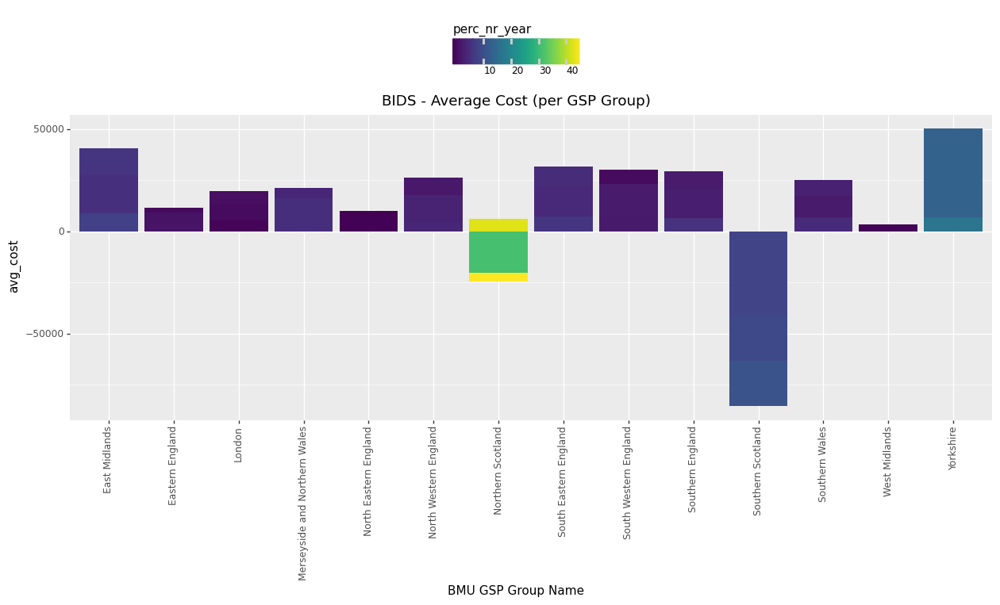

<ggplot: (8787135509288)>

In [41]:
(ggplot(summary_year) 
 + aes(x="BMU GSP Group Name", y="avg_cost", fill='perc_nr_year')
 + geom_bar(stat='identity', size=3)
 + theme(axis_text_x=element_text(rotation=90))
 + ggtitle('BIDS - Average Cost (per GSP Group)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 5), legend_position='top', legend_box_spacing=.3)
)

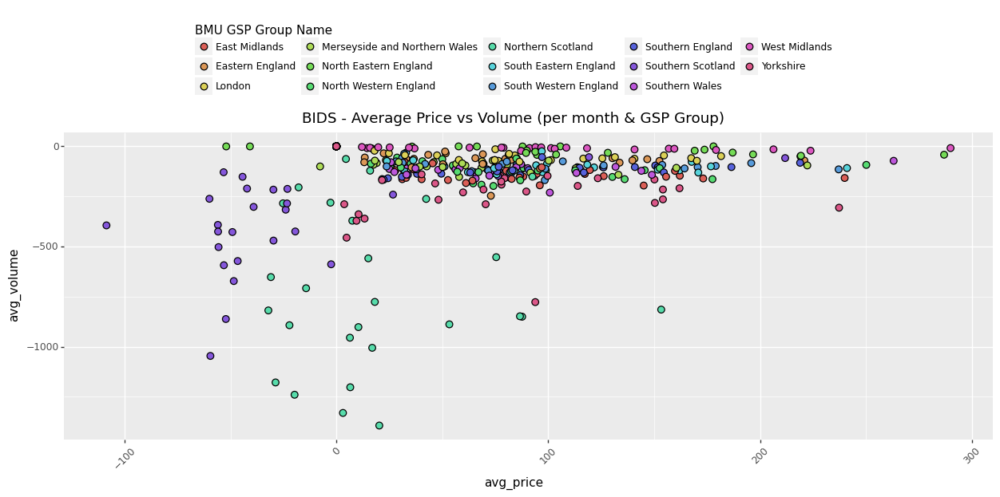

<ggplot: (8787160292467)>

In [42]:
(ggplot(summary_month) 
 + aes(x="avg_price", y="avg_volume", fill='BMU GSP Group Name')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('BIDS - Average Price vs Volume (per month & GSP Group)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 5), legend_position='top', legend_box_spacing=.3)
)

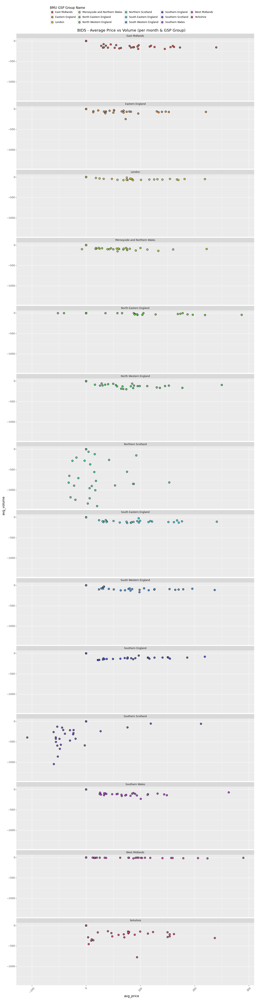

<ggplot: (8787134940371)>

In [43]:
(ggplot(summary_month) 
 + aes(x="avg_price", y="avg_volume", fill='BMU GSP Group Name')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('BIDS - Average Price vs Volume (per month & GSP Group)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

/usr/local/lib/python3.10/dist-packages/plotnine/facets/facet.py:446: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


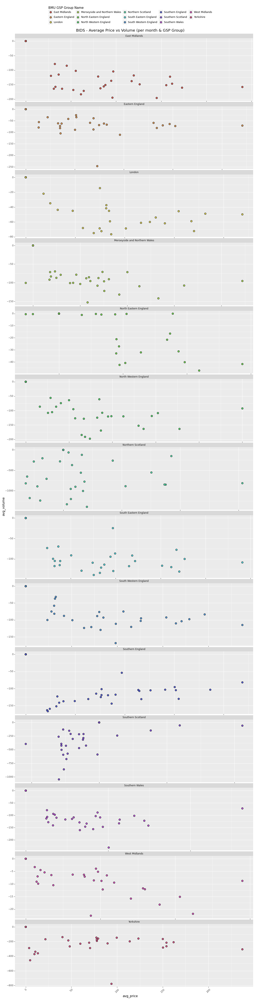

<ggplot: (8787125978791)>

In [44]:
(ggplot(summary_month) 
 + aes(x="avg_price", y="avg_volume", fill='BMU GSP Group Name')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('BIDS - Average Price vs Volume (per month & GSP Group)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=1, scales='free')
)

##### - SP range per month

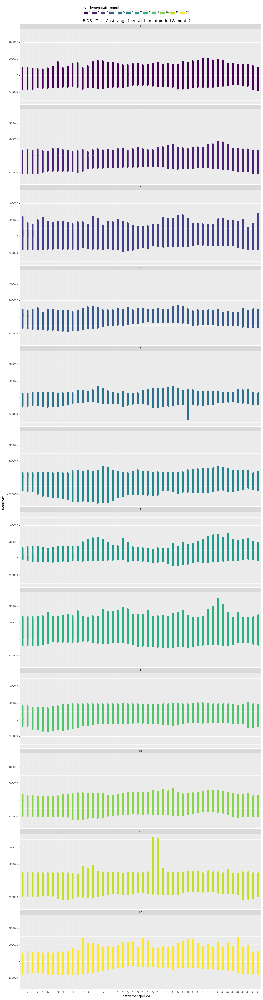

<ggplot: (8787134785491)>

In [45]:
(ggplot(data_df) 
 + aes(x="settlementperiod", y="totalcost", color='settlementdate_month')
 + geom_line(size=3)
 + ggtitle('BIDS - Total Cost range (per settlement period & month)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("settlementdate_month", ncol=1)
)

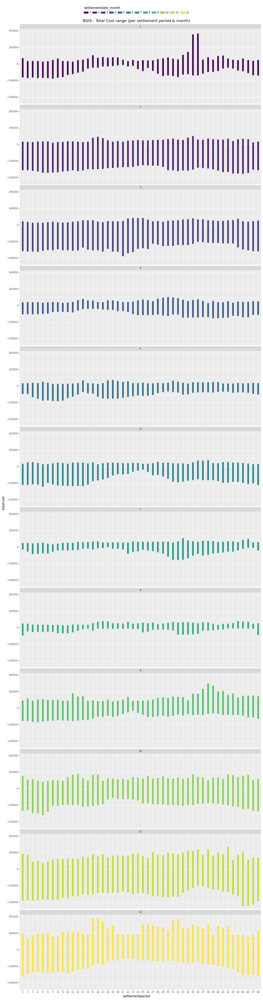

<ggplot: (8787134809464)>

In [46]:
(ggplot(data_df[data_df['settlementdate_year']==2021]) 
 + aes(x="settlementperiod", y="totalcost", color='settlementdate_month')
 + geom_line(size=3)
 + ggtitle('BIDS - Total Cost range (per settlement period & month)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("settlementdate_month", ncol=1)
)

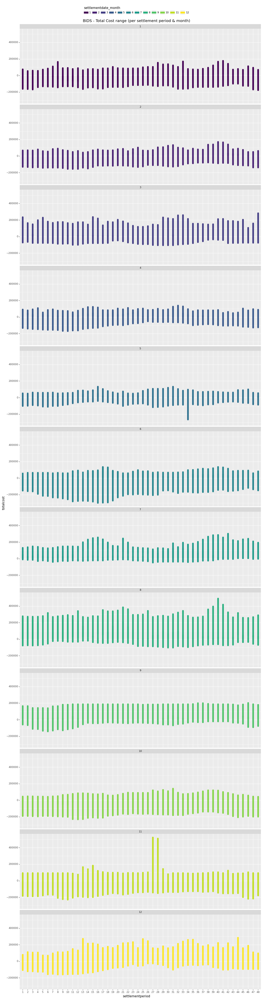

<ggplot: (8787134064004)>

In [47]:
(ggplot(data_df[data_df['settlementdate_year']==2022]) 
 + aes(x="settlementperiod", y="totalcost", color='settlementdate_month')
 + geom_line(size=3)
 + ggtitle('BIDS - Total Cost range (per settlement period & month)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("settlementdate_month", ncol=1)
)

##### - Day range per month

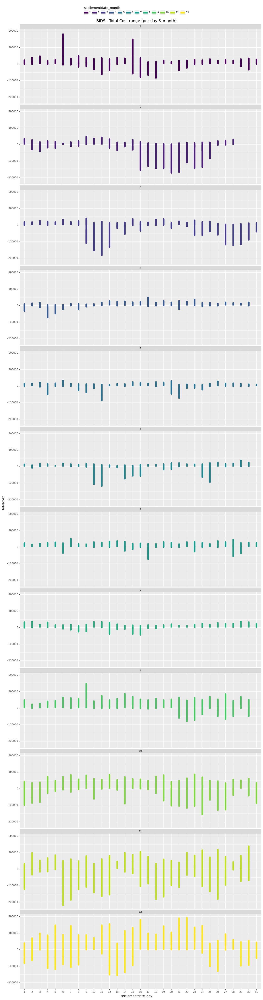

<ggplot: (8787134064493)>

In [48]:
(ggplot(data_df[data_df['settlementdate_year']==2021]) 
 + aes(x="settlementdate_day",y="totalcost", color='settlementdate_month')
 + geom_line(size=3)
 + ggtitle('BIDS - Total Cost range (per day & month)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("settlementdate_month", ncol=1)
)

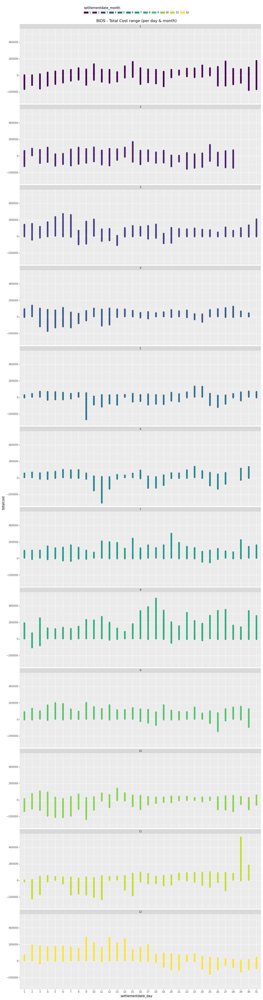

<ggplot: (8787134064592)>

In [49]:
(ggplot(data_df[data_df['settlementdate_year']==2022]) 
 + aes(x="settlementdate_day",y="totalcost", color='settlementdate_month')
 + geom_line(size=3)
 + ggtitle('BIDS - Total Cost range (per day & month)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("settlementdate_month", ncol=1)
)

##### - Month range per year

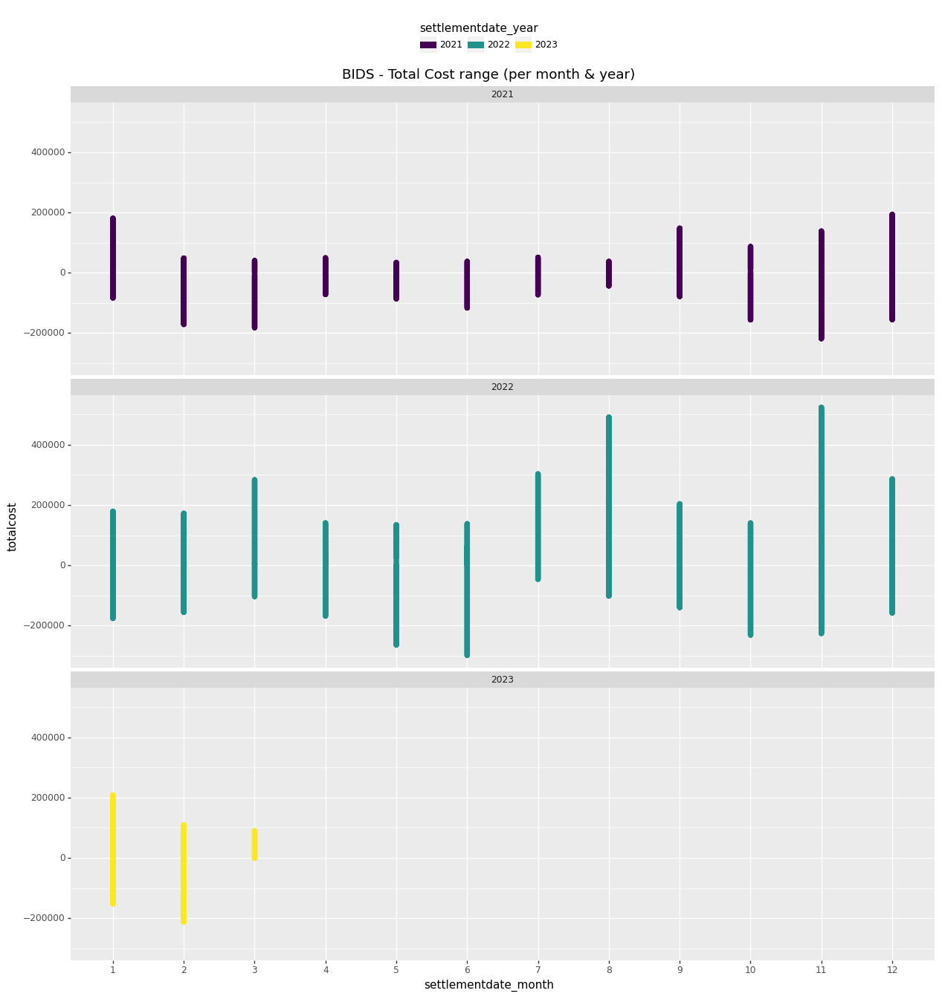

<ggplot: (8787118026515)>

In [50]:
(ggplot(data_df) 
 + aes(x="settlementdate_month",y="totalcost", color='settlementdate_year')
 + geom_line(size=3)
 + ggtitle('BIDS - Total Cost range (per month & year)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 15), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("settlementdate_year", ncol=1)
)

#### 1.2. OFFERS: VALORES MEDIOS, MÍNIMOS Y MÁXIMOS DE PRECIO&VOLUMEN + Nº OFERTAS (POR ZONA)

Uno de los mayores drivers es la localización (volumen medio, precio medio, precio por volumen, precio máximo, número de ofertas aprobadas)

Estacionalidad, Tendencia

##### - Dataset

In [51]:
data_final_OFFER = data_final[data_final['recordtype']=='OFFER']
data_final_OFFER.insert(loc=7, column='nr', value=1)
data_final_OFFER.head()

,recordtype,settlementdate,settlementdate_year,settlementdate_month,settlementdate_day,settlementperiod,BMU ID,nr,acceptedprice,acceptedvolume,...,BMU Party ID,BMU Party Name,Trading Unit,PC Flag,PC Status,Transmission Loss Factor,Generation Capacity,Demand Capacity,Base TU Flag,FPN Flag
654268,OFFER,2021-01-01,2021,1,1,1,T_CARR-2,1,74.9,248.334,...,Carrington Power Ltd,CARRINGT,NaN,NaN,Production (P),-0.002334,470.0,-10.0,False (F),True (T)
654269,OFFER,2021-01-01,2021,1,1,1,T_CDCL-1,1,71.9,322.584,...,Uniper UK Limited,EECL,NaN,NaN,Production (P),0.005473,445.0,-12.0,False (F),True (T)
654270,OFFER,2021-01-01,2021,1,1,1,T_DAMC-1,1,72.0,270.000,...,VPI Power Limited,SPGEN01,NaN,NaN,Production (P),0.012051,820.0,-12.0,False (F),True (T)
654271,OFFER,2021-01-01,2021,1,1,1,T_GRAI-6,1,71.9,230.188,...,Uniper UK Limited,EECL,GRAIN PS TRADING UNIT,NaN,Production (P),0.012051,468.0,-14.0,False (F),True (T)
654272,OFFER,2021-01-01,2021,1,1,1,T_GRAI-7,1,70.0,230.000,...,Uniper UK Limited,EECL,GRAIN PS TRADING UNIT,NaN,Production (P),0.012051,468.0,-14.0,False (F),True (T)


In [52]:
selected_cols = ['recordtype', 'settlementdate','settlementperiod', 'nr',
                 'acceptedvolume', 'totalcost', 'BMU GSP Group Name']

In [53]:
aggregate_cols = ['recordtype', 'settlementdate', 'settlementperiod', 'BMU GSP Group Name']

In [54]:
data_df = pd.pivot_table(data_final_OFFER[selected_cols],
                         index=aggregate_cols, 
                         aggfunc={'nr':'sum', 'acceptedvolume':'sum', 'totalcost':'sum'})

data_df = data_df.rename(columns={'acceptedvolume':'totalvolume'})
data_df = data_df.reset_index()
data_df.insert(loc=4, column='averageprice', value=( data_df['totalcost'] / abs(data_df['totalvolume']) ))
data_df = data_df[['recordtype', 'settlementdate',	'settlementperiod', 'BMU GSP Group Name', 'nr', 'totalvolume',	'averageprice',	'totalcost']]
data_df = data_df.fillna(0)
data_df

,recordtype,settlementdate,settlementperiod,BMU GSP Group Name,nr,totalvolume,averageprice,totalcost
0,OFFER,2021-01-01,1,East Midlands,1,322.584,71.9,23193.7896
1,OFFER,2021-01-01,1,Eastern England,0,0.000,0.0,0.0000
2,OFFER,2021-01-01,1,London,0,0.000,0.0,0.0000
3,OFFER,2021-01-01,1,Merseyside and Northern Wales,0,0.000,0.0,0.0000
4,OFFER,2021-01-01,1,North Eastern England,0,0.000,0.0,0.0000
...,...,...,...,...,...,...,...,...
530203,OFFER,2023-03-01,48,Southern England,0,0.000,0.0,0.0000
530204,OFFER,2023-03-01,48,Southern Scotland,0,0.000,0.0,0.0000
530205,OFFER,2023-03-01,48,Southern Wales,0,0.000,0.0,0.0000
530206,OFFER,2023-03-01,48,West Midlands,0,0.000,0.0,0.0000


In [55]:
data_df.insert(loc=1, column='settlementdate_year', value=data_df['settlementdate'].dt.year)

order = list(data_df['settlementdate_year'].unique())
order.sort()
data = data_df['settlementdate_year']
data_df['settlementdate_year'] = pd.Categorical(data, order, ordered=True)

In [56]:
data_df.insert(loc=2, column='settlementdate_month', value=data_df['settlementdate'].dt.month)

order = list(data_df['settlementdate_month'].unique())
order.sort()
data = data_df['settlementdate_month']
data_df['settlementdate_month'] = pd.Categorical(data, order, ordered=True)

In [57]:
data_df.insert(loc=3, column='settlementdate_day', value=data_df['settlementdate'].dt.day)

order = list(data_df['settlementdate_day'].unique())
order.sort()
data = data_df['settlementdate_day']
data_df['settlementdate_day'] = pd.Categorical(data, order, ordered=True)


In [58]:
data_df

,recordtype,settlementdate_year,settlementdate_month,settlementdate_day,settlementdate,settlementperiod,BMU GSP Group Name,nr,totalvolume,averageprice,totalcost
0,OFFER,2021,1,1,2021-01-01,1,East Midlands,1,322.584,71.9,23193.7896
1,OFFER,2021,1,1,2021-01-01,1,Eastern England,0,0.000,0.0,0.0000
2,OFFER,2021,1,1,2021-01-01,1,London,0,0.000,0.0,0.0000
3,OFFER,2021,1,1,2021-01-01,1,Merseyside and Northern Wales,0,0.000,0.0,0.0000
4,OFFER,2021,1,1,2021-01-01,1,North Eastern England,0,0.000,0.0,0.0000
...,...,...,...,...,...,...,...,...,...,...,...
530203,OFFER,2023,3,1,2023-03-01,48,Southern England,0,0.000,0.0,0.0000
530204,OFFER,2023,3,1,2023-03-01,48,Southern Scotland,0,0.000,0.0,0.0000
530205,OFFER,2023,3,1,2023-03-01,48,Southern Wales,0,0.000,0.0,0.0000
530206,OFFER,2023,3,1,2023-03-01,48,West Midlands,0,0.000,0.0,0.0000


##### - Summary table

In [59]:
data_df.head()

,recordtype,settlementdate_year,settlementdate_month,settlementdate_day,settlementdate,settlementperiod,BMU GSP Group Name,nr,totalvolume,averageprice,totalcost
0,OFFER,2021,1,1,2021-01-01,1,East Midlands,1,322.584,71.9,23193.7896
1,OFFER,2021,1,1,2021-01-01,1,Eastern England,0,0.000,0.0,0.0000
2,OFFER,2021,1,1,2021-01-01,1,London,0,0.000,0.0,0.0000
3,OFFER,2021,1,1,2021-01-01,1,Merseyside and Northern Wales,0,0.000,0.0,0.0000
4,OFFER,2021,1,1,2021-01-01,1,North Eastern England,0,0.000,0.0,0.0000


In [60]:
cols = ['recordtype', 'settlementdate_year', 'settlementdate_month', 'BMU GSP Group Name',
        'perc_nr_month', 'nr', 'avg_price', 'med_price', 'max_price', 'min_price', 
        'avg_volume', 'med_volume', 'max_volume', 'min_volume',
        'perc_totalcost_month', 'totalcost', 'avg_cost', 'med_cost', 'max_cost', 'min_cost']

In [61]:
summary_month = pd.DataFrame(columns=cols)
summary_month

,recordtype,settlementdate_year,settlementdate_month,BMU GSP Group Name,perc_nr_month,nr,avg_price,med_price,max_price,min_price,avg_volume,med_volume,max_volume,min_volume,perc_totalcost_month,totalcost,avg_cost,med_cost,max_cost,min_cost


In [62]:
years = list(data_df['settlementdate_year'].unique())
months = list(data_df['settlementdate_month'].unique())
gsp_groups = list(data_df['BMU GSP Group Name'].unique())

In [63]:
'''
i = 0

for x in years:
  for y in months:

    df_month = data_df[(data_df['settlementdate_year']==x)&(data_df['settlementdate_month']==y)&(data_df['totalvolume']!=0)]
    nr_month = round(df_month['nr'].sum(), 0)
    cost_month = df_month[df_month['totalcost']>0]['totalcost'].sum() - df_month[df_month['totalcost']<0]['totalcost'].sum()

    for z in gsp_groups:

      df = data_df[(data_df['settlementdate_year']==x)&(data_df['settlementdate_month']==y)&(data_df['BMU GSP Group Name']==z)&(data_df['totalvolume']!=0)]

      summary_month.loc[i,'recordtype'] = data_df.loc[0,'recordtype']
      summary_month.loc[i,'settlementdate_year'] = x
      summary_month.loc[i,'settlementdate_month'] = y
      summary_month.loc[i,'BMU GSP Group Name'] = z

      if nr_month != 0:
        summary_month.loc[i,'perc_nr_month'] = round(df['nr'].sum() / nr_month * 100, 2)
      summary_month.loc[i,'nr'] = round(df['nr'].sum(), 0)

      summary_month.loc[i,'avg_price'] = round(df['averageprice'].mean(), 2)
      summary_month.loc[i,'med_price'] = round(df['averageprice'].median(), 2)
      summary_month.loc[i,'max_price'] = round(df['averageprice'].max(), 2)
      summary_month.loc[i,'min_price'] = round(df['averageprice'].min(), 2)

      summary_month.loc[i,'avg_volume'] = round(df['totalvolume'].mean(), 3)
      summary_month.loc[i,'med_volume'] = round(df['totalvolume'].median(), 3)
      summary_month.loc[i,'max_volume'] = round(df['totalvolume'].max(), 3)
      summary_month.loc[i,'min_volume'] = round(df['totalvolume'].min(), 3)

      if cost_month != 0:
        summary_month.loc[i,'perc_totalcost_month'] = round( (df[df['totalcost']>0]['totalcost'].sum() - df[df['totalcost']<0]['totalcost'].sum()) / cost_month * 100, 2)      
      summary_month.loc[i,'totalcost'] = round(df['totalcost'].sum(), 2)
      summary_month.loc[i,'avg_cost'] = round(df['totalcost'].mean(), 2)
      summary_month.loc[i,'med_cost'] = round(df['totalcost'].median(), 2)
      summary_month.loc[i,'max_cost'] = round(df['totalcost'].max(), 2)
      summary_month.loc[i,'min_cost'] = round(df['totalcost'].min(), 2)

      i += 1

summary_month = summary_month.fillna(0)
'''

In [64]:
file_path = '/content/drive/MyDrive/QEnergy/Results/Summary tables/OFFERS 2021-23_Data Summary (per month).xlsx'

In [65]:
#summary_month.to_excel(file_path, index=False)

In [66]:
summary_month = pd.read_excel(file_path)
summary_month

,recordtype,settlementdate_year,settlementdate_month,BMU GSP Group Name,perc_nr_month,nr,avg_price,med_price,max_price,min_price,avg_volume,med_volume,max_volume,min_volume,perc_totalcost_month,totalcost,avg_cost,med_cost,max_cost,min_cost
0,OFFER,2021,1,East Midlands,11.36,1735,80.32,74.54,399.0,35.00,250.628,195.000,1813.114,0.001,7.59,17431582.80,19092.64,14350.00,144490.08,0.04
1,OFFER,2021,1,Eastern England,6.39,976,133.51,84.00,2750.0,37.00,212.951,123.000,971.780,0.001,10.91,25050217.93,36569.66,9582.76,1127505.50,0.04
2,OFFER,2021,1,London,0.04,6,399.00,399.00,399.0,399.00,111.511,114.466,132.000,88.066,0.06,133478.27,44492.76,45671.93,52668.00,35138.33
3,OFFER,2021,1,Merseyside and Northern Wales,14.74,2251,180.13,94.03,2750.0,31.00,194.156,134.775,1539.058,0.001,15.35,35226539.00,36770.92,13232.46,670818.50,0.19
4,OFFER,2021,1,North Eastern England,0.69,105,90.07,89.68,120.0,78.66,2.097,1.866,6.000,0.003,0.01,19823.75,188.80,169.17,535.75,0.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499,OFFER,2023,12,Southern England,0.00,0,0.00,0.00,0.0,0.00,0.000,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00
500,OFFER,2023,12,Southern Scotland,0.00,0,0.00,0.00,0.0,0.00,0.000,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00
501,OFFER,2023,12,Southern Wales,0.00,0,0.00,0.00,0.0,0.00,0.000,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00
502,OFFER,2023,12,West Midlands,0.00,0,0.00,0.00,0.0,0.00,0.000,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00


In [67]:
cols = ['recordtype', 'settlementdate_year', 'BMU GSP Group Name',
        'perc_nr_year', 'nr', 'avg_price', 'med_price', 'max_price', 'min_price', 
        'avg_volume', 'med_volume', 'max_volume', 'min_volume',
        'perc_totalcost_year', 'totalcost', 'avg_cost', 'med_cost', 'max_cost', 'min_cost']

In [68]:
summary_year = pd.DataFrame(columns=cols)
summary_year

,recordtype,settlementdate_year,BMU GSP Group Name,perc_nr_year,nr,avg_price,med_price,max_price,min_price,avg_volume,med_volume,max_volume,min_volume,perc_totalcost_year,totalcost,avg_cost,med_cost,max_cost,min_cost


In [69]:
years = list(data_df['settlementdate_year'].unique())
gsp_groups = list(data_df['BMU GSP Group Name'].unique())

In [70]:
'''
i = 0

for x in years:

  df_year = data_df[(data_df['settlementdate_year']==x)&(data_df['totalvolume']!=0)]
  nr_year = round(df_year['nr'].sum(), 0)
  cost_year = df_year[df_year['totalcost']>0]['totalcost'].sum() - df_year[df_year['totalcost']<0]['totalcost'].sum()

  for z in gsp_groups:

    df = data_df[(data_df['settlementdate_year']==x)&(data_df['BMU GSP Group Name']==z)&(data_df['totalvolume']!=0)]

    summary_year.loc[i,'recordtype'] = data_df.loc[0,'recordtype']
    summary_year.loc[i,'settlementdate_year'] = x
    summary_year.loc[i,'BMU GSP Group Name'] = z

    if nr_year != 0:
      summary_year.loc[i,'perc_nr_year'] = round(df['nr'].sum() / nr_year * 100, 2)
    summary_year.loc[i,'nr'] = round(df['nr'].sum(), 0)

    summary_year.loc[i,'avg_price'] = round(df['averageprice'].mean(), 2)
    summary_year.loc[i,'med_price'] = round(df['averageprice'].median(), 2)
    summary_year.loc[i,'max_price'] = round(df['averageprice'].max(), 2)
    summary_year.loc[i,'min_price'] = round(df['averageprice'].min(), 2)

    summary_year.loc[i,'avg_volume'] = round(df['totalvolume'].mean(), 3)
    summary_year.loc[i,'med_volume'] = round(df['totalvolume'].median(), 3)
    summary_year.loc[i,'max_volume'] = round(df['totalvolume'].max(), 3)
    summary_year.loc[i,'min_volume'] = round(df['totalvolume'].min(), 3)

    if cost_year != 0:
      summary_year.loc[i,'perc_totalcost_year'] = round( (df[df['totalcost']>0]['totalcost'].sum() - df[df['totalcost']<0]['totalcost'].sum()) / cost_year * 100, 2)
    summary_year.loc[i,'totalcost'] = round(df['totalcost'].sum(), 2)
    summary_year.loc[i,'avg_cost'] = round(df['totalcost'].mean(), 2)
    summary_year.loc[i,'med_cost'] = round(df['totalcost'].median(), 2)
    summary_year.loc[i,'max_cost'] = round(df['totalcost'].max(), 2)
    summary_year.loc[i,'min_cost'] = round(df['totalcost'].min(), 2)

    i += 1

summary_year = summary_year.fillna(0)
'''

In [71]:
file_path = '/content/drive/MyDrive/QEnergy/Results/Summary tables/OFFERS 2021-23_Data Summary (per year).xlsx'

In [72]:
#summary_year.to_excel(file_path, index=False)

In [73]:
summary_year = pd.read_excel(file_path)
summary_year

,recordtype,settlementdate_year,BMU GSP Group Name,perc_nr_year,nr,avg_price,med_price,max_price,min_price,avg_volume,med_volume,max_volume,min_volume,perc_totalcost_year,totalcost,avg_cost,med_cost,max_cost,min_cost
0,OFFER,2021,East Midlands,11.54,23979,160.73,115.00,3800.00,-50.00,263.390,200.000,2327.436,0.001,12.30,5.065989e+08,41933.53,24308.81,2105400.00,-24.20
1,OFFER,2021,Eastern England,7.28,15125,226.76,129.99,4000.00,17.10,212.866,120.558,1355.466,0.001,12.35,5.084910e+08,61043.34,16128.77,1730753.75,0.02
2,OFFER,2021,London,0.58,1211,164.81,130.00,999.00,69.90,143.807,124.710,440.000,0.001,0.69,2.827500e+07,24002.55,16439.65,119880.00,0.13
3,OFFER,2021,Merseyside and Northern Wales,13.14,27294,187.50,127.94,4000.00,31.00,218.660,191.666,1571.962,0.001,13.27,5.465139e+08,41894.51,22856.72,2088506.25,0.05
4,OFFER,2021,North Eastern England,0.95,1975,133.94,125.00,447.00,0.00,2.052,1.894,6.000,0.003,0.01,5.316999e+05,269.22,219.69,999.00,0.00
5,OFFER,2021,North Western England,12.15,25253,147.42,123.95,825.00,-85.02,146.055,103.200,1006.450,0.001,4.26,1.755560e+08,20578.59,13571.85,182953.13,-3758.98
6,OFFER,2021,Northern Scotland,7.42,15428,156.06,120.00,9999.00,-53.64,113.535,65.991,1100.000,0.001,2.81,1.158744e+08,16459.43,9163.05,383417.50,-2308.42
7,OFFER,2021,South Eastern England,9.28,19283,171.40,116.00,3875.00,3.89,304.339,230.000,1947.256,0.001,13.02,5.363366e+08,48197.03,25758.69,1820993.70,0.05
8,OFFER,2021,South Western England,8.06,16755,187.48,124.83,3950.00,-50.00,269.497,250.000,1458.666,0.001,12.66,5.214361e+08,56268.06,26563.80,2662880.00,-175.00
9,OFFER,2021,Southern England,6.73,13978,137.77,109.79,1724.00,20.00,254.370,60.137,1832.814,0.001,6.79,2.795505e+08,32803.39,7558.13,405633.79,0.04


##### - General visualizations

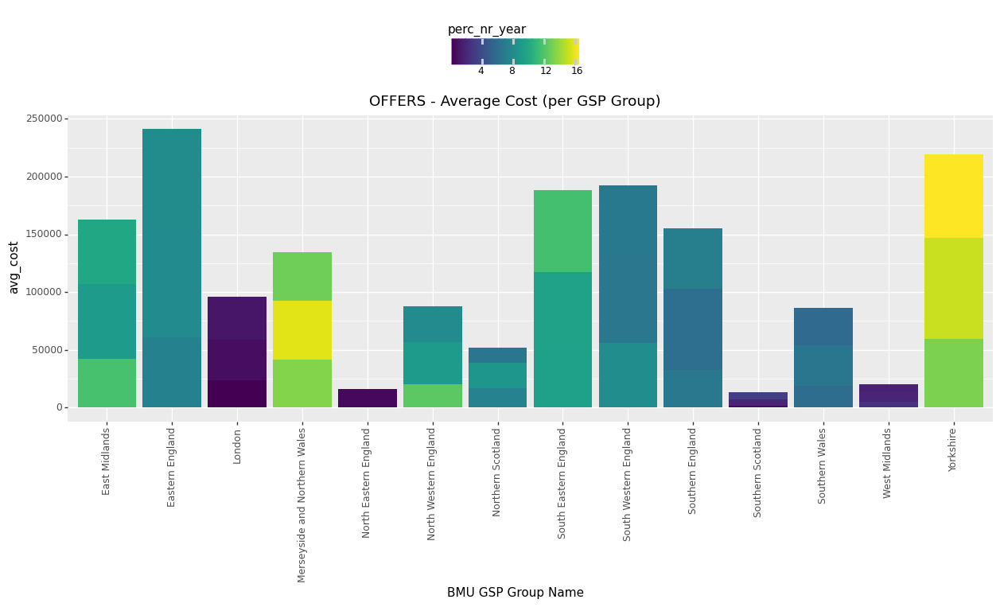

<ggplot: (8787125624950)>

In [74]:
(ggplot(summary_year) 
 + aes(x="BMU GSP Group Name", y="avg_cost", fill='perc_nr_year')
 + geom_bar(stat='identity', size=3)
 + theme(axis_text_x=element_text(rotation=90))
 + ggtitle('OFFERS - Average Cost (per GSP Group)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 5), legend_position='top', legend_box_spacing=.3)
)

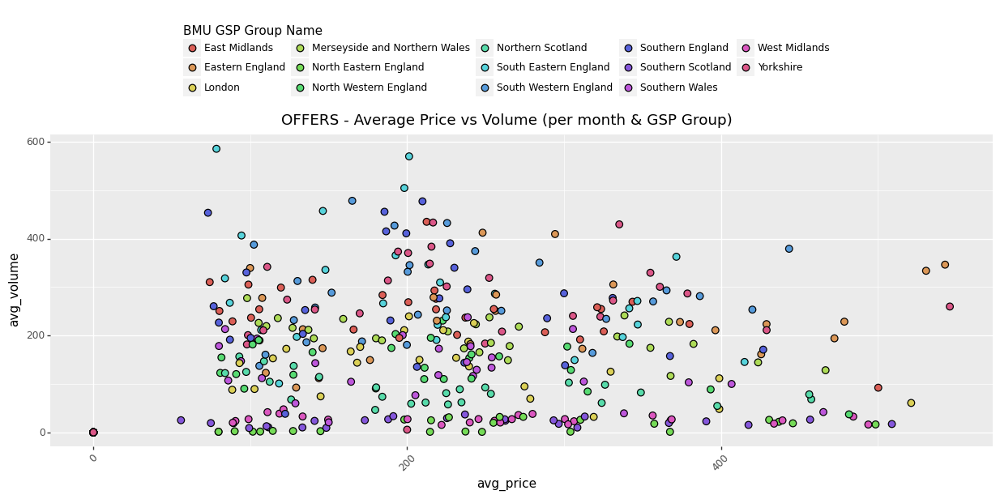

<ggplot: (8787117855609)>

In [75]:
(ggplot(summary_month) 
 + aes(x="avg_price", y="avg_volume", fill='BMU GSP Group Name')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('OFFERS - Average Price vs Volume (per month & GSP Group)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 5), legend_position='top', legend_box_spacing=.3)
)

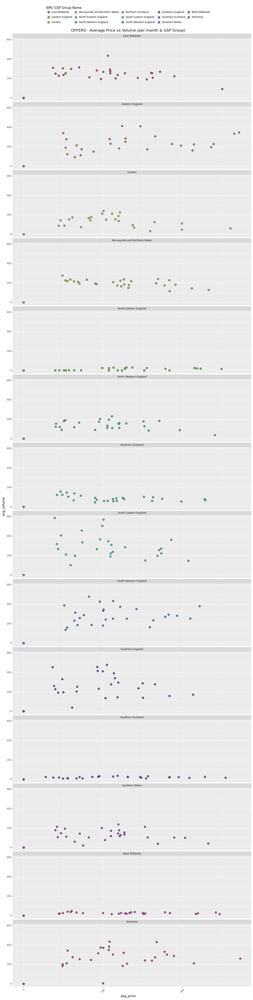

<ggplot: (8787108169861)>

In [76]:
(ggplot(summary_month) 
 + aes(x="avg_price", y="avg_volume", fill='BMU GSP Group Name')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('OFFERS - Average Price vs Volume (per month & GSP Group)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

##### - SP range per month

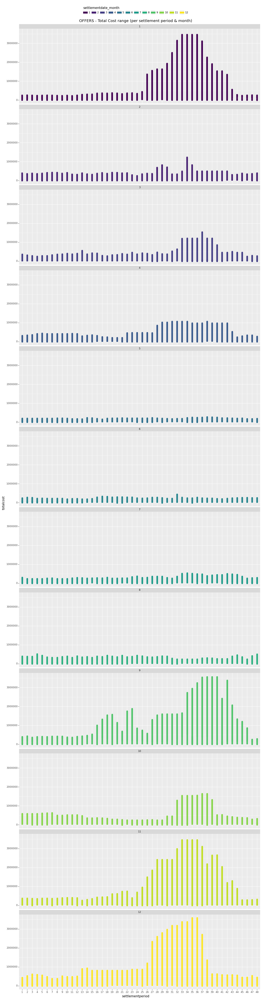

<ggplot: (8787108195713)>

In [77]:
(ggplot(data_df) 
 + aes(x="settlementperiod", y="totalcost", color='settlementdate_month')
 + geom_line(size=3)
 + ggtitle('OFFERS - Total Cost range (per settlement period & month)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("settlementdate_month", ncol=1)
)

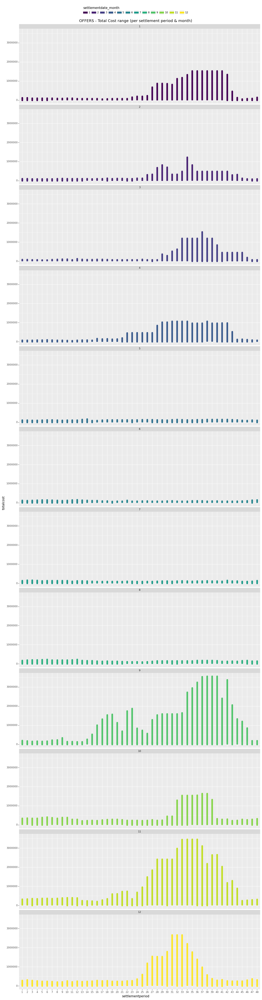

<ggplot: (8787108577938)>

In [78]:
(ggplot(data_df[data_df['settlementdate_year']==2021]) 
 + aes(x="settlementperiod", y="totalcost", color='settlementdate_month')
 + geom_line(size=3)
 + ggtitle('OFFERS - Total Cost range (per settlement period & month)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("settlementdate_month", ncol=1)
)

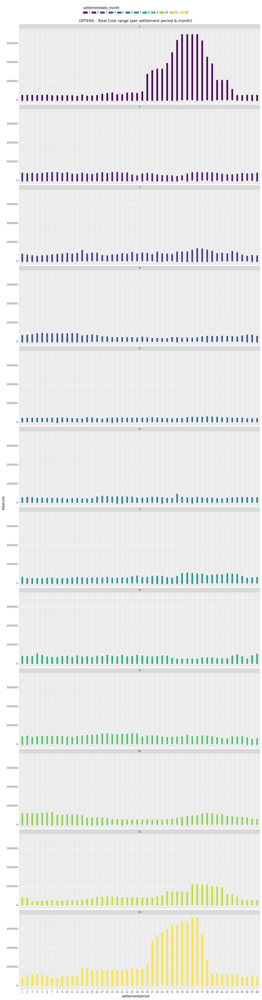

<ggplot: (8787118665347)>

In [79]:
(ggplot(data_df[data_df['settlementdate_year']==2022]) 
 + aes(x="settlementperiod", y="totalcost", color='settlementdate_month')
 + geom_line(size=3)
 + ggtitle('OFFERS - Total Cost range (per settlement period & month)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("settlementdate_month", ncol=1)
)

##### - Day range per month

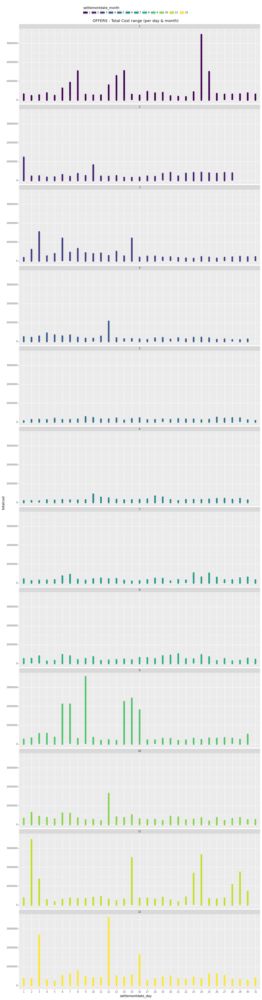

<ggplot: (8787108638591)>

In [80]:
(ggplot(data_df) 
 + aes(x="settlementdate_day",y="totalcost", color='settlementdate_month')
 + geom_line(size=3)
 + ggtitle('OFFERS - Total Cost range (per day & month)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("settlementdate_month", ncol=1)
)

##### - Month range per year

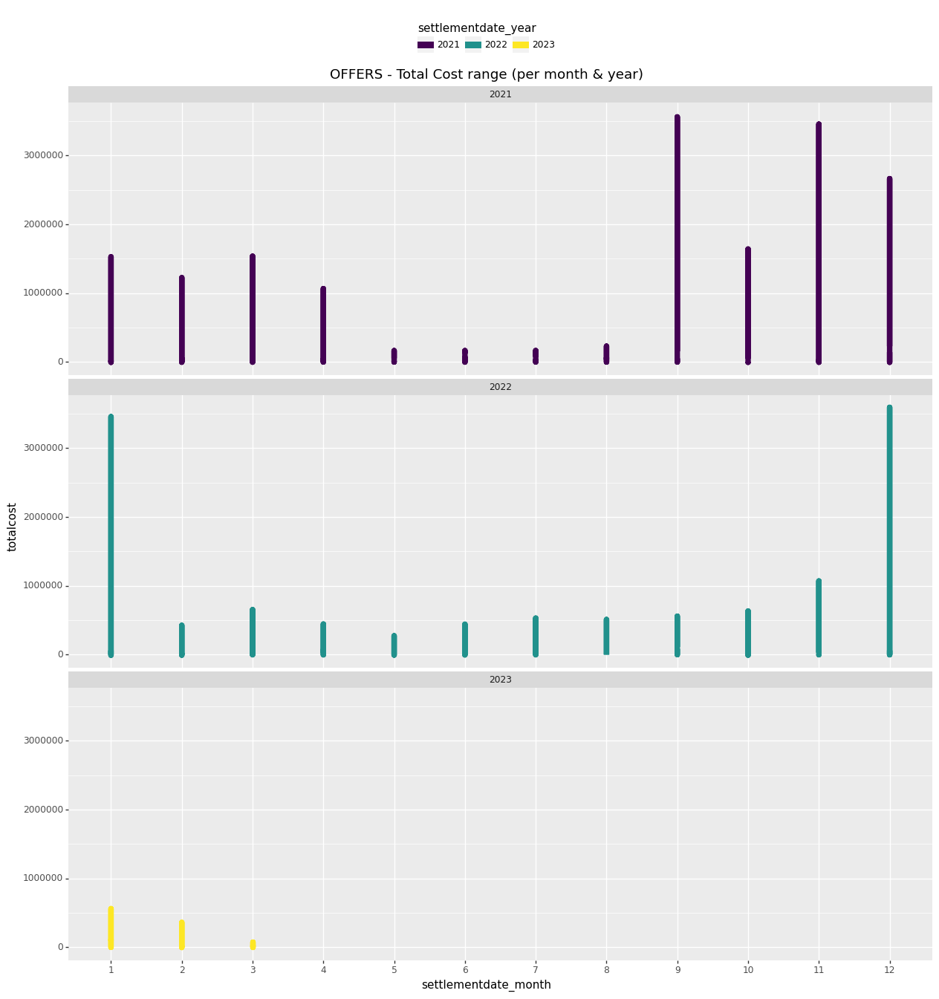

<ggplot: (8787134788260)>

In [81]:
(ggplot(data_df) 
 + aes(x="settlementdate_month",y="totalcost", color='settlementdate_year')
 + geom_line(size=3)
 + ggtitle('OFFERS - Total Cost range (per month & year)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 15), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("settlementdate_year", ncol=1)
)

#### 2. OFERTAN QUE SE ACEPTAN MÁS O MENOS -> Cuartiles de precio y volumen (POR ZONA)

Percentiles de aceptación

- Por settlement period
- Por día
- Por semana
- Por mes

#### 3.1. BIDS: DISTRIBUCIÓN DE FUEL TYPE (POR ZONA)

Estacionalidad, Tendencia

##### - Dataset

In [82]:
data_final_BID = data_final[data_final['recordtype']=='BID']
data_final_BID.insert(loc=7, column='nr', value=1)
data_final_BID.head()

,recordtype,settlementdate,settlementdate_year,settlementdate_month,settlementdate_day,settlementperiod,BMU ID,nr,acceptedprice,acceptedvolume,...,BMU Party ID,BMU Party Name,Trading Unit,PC Flag,PC Status,Transmission Loss Factor,Generation Capacity,Demand Capacity,Base TU Flag,FPN Flag
0,BID,2021-01-01,2021,1,1,1,E_GYAR-1,1,37.0,-18.366,...,RWE Generation UK plc,INNOGY01,NaN,NaN,Production (P),0.004895,420.0,-18.0,False (F),True (T)
1,BID,2021-01-01,2021,1,1,1,E_SHOS-1,1,35.0,-0.666,...,VPI Power Limited,SPGEN01,NaN,NaN,Production (P),0.012051,436.0,-16.0,False (F),True (T)
2,BID,2021-01-01,2021,1,1,1,T_CDCL-1,1,40.0,-11.084,...,Uniper UK Limited,EECL,NaN,NaN,Production (P),0.005473,445.0,-12.0,False (F),True (T)
3,BID,2021-01-01,2021,1,1,1,T_MRWD-1,1,37.1,-174.768,...,Marchwood Power Limited,MPL,NaN,NaN,Production (P),0.017790,920.0,-15.0,False (F),True (T)
4,BID,2021-01-01,2021,1,1,1,T_PEMB-11,1,37.0,-33.634,...,RWE Generation UK plc,INNOGY01,Pembroke Power Station,NaN,Production (P),0.009636,475.0,-11.0,False (F),True (T)


In [83]:
data_final_BID.columns

Index(['recordtype', 'settlementdate', 'settlementdate_year',
       'settlementdate_month', 'settlementdate_day', 'settlementperiod',
       'BMU ID', 'nr', 'acceptedprice', 'acceptedvolume', 'totalcost',
       'BMU Type', 'BMU Fuel Type', 'BMU GSP Group Id', 'BMU GSP Group Name',
       'LOC LAT', 'LOC LONG', 'GSP LOC Center', 'LOC Center LAT',
       'LOC Center LONG', 'BMU Party ID', 'BMU Party Name', 'Trading Unit',
       'PC Flag', 'PC Status', 'Transmission Loss Factor',
       'Generation Capacity', 'Demand Capacity', 'Base TU Flag', 'FPN Flag'],
      dtype='object')

In [84]:
'''
['recordtype', 'settlementdate', 'settlementperiod',
'BMU Type', 'BMU Fuel Type', 'BMU GSP Group Name',
'Trading Unit', 'PC Flag', 'PC Status',
'Transmission Loss Factor', 'Generation Capacity', 'Demand Capacity',
'Credit Assessment Load Factor','BMU Credit Assessment Export Capability',
'BMU Credit Assessment Import Capability', 'Exempt Export Flag',
'Base TU Flag', 'FPN Flag', 'Interconnector']
'''

"\n['recordtype', 'settlementdate', 'settlementperiod',\n'BMU Type', 'BMU Fuel Type', 'BMU GSP Group Name',\n'Trading Unit', 'PC Flag', 'PC Status',\n'Transmission Loss Factor', 'Generation Capacity', 'Demand Capacity',\n'Credit Assessment Load Factor','BMU Credit Assessment Export Capability',\n'BMU Credit Assessment Import Capability', 'Exempt Export Flag',\n'Base TU Flag', 'FPN Flag', 'Interconnector']\n"

In [85]:
selected_cols = ['recordtype', 'settlementdate', 'settlementperiod', 'nr',
                 'acceptedprice', 'acceptedvolume', 'totalcost',
                 'BMU Fuel Type', 'BMU GSP Group Name']

In [86]:
aggregate_cols = ['recordtype', 'settlementdate', 'settlementperiod', 'BMU GSP Group Name', 'BMU Fuel Type']

In [87]:
data_df = pd.pivot_table(data_final_BID[selected_cols],
                         index=aggregate_cols, 
                         aggfunc={'nr':'sum', 'acceptedvolume':'sum', 'totalcost':'sum'})

data_df = data_df.rename(columns={'acceptedvolume':'totalvolume'})
data_df = data_df.reset_index()
data_df.insert(loc=4, column='averageprice', value=( data_df['totalcost'] / abs(data_df['totalvolume']) ))
data_df = data_df[['recordtype', 'settlementdate',	'settlementperiod', 'BMU GSP Group Name', 'BMU Fuel Type', 'nr', 'totalvolume',	'averageprice',	'totalcost']]
data_df = data_df.fillna(0)
data_df

,recordtype,settlementdate,settlementperiod,BMU GSP Group Name,BMU Fuel Type,nr,totalvolume,averageprice,totalcost
0,BID,2021-01-01,1,East Midlands,BATTERY,0,0.000,0.0,0.00
1,BID,2021-01-01,1,East Midlands,BIOMASS,0,0.000,0.0,0.00
2,BID,2021-01-01,1,East Midlands,CCGT,1,-11.084,40.0,443.36
3,BID,2021-01-01,1,East Midlands,COAL,0,0.000,0.0,0.00
4,BID,2021-01-01,1,East Midlands,NPSHYD,0,0.000,0.0,0.00
...,...,...,...,...,...,...,...,...,...
4771867,BID,2023-03-01,48,Yorkshire,NPSHYD,0,0.000,0.0,0.00
4771868,BID,2023-03-01,48,Yorkshire,OCGT,0,0.000,0.0,0.00
4771869,BID,2023-03-01,48,Yorkshire,OTHER,0,0.000,0.0,0.00
4771870,BID,2023-03-01,48,Yorkshire,PS,0,0.000,0.0,0.00


In [88]:
data_df.insert(loc=1, column='settlementdate_year', value=data_df['settlementdate'].dt.year)

order = list(data_df['settlementdate_year'].unique())
order.sort()
data = data_df['settlementdate_year']
data_df['settlementdate_year'] = pd.Categorical(data, order, ordered=True)

In [89]:
data_df.insert(loc=2, column='settlementdate_month', value=data_df['settlementdate'].dt.month)

order = list(data_df['settlementdate_month'].unique())
order.sort()
data = data_df['settlementdate_month']
data_df['settlementdate_month'] = pd.Categorical(data, order, ordered=True)

In [90]:
data_df.insert(loc=3, column='settlementdate_day', value=data_df['settlementdate'].dt.day)

order = list(data_df['settlementdate_day'].unique())
order.sort()
data = data_df['settlementdate_day']
data_df['settlementdate_day'] = pd.Categorical(data, order, ordered=True)


In [91]:
data_df

,recordtype,settlementdate_year,settlementdate_month,settlementdate_day,settlementdate,settlementperiod,BMU GSP Group Name,BMU Fuel Type,nr,totalvolume,averageprice,totalcost
0,BID,2021,1,1,2021-01-01,1,East Midlands,BATTERY,0,0.000,0.0,0.00
1,BID,2021,1,1,2021-01-01,1,East Midlands,BIOMASS,0,0.000,0.0,0.00
2,BID,2021,1,1,2021-01-01,1,East Midlands,CCGT,1,-11.084,40.0,443.36
3,BID,2021,1,1,2021-01-01,1,East Midlands,COAL,0,0.000,0.0,0.00
4,BID,2021,1,1,2021-01-01,1,East Midlands,NPSHYD,0,0.000,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...
4771867,BID,2023,3,1,2023-03-01,48,Yorkshire,NPSHYD,0,0.000,0.0,0.00
4771868,BID,2023,3,1,2023-03-01,48,Yorkshire,OCGT,0,0.000,0.0,0.00
4771869,BID,2023,3,1,2023-03-01,48,Yorkshire,OTHER,0,0.000,0.0,0.00
4771870,BID,2023,3,1,2023-03-01,48,Yorkshire,PS,0,0.000,0.0,0.00


##### - Summary table

In [92]:
data_df.head()

,recordtype,settlementdate_year,settlementdate_month,settlementdate_day,settlementdate,settlementperiod,BMU GSP Group Name,BMU Fuel Type,nr,totalvolume,averageprice,totalcost
0,BID,2021,1,1,2021-01-01,1,East Midlands,BATTERY,0,0.000,0.0,0.00
1,BID,2021,1,1,2021-01-01,1,East Midlands,BIOMASS,0,0.000,0.0,0.00
2,BID,2021,1,1,2021-01-01,1,East Midlands,CCGT,1,-11.084,40.0,443.36
3,BID,2021,1,1,2021-01-01,1,East Midlands,COAL,0,0.000,0.0,0.00
4,BID,2021,1,1,2021-01-01,1,East Midlands,NPSHYD,0,0.000,0.0,0.00


In [93]:
cols = ['recordtype', 'settlementdate_year', 'settlementdate_month', 'BMU GSP Group Name', 'BMU Fuel Type',
        'perc_nr_month', 'perc_nr_gsp', 'nr', 'avg_price', 'med_price', 'max_price', 'min_price', 
        'avg_volume', 'med_volume', 'max_volume', 'min_volume',
        'perc_totalcost_month', 'perc_totalcost_gsp', 'totalcost', 'avg_cost', 'med_cost', 'max_cost', 'min_cost']

In [94]:
summary_month = pd.DataFrame(columns=cols)
summary_month

,recordtype,settlementdate_year,settlementdate_month,BMU GSP Group Name,BMU Fuel Type,perc_nr_month,perc_nr_gsp,nr,avg_price,med_price,...,med_volume,max_volume,min_volume,perc_totalcost_month,perc_totalcost_gsp,totalcost,avg_cost,med_cost,max_cost,min_cost


In [95]:
years = list(data_df['settlementdate_year'].unique())
months = list(data_df['settlementdate_month'].unique())
gsp_groups = list(data_df['BMU GSP Group Name'].unique())
fuel_types = list(data_df['BMU Fuel Type'].unique())

In [96]:
'''
i = 0

for x in years:
  for y in months:

    df_month = data_df[(data_df['settlementdate_year']==x)&(data_df['settlementdate_month']==y)&(data_df['totalvolume']!=0)]
    nr_month = round(df_month['nr'].sum(), 0)
    cost_month = df_month[df_month['totalcost']>0]['totalcost'].sum() - df_month[df_month['totalcost']<0]['totalcost'].sum()

    for z in gsp_groups:

      df_gsp = data_df[(data_df['settlementdate_year']==x)&(data_df['settlementdate_month']==y)&(data_df['BMU GSP Group Name']==z)&(data_df['totalvolume']!=0)]
      nr_gsp = round(df_gsp['nr'].sum(), 0)
      cost_gsp = df_gsp[df_gsp['totalcost']>0]['totalcost'].sum() - df_gsp[df_gsp['totalcost']<0]['totalcost'].sum()

      for u in fuel_types:

        df = data_df[(data_df['settlementdate_year']==x)&(data_df['settlementdate_month']==y)&(data_df['BMU GSP Group Name']==z)&(data_df['BMU Fuel Type']==u)&(data_df['totalvolume']!=0)]

        summary_month.loc[i,'recordtype'] = data_df.loc[0,'recordtype']
        summary_month.loc[i,'settlementdate_year'] = x
        summary_month.loc[i,'settlementdate_month'] = y
        summary_month.loc[i,'BMU GSP Group Name'] = z
        summary_month.loc[i,'BMU Fuel Type'] = u

        summary_month.loc[i,'nr'] = round(df['nr'].sum(), 0)
        if nr_month != 0:
          summary_month.loc[i,'perc_nr_month'] = round(df['nr'].sum() / nr_month * 100, 2)
        if nr_gsp != 0:
          summary_month.loc[i,'perc_nr_gsp'] = round(df['nr'].sum() / nr_gsp * 100, 2)

        summary_month.loc[i,'avg_price'] = round(df['averageprice'].mean(), 2)
        summary_month.loc[i,'med_price'] = round(df['averageprice'].median(), 2)
        summary_month.loc[i,'max_price'] = round(df['averageprice'].max(), 2)
        summary_month.loc[i,'min_price'] = round(df['averageprice'].min(), 2)

        summary_month.loc[i,'avg_volume'] = round(df['totalvolume'].mean(), 3)
        summary_month.loc[i,'med_volume'] = round(df['totalvolume'].median(), 3)
        summary_month.loc[i,'max_volume'] = round(df['totalvolume'].max(), 3)
        summary_month.loc[i,'min_volume'] = round(df['totalvolume'].min(), 3)

        if cost_month != 0:
          summary_month.loc[i,'perc_totalcost_month'] = round( (df[df['totalcost']>0]['totalcost'].sum() - df[df['totalcost']<0]['totalcost'].sum()) / cost_month * 100, 2)   
        if cost_gsp != 0:
          summary_month.loc[i,'perc_totalcost_gsp'] = round( (df[df['totalcost']>0]['totalcost'].sum() - df[df['totalcost']<0]['totalcost'].sum()) / cost_gsp * 100, 2)   
        summary_month.loc[i,'totalcost'] = round(df['totalcost'].sum(), 2)
        summary_month.loc[i,'avg_cost'] = round(df['totalcost'].mean(), 2)
        summary_month.loc[i,'med_cost'] = round(df['totalcost'].median(), 2)
        summary_month.loc[i,'max_cost'] = round(df['totalcost'].max(), 2)
        summary_month.loc[i,'min_cost'] = round(df['totalcost'].min(), 2)

        i += 1

summary_month = summary_month.fillna(0)
'''

In [97]:
file_path = '/content/drive/MyDrive/QEnergy/Results/Summary tables/BIDS 2021-23_Data Summary (per month & Fuel).xlsx'

In [98]:
#summary_month.to_excel(file_path, index=False)

In [99]:
summary_month = pd.read_excel(file_path)
summary_month

,recordtype,settlementdate_year,settlementdate_month,BMU GSP Group Name,BMU Fuel Type,perc_nr_month,perc_nr_gsp,nr,avg_price,med_price,...,med_volume,max_volume,min_volume,perc_totalcost_month,perc_totalcost_gsp,totalcost,avg_cost,med_cost,max_cost,min_cost
0,BID,2021,1,East Midlands,BATTERY,0.00,0.00,0,0.00,0.00,...,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.0
1,BID,2021,1,East Midlands,BIOMASS,0.00,0.00,0,0.00,0.00,...,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.0
2,BID,2021,1,East Midlands,CCGT,8.50,63.32,1502,39.69,41.76,...,-76.623,-0.001,-919.250,10.44,67.46,3942082.34,5041.03,2804.44,36148.91,0.0
3,BID,2021,1,East Midlands,COAL,4.17,31.07,737,40.40,43.69,...,-78.096,-0.001,-659.386,4.94,31.94,1866436.97,5003.85,2989.82,31881.31,0.0
4,BID,2021,1,East Midlands,NPSHYD,0.00,0.00,0,0.00,0.00,...,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4531,BID,2023,12,Yorkshire,NPSHYD,0.00,0.00,0,0.00,0.00,...,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.0
4532,BID,2023,12,Yorkshire,OCGT,0.00,0.00,0,0.00,0.00,...,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.0
4533,BID,2023,12,Yorkshire,OTHER,0.00,0.00,0,0.00,0.00,...,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.0
4534,BID,2023,12,Yorkshire,PS,0.00,0.00,0,0.00,0.00,...,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.0


In [100]:
order = list(summary_month['settlementdate_year'].unique())
order.sort()
data = summary_month['settlementdate_year']
summary_month['settlementdate_year'] = pd.Categorical(data, order, ordered=True)

In [101]:
order = list(summary_month['settlementdate_month'].unique())
order.sort()
data = summary_month['settlementdate_month']
summary_month['settlementdate_month'] = pd.Categorical(data, order, ordered=True)

In [102]:
summary_month[(summary_month['settlementdate_month']==1)&(summary_month['BMU GSP Group Name'].isin(['East Midlands', 'Southern England', 'Yorkshire']))]

,recordtype,settlementdate_year,settlementdate_month,BMU GSP Group Name,BMU Fuel Type,perc_nr_month,perc_nr_gsp,nr,avg_price,med_price,...,med_volume,max_volume,min_volume,perc_totalcost_month,perc_totalcost_gsp,totalcost,avg_cost,med_cost,max_cost,min_cost
0,BID,2021,1,East Midlands,BATTERY,0.00,0.00,0,0.00,0.00,...,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1,BID,2021,1,East Midlands,BIOMASS,0.00,0.00,0,0.00,0.00,...,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,BID,2021,1,East Midlands,CCGT,8.50,63.32,1502,39.69,41.76,...,-76.623,-0.001,-919.250,10.44,67.46,3942082.34,5041.03,2804.44,36148.91,0.00
3,BID,2021,1,East Midlands,COAL,4.17,31.07,737,40.40,43.69,...,-78.096,-0.001,-659.386,4.94,31.94,1866436.97,5003.85,2989.82,31881.31,0.00
4,BID,2021,1,East Midlands,NPSHYD,0.00,0.00,0,0.00,0.00,...,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3145,BID,2023,1,Yorkshire,NPSHYD,0.00,0.00,0,0.00,0.00,...,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00
3146,BID,2023,1,Yorkshire,OCGT,0.02,0.13,5,251.80,250.00,...,-26.800,-0.400,-36.800,0.02,0.14,25222.40,5044.48,6364.80,9494.40,100.00
3147,BID,2023,1,Yorkshire,OTHER,0.02,0.13,5,138.28,144.60,...,-0.010,-0.010,-33.486,0.00,0.03,4656.77,931.35,1.81,3348.60,1.45
3148,BID,2023,1,Yorkshire,PS,0.00,0.00,0,0.00,0.00,...,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [103]:
cols = ['recordtype', 'settlementdate_year', 'BMU GSP Group Name', 'BMU Fuel Type',
        'perc_nr_year', 'perc_nr_gsp', 'nr', 'avg_price', 'med_price', 'max_price', 'min_price', 
        'avg_volume', 'med_volume', 'max_volume', 'min_volume',
        'perc_totalcost_year', 'perc_totalcost_gsp', 'totalcost', 'avg_cost', 'med_cost', 'max_cost', 'min_cost', 'totalcost']

In [104]:
summary_year = pd.DataFrame(columns=cols)
summary_year

,recordtype,settlementdate_year,BMU GSP Group Name,BMU Fuel Type,perc_nr_year,perc_nr_gsp,nr,avg_price,med_price,max_price,...,max_volume,min_volume,perc_totalcost_year,perc_totalcost_gsp,totalcost,avg_cost,med_cost,max_cost,min_cost,totalcost


In [105]:
years = list(data_df['settlementdate_year'].unique())
gsp_groups = list(data_df['BMU GSP Group Name'].unique())
fuel_types = list(data_df['BMU Fuel Type'].unique())

In [106]:
'''
i = 0

for x in years:

    df_year = data_df[(data_df['settlementdate_year']==x)&(data_df['totalvolume']!=0)]
    nr_year = round(df_year['nr'].sum(), 0)
    cost_year = df_year[df_year['totalcost']>0]['totalcost'].sum() - df_year[df_year['totalcost']<0]['totalcost'].sum()

    for z in gsp_groups:

      df_gsp = data_df[(data_df['settlementdate_year']==x)&(data_df['BMU GSP Group Name']==z)&(data_df['totalvolume']!=0)]
      nr_gsp = round(df_gsp['nr'].sum(), 0)
      cost_gsp = df_gsp[df_gsp['totalcost']>0]['totalcost'].sum() - df_gsp[df_gsp['totalcost']<0]['totalcost'].sum()

      for u in fuel_types:

        df = data_df[(data_df['settlementdate_year']==x)&(data_df['BMU GSP Group Name']==z)&(data_df['BMU Fuel Type']==u)&(data_df['totalvolume']!=0)]

        summary_year.loc[i,'recordtype'] = data_df.loc[0,'recordtype']
        summary_year.loc[i,'settlementdate_year'] = x
        summary_year.loc[i,'BMU GSP Group Name'] = z
        summary_year.loc[i,'BMU Fuel Type'] = u

        summary_year.loc[i,'nr'] = round(df['nr'].sum(), 0)
        if nr_year != 0:
          summary_year.loc[i,'perc_nr_year'] = round(df['nr'].sum() / nr_year * 100, 2)
        if nr_gsp != 0:
          summary_year.loc[i,'perc_nr_gsp'] = round(df['nr'].sum() / nr_gsp * 100, 2)

        summary_year.loc[i,'avg_price'] = round(df['averageprice'].mean(), 2)
        summary_year.loc[i,'med_price'] = round(df['averageprice'].median(), 2)
        summary_year.loc[i,'max_price'] = round(df['averageprice'].max(), 2)
        summary_year.loc[i,'min_price'] = round(df['averageprice'].min(), 2)

        summary_year.loc[i,'avg_volume'] = round(df['totalvolume'].mean(), 3)
        summary_year.loc[i,'med_volume'] = round(df['totalvolume'].median(), 3)
        summary_year.loc[i,'max_volume'] = round(df['totalvolume'].max(), 3)
        summary_year.loc[i,'min_volume'] = round(df['totalvolume'].min(), 3)

        if cost_year != 0:
          summary_year.loc[i,'perc_totalcost_year'] = round( (df[df['totalcost']>0]['totalcost'].sum() - df[df['totalcost']<0]['totalcost'].sum()) / cost_year * 100, 2)
        if cost_gsp != 0:
          summary_year.loc[i,'perc_totalcost_gsp'] = round( (df[df['totalcost']>0]['totalcost'].sum() - df[df['totalcost']<0]['totalcost'].sum()) / cost_gsp * 100, 2)
        summary_year.loc[i,'totalcost'] = round(df['totalcost'].sum(), 2)
        summary_year.loc[i,'avg_cost'] = round(df['totalcost'].mean(), 2)
        summary_year.loc[i,'med_cost'] = round(df['totalcost'].median(), 2)
        summary_year.loc[i,'max_cost'] = round(df['totalcost'].max(), 2)
        summary_year.loc[i,'min_cost'] = round(df['totalcost'].min(), 2)
        summary_year.loc[i,'totalcost'] = round(df['totalcost'].min(), 2)

        i += 1

summary_year = summary_year.fillna(0)
'''

In [107]:
file_path = '/content/drive/MyDrive/QEnergy/Results/Summary tables/BIDS 2021-23_Data Summary (per year & Fuel).xlsx'

In [108]:
#summary_year.to_excel(file_path, index=False)

In [109]:
summary_year = pd.read_excel(file_path)
summary_year = summary_year.fillna(0)
summary_year

,recordtype,settlementdate_year,BMU GSP Group Name,BMU Fuel Type,perc_nr_year,perc_nr_gsp,nr,avg_price,med_price,max_price,...,max_volume,min_volume,perc_totalcost_year,perc_totalcost_gsp,totalcost,avg_cost,med_cost,max_cost,min_cost,totalcost.1
0,BID,2021,East Midlands,BATTERY,0.30,3.68,805,34.20,33.57,225.71,...,-0.025,-20.550,0.00,0.04,-129.10,57.33,28.28,996.88,-129.10,-129.10
1,BID,2021,East Midlands,BIOMASS,0.00,0.00,0,0.00,0.00,0.00,...,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,BID,2021,East Midlands,CCGT,5.81,70.16,15335,63.06,48.95,281.00,...,-0.001,-1000.000,6.70,70.28,0.00,7161.71,3344.94,165250.00,0.00,0.00
3,BID,2021,East Midlands,COAL,1.86,22.52,4922,74.63,58.10,235.00,...,-0.001,-738.204,2.77,29.05,0.00,8828.75,4692.54,97659.45,0.00,0.00
4,BID,2021,East Midlands,NPSHYD,0.00,0.00,0,0.00,0.00,0.00,...,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
373,BID,2023,Yorkshire,NPSHYD,0.00,0.00,0,0.00,0.00,0.00,...,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
374,BID,2023,Yorkshire,OCGT,0.01,0.09,7,250.43,250.00,267.00,...,-0.400,-36.800,0.01,0.09,100.00,4506.51,5137.60,9494.40,100.00,100.00
375,BID,2023,Yorkshire,OTHER,0.05,0.35,27,117.66,114.00,180.90,...,-0.010,-64.000,0.02,0.11,1.45,1780.65,1023.83,7040.00,1.45,1.45
376,BID,2023,Yorkshire,PS,0.00,0.00,0,0.00,0.00,0.00,...,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [110]:
order = list(summary_year['settlementdate_year'].unique())
order.sort()
data = summary_year['settlementdate_year']
summary_year['settlementdate_year'] = pd.Categorical(data, order, ordered=True)

In [111]:
summary_year[summary_year['BMU GSP Group Name'].isin(['East Midlands', 'Southern England', 'Yorkshire'])]

,recordtype,settlementdate_year,BMU GSP Group Name,BMU Fuel Type,perc_nr_year,perc_nr_gsp,nr,avg_price,med_price,max_price,...,max_volume,min_volume,perc_totalcost_year,perc_totalcost_gsp,totalcost,avg_cost,med_cost,max_cost,min_cost,totalcost.1
0,BID,2021,East Midlands,BATTERY,0.30,3.68,805,34.20,33.57,225.71,...,-0.025,-20.550,0.00,0.04,-129.10,57.33,28.28,996.88,-129.10,-129.10
1,BID,2021,East Midlands,BIOMASS,0.00,0.00,0,0.00,0.00,0.00,...,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,BID,2021,East Midlands,CCGT,5.81,70.16,15335,63.06,48.95,281.00,...,-0.001,-1000.000,6.70,70.28,0.00,7161.71,3344.94,165250.00,0.00,0.00
3,BID,2021,East Midlands,COAL,1.86,22.52,4922,74.63,58.10,235.00,...,-0.001,-738.204,2.77,29.05,0.00,8828.75,4692.54,97659.45,0.00,0.00
4,BID,2021,East Midlands,NPSHYD,0.00,0.00,0,0.00,0.00,0.00,...,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
373,BID,2023,Yorkshire,NPSHYD,0.00,0.00,0,0.00,0.00,0.00,...,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
374,BID,2023,Yorkshire,OCGT,0.01,0.09,7,250.43,250.00,267.00,...,-0.400,-36.800,0.01,0.09,100.00,4506.51,5137.60,9494.40,100.00,100.00
375,BID,2023,Yorkshire,OTHER,0.05,0.35,27,117.66,114.00,180.90,...,-0.010,-64.000,0.02,0.11,1.45,1780.65,1023.83,7040.00,1.45,1.45
376,BID,2023,Yorkshire,PS,0.00,0.00,0,0.00,0.00,0.00,...,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


##### - General visualizations

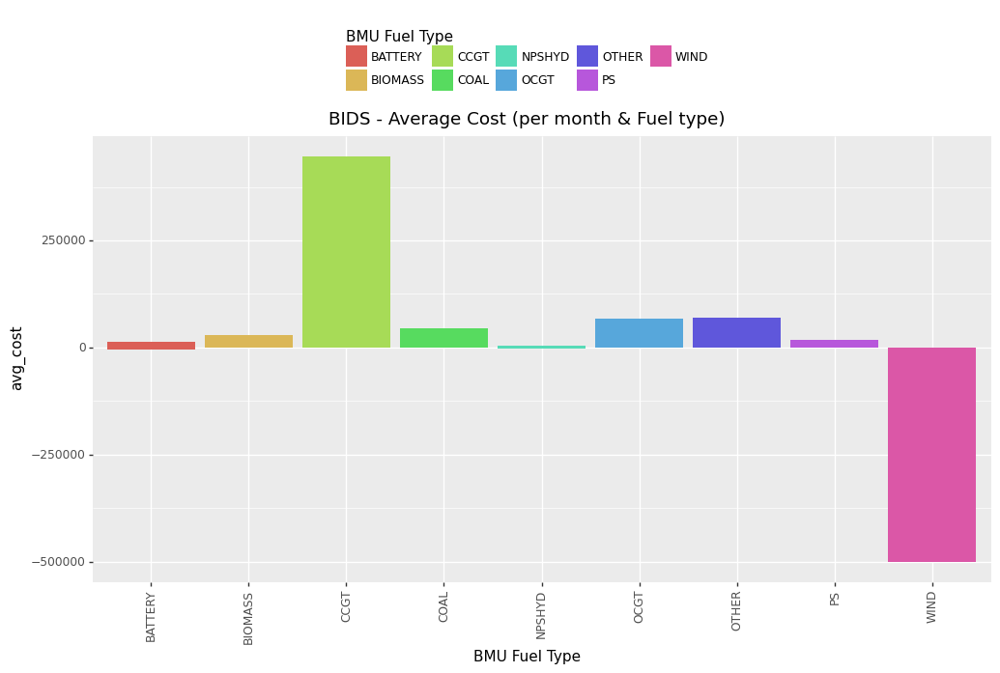

<ggplot: (8787117611651)>

In [112]:
(ggplot(summary_year) 
 + aes(x="BMU Fuel Type", y="avg_cost", fill='BMU Fuel Type')
 + geom_bar(stat='identity', size=3)
 + theme(axis_text_x=element_text(rotation=90))
 + ggtitle('BIDS - Average Cost (per month & Fuel type)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(12, 6), legend_position='top', legend_box_spacing=.3)
)

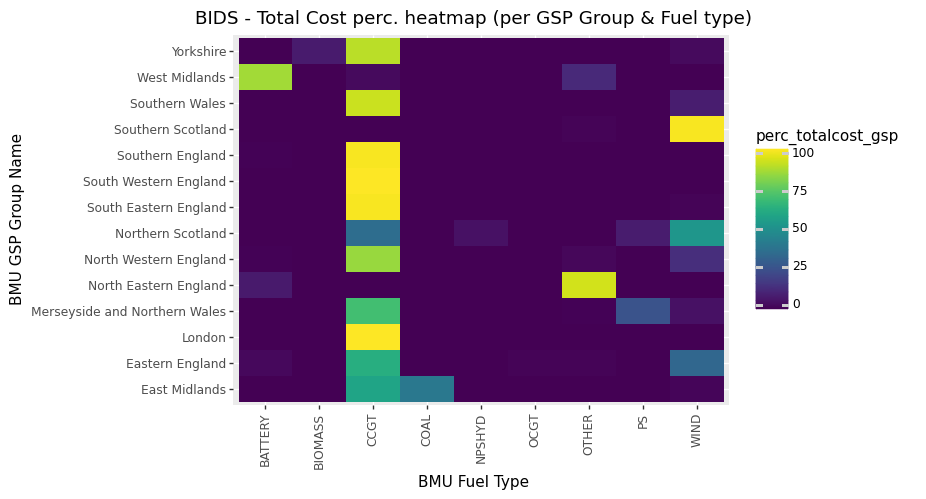

<ggplot: (8787117611474)>

In [113]:
(ggplot(summary_year)
+ aes(x='BMU Fuel Type', y='BMU GSP Group Name', fill='perc_totalcost_gsp')
+ geom_tile()
+ ggtitle('BIDS - Total Cost perc. heatmap (per GSP Group & Fuel type)')
#+ geom_text(aes(label='avg_cost'), color='white')
+ theme(axis_text_x=element_text(rotation=90))
)

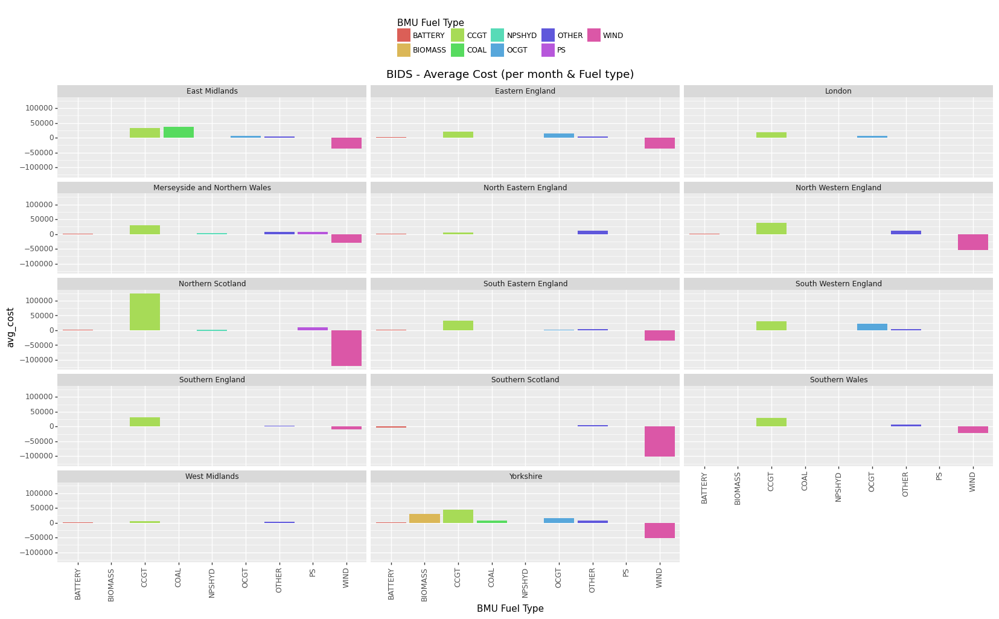

<ggplot: (8787117611495)>

In [114]:
(ggplot(summary_year) 
 + aes(x="BMU Fuel Type", y="avg_cost", fill='BMU Fuel Type')
 + geom_bar(stat='identity', size=3)
 + theme(axis_text_x=element_text(rotation=90))
 + ggtitle('BIDS - Average Cost (per month & Fuel type)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(20, 10), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=3)
)

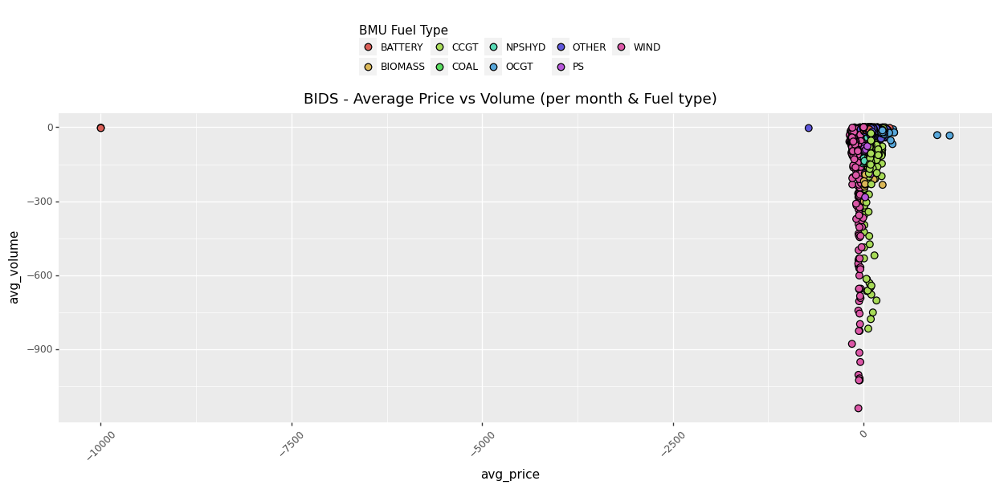

<ggplot: (8787107912804)>

In [115]:
(ggplot(summary_month) 
 + aes(x="avg_price", y="avg_volume", fill='BMU Fuel Type')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('BIDS - Average Price vs Volume (per month & Fuel type)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 5), legend_position='top', legend_box_spacing=.3)
)

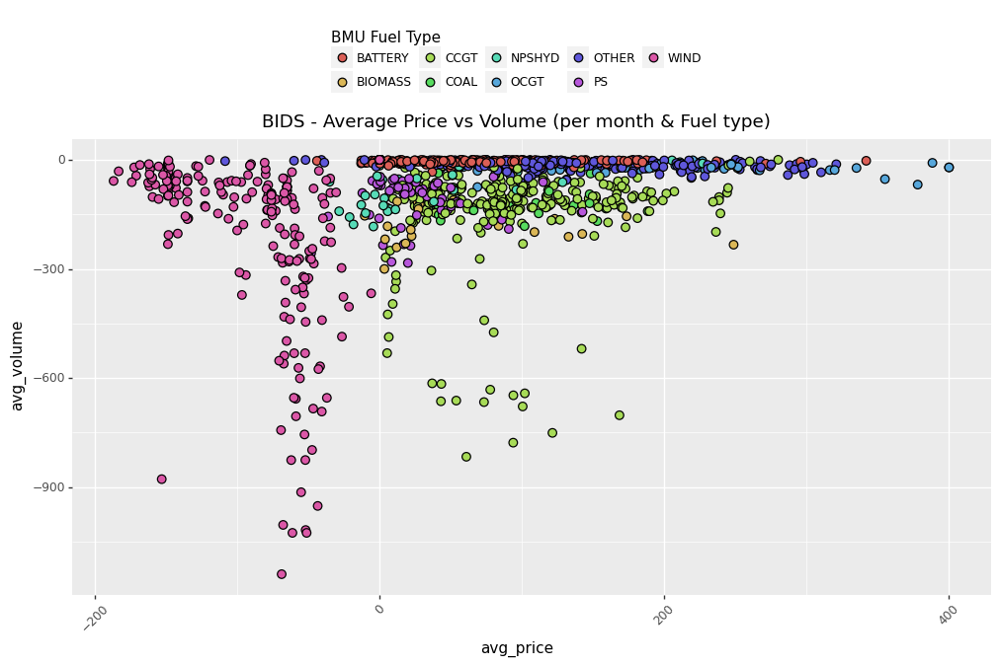

<ggplot: (8787117611114)>

In [116]:
(ggplot(summary_month[(summary_month["avg_price"]>=-500)&(summary_month["avg_price"]<=500)]) 
 + aes(x="avg_price", y="avg_volume", fill='BMU Fuel Type')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('BIDS - Average Price vs Volume (per month & Fuel type)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(12, 6), legend_position='top', legend_box_spacing=.3)
)

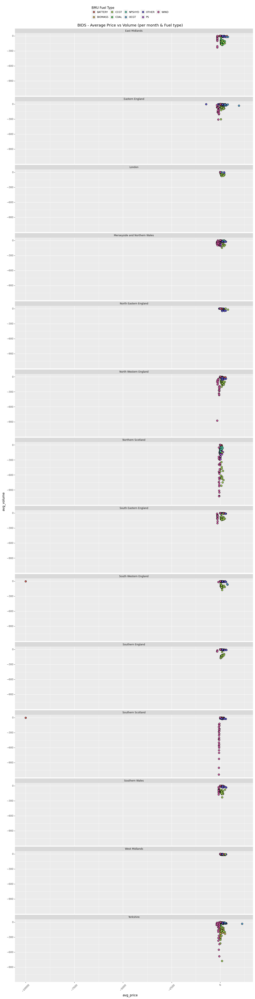

<ggplot: (8787125934114)>

In [117]:
(ggplot(summary_month) 
 + aes(x="avg_price", y="avg_volume", fill='BMU Fuel Type')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('BIDS - Average Price vs Volume (per month & Fuel type)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

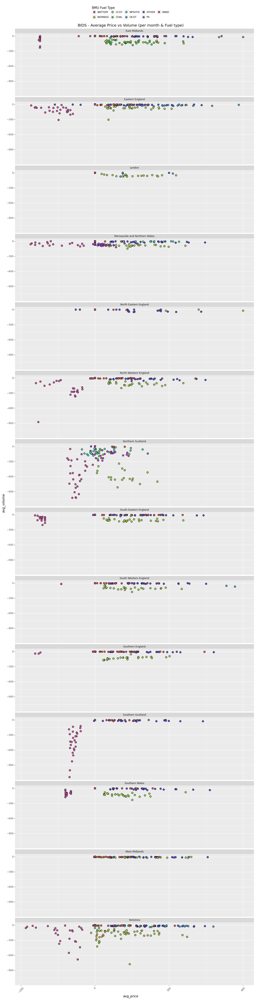

<ggplot: (8787134785218)>

In [118]:
(ggplot(summary_month[(summary_month["avg_price"]>=-500)&(summary_month["avg_price"]<=500)]) 
 + aes(x="avg_price", y="avg_volume", fill='BMU Fuel Type')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('BIDS - Average Price vs Volume (per month & Fuel type)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

##### - GSP breakdown per area

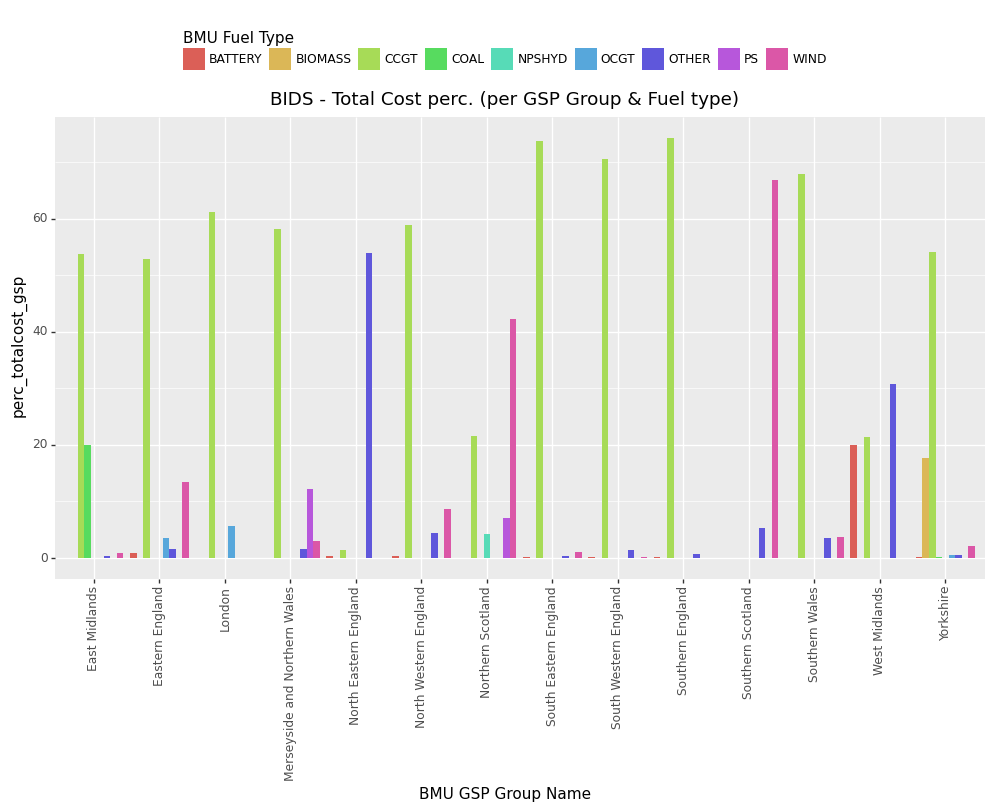

<ggplot: (8787108046221)>

In [119]:
(ggplot(summary_month) 
 + aes(x="BMU GSP Group Name", y="perc_totalcost_gsp", fill='BMU Fuel Type')
 + geom_bar(stat='summary', size=3, position='dodge')
 + ggtitle('BIDS - Total Cost perc. (per GSP Group & Fuel type)')
 + guides(fill=guide_legend(nrow=1))
 + theme(axis_text_x=element_text(rotation=90))
 + theme(figure_size=(12, 6), legend_position='top', legend_box_spacing=.3)
 #+ facet_wrap("BMU GSP Group Name", ncol=1)
)

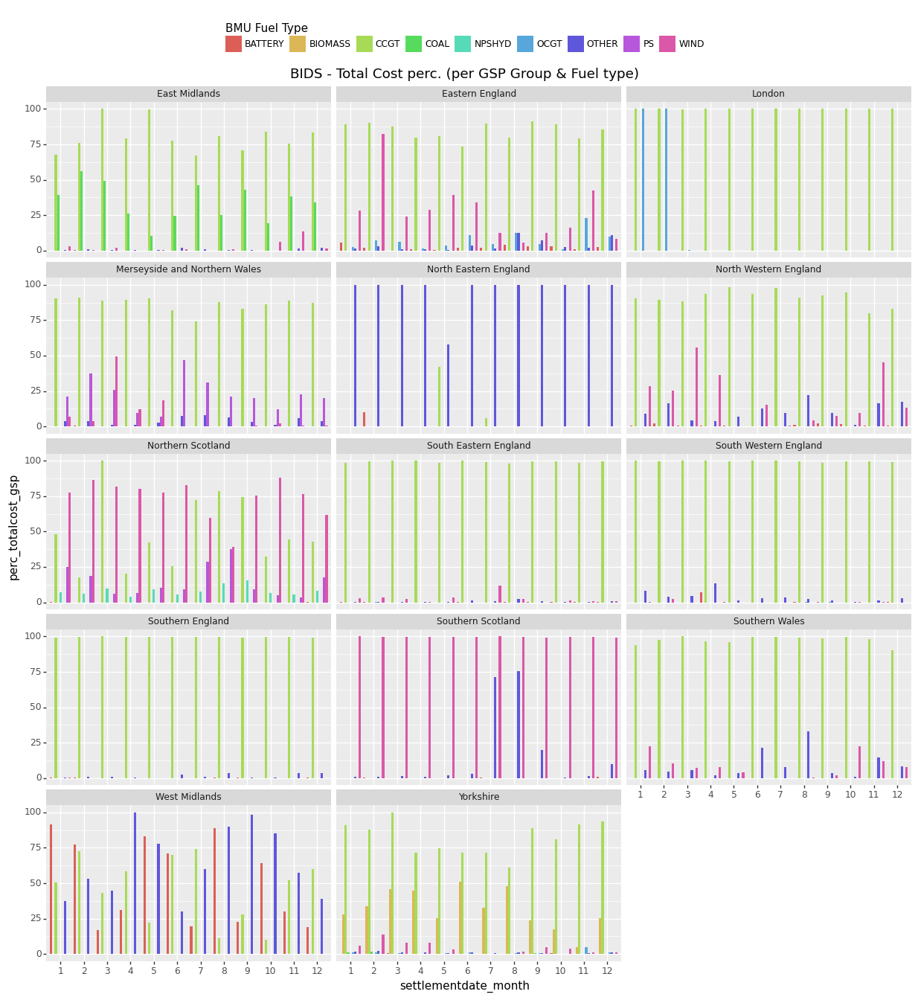

<ggplot: (8787107962082)>

In [120]:
(ggplot(summary_month) 
 + aes(x="settlementdate_month", y="perc_totalcost_gsp", fill='BMU Fuel Type')
 + geom_bar(stat='identity', size=3, position='dodge')
 + ggtitle('BIDS - Total Cost perc. (per GSP Group & Fuel type)')
 + guides(fill=guide_legend(nrow=1))
 + theme(figure_size=(15, 15), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=3)
)

/usr/local/lib/python3.10/dist-packages/plotnine/facets/facet.py:446: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


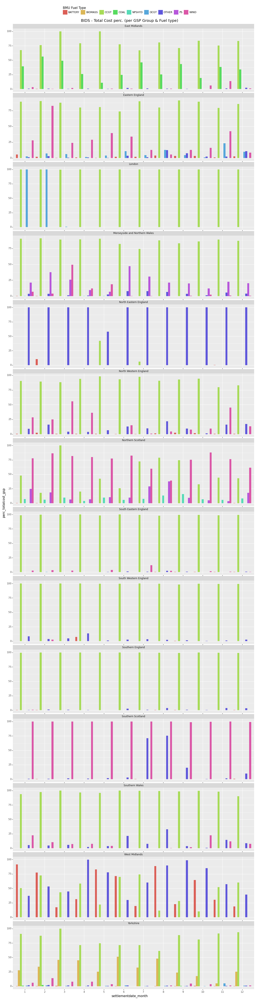

<ggplot: (8787118448109)>

In [121]:
(ggplot(summary_month) 
 + aes(x="settlementdate_month", y="perc_totalcost_gsp", fill='BMU Fuel Type')
 + geom_bar(stat='identity', size=3, position='dodge')
 + ggtitle('BIDS - Total Cost perc. (per GSP Group & Fuel type)')
 + guides(fill=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=1, scales='free')
)

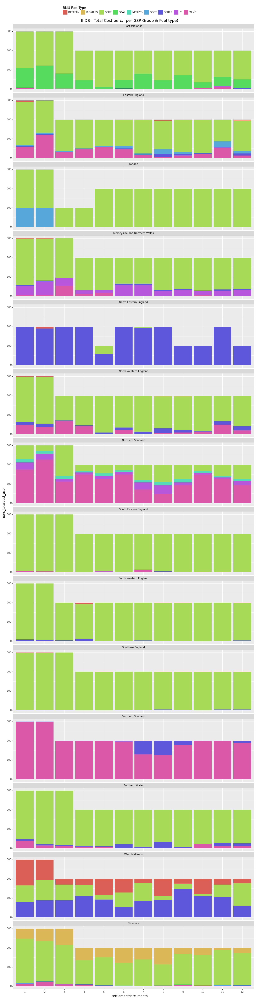

<ggplot: (8787117523299)>

In [122]:
(ggplot(summary_month) 
 + aes(x="settlementdate_month", y="perc_totalcost_gsp", fill='BMU Fuel Type')
 + geom_bar(stat='identity', size=3)
 + ggtitle('BIDS - Total Cost perc. (per GSP Group & Fuel type)')
 + guides(fill=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

/usr/local/lib/python3.10/dist-packages/plotnine/facets/facet.py:446: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


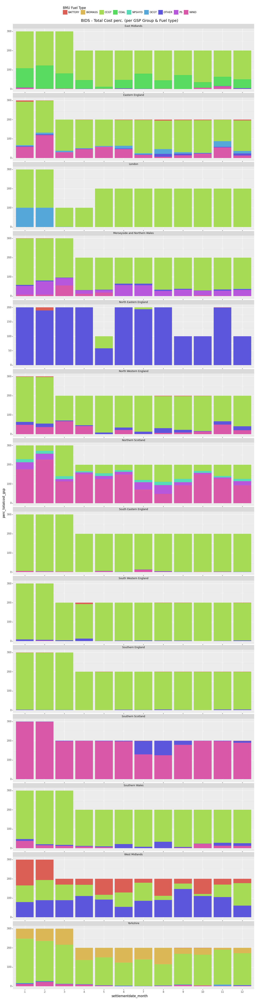

<ggplot: (8787117855657)>

In [123]:
(ggplot(summary_month) 
 + aes(x="settlementdate_month", y="perc_totalcost_gsp", fill='BMU Fuel Type')
 + geom_bar(stat='identity', size=3)
 + ggtitle('BIDS - Total Cost perc. (per GSP Group & Fuel type)')
 + guides(fill=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=1, scales='free')
)

##### - GSP breakdown per month

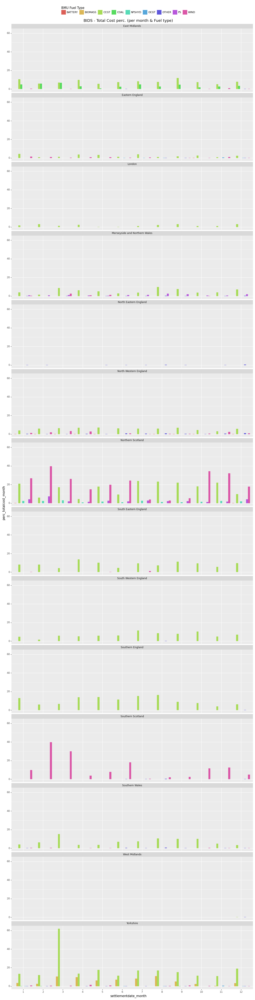

<ggplot: (8787125925952)>

In [124]:
(ggplot(summary_month) 
 + aes(x="settlementdate_month", y="perc_totalcost_month", fill='BMU Fuel Type')
 + geom_bar(stat='identity', size=3, position='dodge')
 + ggtitle('BIDS - Total Cost perc. (per month & Fuel type)')
 + guides(fill=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

/usr/local/lib/python3.10/dist-packages/plotnine/facets/facet.py:446: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


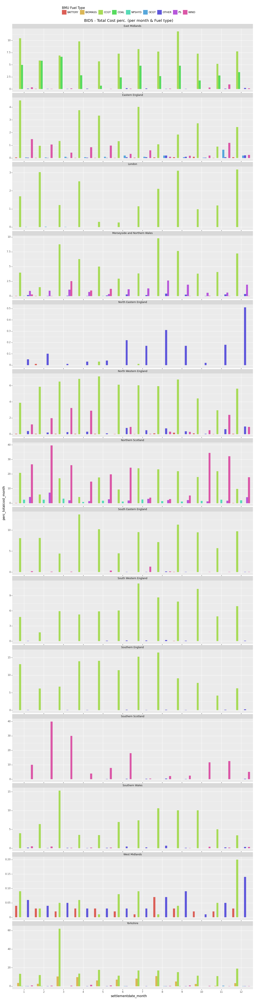

<ggplot: (8787134768951)>

In [125]:
(ggplot(summary_month) 
 + aes(x="settlementdate_month", y="perc_totalcost_month", fill='BMU Fuel Type')
 + geom_bar(stat='identity', size=3, position='dodge')
 + ggtitle('BIDS - Total Cost perc. (per month & Fuel type)')
 + guides(fill=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=1, scales='free')
)

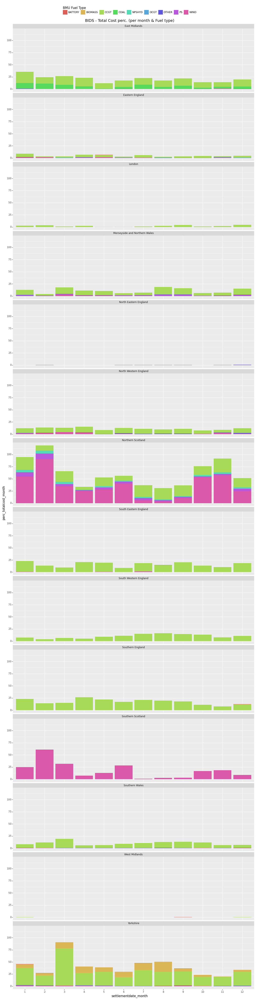

<ggplot: (8787134849304)>

In [126]:
(ggplot(summary_month) 
 + aes(x="settlementdate_month", y="perc_totalcost_month", fill='BMU Fuel Type')
 + geom_bar(stat='identity', size=3)
 + ggtitle('BIDS - Total Cost perc. (per month & Fuel type)')
 + guides(fill=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

/usr/local/lib/python3.10/dist-packages/plotnine/facets/facet.py:446: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


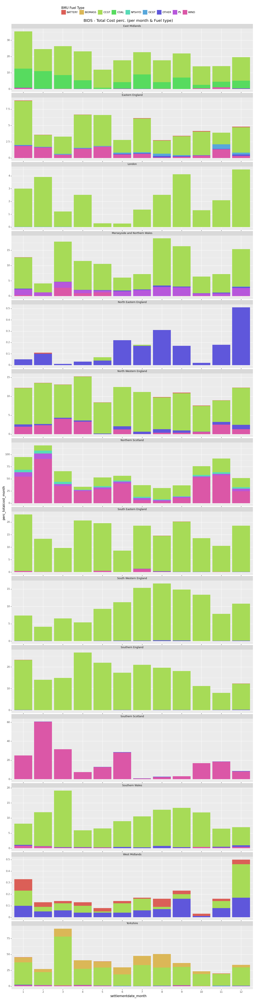

<ggplot: (8787117531599)>

In [127]:
(ggplot(summary_month) 
 + aes(x="settlementdate_month", y="perc_totalcost_month", fill='BMU Fuel Type')
 + geom_bar(stat='identity', size=3)
 + ggtitle('BIDS - Total Cost perc. (per month & Fuel type)')
 + guides(fill=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=1, scales='free')
)

#### 3.2. OFFERS: DISTRIBUCIÓN DE FUEL TYPE (POR ZONA)

Estacionalidad, Tendencia

##### - Dataset

In [128]:
data_final_OFFER = data_final[data_final['recordtype']=='OFFER']
data_final_OFFER.insert(loc=7, column='nr', value=1)
data_final_OFFER.head()

,recordtype,settlementdate,settlementdate_year,settlementdate_month,settlementdate_day,settlementperiod,BMU ID,nr,acceptedprice,acceptedvolume,...,BMU Party ID,BMU Party Name,Trading Unit,PC Flag,PC Status,Transmission Loss Factor,Generation Capacity,Demand Capacity,Base TU Flag,FPN Flag
654268,OFFER,2021-01-01,2021,1,1,1,T_CARR-2,1,74.9,248.334,...,Carrington Power Ltd,CARRINGT,NaN,NaN,Production (P),-0.002334,470.0,-10.0,False (F),True (T)
654269,OFFER,2021-01-01,2021,1,1,1,T_CDCL-1,1,71.9,322.584,...,Uniper UK Limited,EECL,NaN,NaN,Production (P),0.005473,445.0,-12.0,False (F),True (T)
654270,OFFER,2021-01-01,2021,1,1,1,T_DAMC-1,1,72.0,270.000,...,VPI Power Limited,SPGEN01,NaN,NaN,Production (P),0.012051,820.0,-12.0,False (F),True (T)
654271,OFFER,2021-01-01,2021,1,1,1,T_GRAI-6,1,71.9,230.188,...,Uniper UK Limited,EECL,GRAIN PS TRADING UNIT,NaN,Production (P),0.012051,468.0,-14.0,False (F),True (T)
654272,OFFER,2021-01-01,2021,1,1,1,T_GRAI-7,1,70.0,230.000,...,Uniper UK Limited,EECL,GRAIN PS TRADING UNIT,NaN,Production (P),0.012051,468.0,-14.0,False (F),True (T)


In [129]:
data_final_OFFER.columns

Index(['recordtype', 'settlementdate', 'settlementdate_year',
       'settlementdate_month', 'settlementdate_day', 'settlementperiod',
       'BMU ID', 'nr', 'acceptedprice', 'acceptedvolume', 'totalcost',
       'BMU Type', 'BMU Fuel Type', 'BMU GSP Group Id', 'BMU GSP Group Name',
       'LOC LAT', 'LOC LONG', 'GSP LOC Center', 'LOC Center LAT',
       'LOC Center LONG', 'BMU Party ID', 'BMU Party Name', 'Trading Unit',
       'PC Flag', 'PC Status', 'Transmission Loss Factor',
       'Generation Capacity', 'Demand Capacity', 'Base TU Flag', 'FPN Flag'],
      dtype='object')

In [130]:
'''
['recordtype', 'settlementdate', 'settlementperiod',
'BMU Type', 'BMU Fuel Type', 'BMU GSP Group Name',
'Trading Unit', 'PC Flag', 'PC Status',
'Transmission Loss Factor', 'Generation Capacity', 'Demand Capacity',
'Credit Assessment Load Factor','BMU Credit Assessment Export Capability',
'BMU Credit Assessment Import Capability', 'Exempt Export Flag',
'Base TU Flag', 'FPN Flag', 'Interconnector']
'''

"\n['recordtype', 'settlementdate', 'settlementperiod',\n'BMU Type', 'BMU Fuel Type', 'BMU GSP Group Name',\n'Trading Unit', 'PC Flag', 'PC Status',\n'Transmission Loss Factor', 'Generation Capacity', 'Demand Capacity',\n'Credit Assessment Load Factor','BMU Credit Assessment Export Capability',\n'BMU Credit Assessment Import Capability', 'Exempt Export Flag',\n'Base TU Flag', 'FPN Flag', 'Interconnector']\n"

In [131]:
selected_cols = ['recordtype', 'settlementdate', 'settlementperiod', 'nr',
                 'acceptedprice', 'acceptedvolume', 'totalcost',
                 'BMU Fuel Type', 'BMU GSP Group Name']

In [132]:
aggregate_cols = ['recordtype', 'settlementdate', 'settlementperiod', 'BMU GSP Group Name', 'BMU Fuel Type']

In [133]:
data_df = pd.pivot_table(data_final_OFFER[selected_cols],
                         index=aggregate_cols, 
                         aggfunc={'nr':'sum', 'acceptedvolume':'sum', 'totalcost':'sum'})

data_df = data_df.rename(columns={'acceptedvolume':'totalvolume'})
data_df = data_df.reset_index()
data_df.insert(loc=4, column='averageprice', value=( data_df['totalcost'] / abs(data_df['totalvolume']) ))
data_df = data_df[['recordtype', 'settlementdate',	'settlementperiod', 'BMU GSP Group Name', 'BMU Fuel Type', 'nr', 'totalvolume',	'averageprice',	'totalcost']]
data_df = data_df.fillna(0)
data_df

,recordtype,settlementdate,settlementperiod,BMU GSP Group Name,BMU Fuel Type,nr,totalvolume,averageprice,totalcost
0,OFFER,2021-01-01,1,East Midlands,BATTERY,0,0.000,0.0,0.0000
1,OFFER,2021-01-01,1,East Midlands,BIOMASS,0,0.000,0.0,0.0000
2,OFFER,2021-01-01,1,East Midlands,CCGT,1,322.584,71.9,23193.7896
3,OFFER,2021-01-01,1,East Midlands,COAL,0,0.000,0.0,0.0000
4,OFFER,2021-01-01,1,East Midlands,NPSHYD,0,0.000,0.0,0.0000
...,...,...,...,...,...,...,...,...,...
4771867,OFFER,2023-03-01,48,Yorkshire,NPSHYD,0,0.000,0.0,0.0000
4771868,OFFER,2023-03-01,48,Yorkshire,OCGT,0,0.000,0.0,0.0000
4771869,OFFER,2023-03-01,48,Yorkshire,OTHER,0,0.000,0.0,0.0000
4771870,OFFER,2023-03-01,48,Yorkshire,PS,0,0.000,0.0,0.0000


In [134]:
data_df.insert(loc=1, column='settlementdate_year', value=data_df['settlementdate'].dt.year)

order = list(data_df['settlementdate_year'].unique())
order.sort()
data = data_df['settlementdate_year']
data_df['settlementdate_year'] = pd.Categorical(data, order, ordered=True)

In [135]:
data_df.insert(loc=2, column='settlementdate_month', value=data_df['settlementdate'].dt.month)

order = list(data_df['settlementdate_month'].unique())
order.sort()
data = data_df['settlementdate_month']
data_df['settlementdate_month'] = pd.Categorical(data, order, ordered=True)

In [136]:
data_df.insert(loc=3, column='settlementdate_day', value=data_df['settlementdate'].dt.day)

order = list(data_df['settlementdate_day'].unique())
order.sort()
data = data_df['settlementdate_day']
data_df['settlementdate_day'] = pd.Categorical(data, order, ordered=True)


In [137]:
data_df

,recordtype,settlementdate_year,settlementdate_month,settlementdate_day,settlementdate,settlementperiod,BMU GSP Group Name,BMU Fuel Type,nr,totalvolume,averageprice,totalcost
0,OFFER,2021,1,1,2021-01-01,1,East Midlands,BATTERY,0,0.000,0.0,0.0000
1,OFFER,2021,1,1,2021-01-01,1,East Midlands,BIOMASS,0,0.000,0.0,0.0000
2,OFFER,2021,1,1,2021-01-01,1,East Midlands,CCGT,1,322.584,71.9,23193.7896
3,OFFER,2021,1,1,2021-01-01,1,East Midlands,COAL,0,0.000,0.0,0.0000
4,OFFER,2021,1,1,2021-01-01,1,East Midlands,NPSHYD,0,0.000,0.0,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...
4771867,OFFER,2023,3,1,2023-03-01,48,Yorkshire,NPSHYD,0,0.000,0.0,0.0000
4771868,OFFER,2023,3,1,2023-03-01,48,Yorkshire,OCGT,0,0.000,0.0,0.0000
4771869,OFFER,2023,3,1,2023-03-01,48,Yorkshire,OTHER,0,0.000,0.0,0.0000
4771870,OFFER,2023,3,1,2023-03-01,48,Yorkshire,PS,0,0.000,0.0,0.0000


##### - Summary table

In [138]:
data_df.head()

,recordtype,settlementdate_year,settlementdate_month,settlementdate_day,settlementdate,settlementperiod,BMU GSP Group Name,BMU Fuel Type,nr,totalvolume,averageprice,totalcost
0,OFFER,2021,1,1,2021-01-01,1,East Midlands,BATTERY,0,0.000,0.0,0.0000
1,OFFER,2021,1,1,2021-01-01,1,East Midlands,BIOMASS,0,0.000,0.0,0.0000
2,OFFER,2021,1,1,2021-01-01,1,East Midlands,CCGT,1,322.584,71.9,23193.7896
3,OFFER,2021,1,1,2021-01-01,1,East Midlands,COAL,0,0.000,0.0,0.0000
4,OFFER,2021,1,1,2021-01-01,1,East Midlands,NPSHYD,0,0.000,0.0,0.0000


In [139]:
cols = ['recordtype', 'settlementdate_year', 'settlementdate_month', 'BMU GSP Group Name', 'BMU Fuel Type',
        'perc_nr_month', 'perc_nr_gsp', 'nr', 'avg_price', 'med_price', 'max_price', 'min_price', 
        'avg_volume', 'med_volume', 'max_volume', 'min_volume',
        'perc_totalcost_month', 'perc_totalcost_gsp', 'totalcost', 'avg_cost', 'med_cost', 'max_cost', 'min_cost']

In [140]:
summary_month = pd.DataFrame(columns=cols)
summary_month

,recordtype,settlementdate_year,settlementdate_month,BMU GSP Group Name,BMU Fuel Type,perc_nr_month,perc_nr_gsp,nr,avg_price,med_price,...,med_volume,max_volume,min_volume,perc_totalcost_month,perc_totalcost_gsp,totalcost,avg_cost,med_cost,max_cost,min_cost


In [141]:
years = list(data_df['settlementdate_year'].unique())
months = list(data_df['settlementdate_month'].unique())
gsp_groups = list(data_df['BMU GSP Group Name'].unique())
fuel_types = list(data_df['BMU Fuel Type'].unique())

In [142]:
'''
i = 0

for x in years:
  for y in months:

    df_month = data_df[(data_df['settlementdate_year']==x)&(data_df['settlementdate_month']==y)&(data_df['totalvolume']!=0)]
    nr_month = round(df_month['nr'].sum(), 0)
    cost_month = df_month[df_month['totalcost']>0]['totalcost'].sum() - df_month[df_month['totalcost']<0]['totalcost'].sum()

    for z in gsp_groups:

      df_gsp = data_df[(data_df['settlementdate_year']==x)&(data_df['settlementdate_month']==y)&(data_df['BMU GSP Group Name']==z)&(data_df['totalvolume']!=0)]
      nr_gsp = round(df_gsp['nr'].sum(), 0)
      cost_gsp = df_gsp[df_gsp['totalcost']>0]['totalcost'].sum() - df_gsp[df_gsp['totalcost']<0]['totalcost'].sum()

      for u in fuel_types:

        df = data_df[(data_df['settlementdate_year']==x)&(data_df['settlementdate_month']==y)&(data_df['BMU GSP Group Name']==z)&(data_df['BMU Fuel Type']==u)&(data_df['totalvolume']!=0)]

        summary_month.loc[i,'recordtype'] = data_df.loc[0,'recordtype']
        summary_month.loc[i,'settlementdate_year'] = x
        summary_month.loc[i,'settlementdate_month'] = y
        summary_month.loc[i,'BMU GSP Group Name'] = z
        summary_month.loc[i,'BMU Fuel Type'] = u

        summary_month.loc[i,'nr'] = round(df['nr'].sum(), 0)
        if nr_month != 0:
          summary_month.loc[i,'perc_nr_month'] = round(df['nr'].sum() / nr_month * 100, 2)
        if nr_gsp != 0:
          summary_month.loc[i,'perc_nr_gsp'] = round(df['nr'].sum() / nr_gsp * 100, 2)

        summary_month.loc[i,'avg_price'] = round(df['averageprice'].mean(), 2)
        summary_month.loc[i,'med_price'] = round(df['averageprice'].median(), 2)
        summary_month.loc[i,'max_price'] = round(df['averageprice'].max(), 2)
        summary_month.loc[i,'min_price'] = round(df['averageprice'].min(), 2)

        summary_month.loc[i,'avg_volume'] = round(df['totalvolume'].mean(), 3)
        summary_month.loc[i,'med_volume'] = round(df['totalvolume'].median(), 3)
        summary_month.loc[i,'max_volume'] = round(df['totalvolume'].max(), 3)
        summary_month.loc[i,'min_volume'] = round(df['totalvolume'].min(), 3)

        if cost_month != 0:
          summary_month.loc[i,'perc_totalcost_month'] = round( (df[df['totalcost']>0]['totalcost'].sum() - df[df['totalcost']<0]['totalcost'].sum()) / cost_month * 100, 2)  
        if cost_gsp != 0:
          summary_month.loc[i,'perc_totalcost_gsp'] = round( (df[df['totalcost']>0]['totalcost'].sum() - df[df['totalcost']<0]['totalcost'].sum()) / cost_gsp * 100, 2)
        summary_month.loc[i,'totalcost'] = round(df['totalcost'].sum(), 2)
        summary_month.loc[i,'avg_cost'] = round(df['totalcost'].mean(), 2)
        summary_month.loc[i,'med_cost'] = round(df['totalcost'].median(), 2)
        summary_month.loc[i,'max_cost'] = round(df['totalcost'].max(), 2)
        summary_month.loc[i,'min_cost'] = round(df['totalcost'].min(), 2)

        i += 1

summary_month = summary_month.fillna(0)
'''

In [143]:
file_path = '/content/drive/MyDrive/QEnergy/Results/Summary tables/OFFERS 2021-23_Data Summary (per month & Fuel).xlsx'

In [144]:
#summary_month.to_excel(file_path, index=False)

In [145]:
summary_month = pd.read_excel(file_path)
summary_month

,recordtype,settlementdate_year,settlementdate_month,BMU GSP Group Name,BMU Fuel Type,perc_nr_month,perc_nr_gsp,nr,avg_price,med_price,...,med_volume,max_volume,min_volume,perc_totalcost_month,perc_totalcost_gsp,totalcost,avg_cost,med_cost,max_cost,min_cost
0,OFFER,2021,1,East Midlands,BATTERY,0.03,0.23,4,79.42,79.23,...,3.092,7.000,1.984,0.00,0.01,1204.60,301.15,246.40,554.61,157.19
1,OFFER,2021,1,East Midlands,BIOMASS,0.00,0.00,0,0.00,0.00,...,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,OFFER,2021,1,East Midlands,CCGT,7.42,65.43,1132,76.82,73.69,...,201.166,1526.644,0.001,6.88,90.58,15789852.85,21025.10,15593.12,115139.20,0.04
3,OFFER,2021,1,East Midlands,COAL,1.50,13.24,229,70.50,72.00,...,67.824,732.000,0.001,0.59,7.82,1362484.31,8963.71,5059.54,56709.00,0.06
4,OFFER,2021,1,East Midlands,NPSHYD,0.00,0.00,0,0.00,0.00,...,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4531,OFFER,2023,12,Yorkshire,NPSHYD,0.00,0.00,0,0.00,0.00,...,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00
4532,OFFER,2023,12,Yorkshire,OCGT,0.00,0.00,0,0.00,0.00,...,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00
4533,OFFER,2023,12,Yorkshire,OTHER,0.00,0.00,0,0.00,0.00,...,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00
4534,OFFER,2023,12,Yorkshire,PS,0.00,0.00,0,0.00,0.00,...,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [146]:
order = list(summary_month['settlementdate_year'].unique())
order.sort()
data = summary_month['settlementdate_year']
summary_month['settlementdate_year'] = pd.Categorical(data, order, ordered=True)

In [147]:
order = list(summary_month['settlementdate_month'].unique())
order.sort()
data = summary_month['settlementdate_month']
summary_month['settlementdate_month'] = pd.Categorical(data, order, ordered=True)

In [148]:
summary_month[(summary_month['settlementdate_month']==1)&(summary_month['BMU GSP Group Name'].isin(['East Midlands', 'Southern England', 'Yorkshire']))]

,recordtype,settlementdate_year,settlementdate_month,BMU GSP Group Name,BMU Fuel Type,perc_nr_month,perc_nr_gsp,nr,avg_price,med_price,...,med_volume,max_volume,min_volume,perc_totalcost_month,perc_totalcost_gsp,totalcost,avg_cost,med_cost,max_cost,min_cost
0,OFFER,2021,1,East Midlands,BATTERY,0.03,0.23,4,79.42,79.23,...,3.092,7.000,1.984,0.00,0.01,1204.60,301.15,246.40,554.61,157.19
1,OFFER,2021,1,East Midlands,BIOMASS,0.00,0.00,0,0.00,0.00,...,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,OFFER,2021,1,East Midlands,CCGT,7.42,65.43,1132,76.82,73.69,...,201.166,1526.644,0.001,6.88,90.58,15789852.85,21025.10,15593.12,115139.20,0.04
3,OFFER,2021,1,East Midlands,COAL,1.50,13.24,229,70.50,72.00,...,67.824,732.000,0.001,0.59,7.82,1362484.31,8963.71,5059.54,56709.00,0.06
4,OFFER,2021,1,East Midlands,NPSHYD,0.00,0.00,0,0.00,0.00,...,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3145,OFFER,2023,1,Yorkshire,NPSHYD,0.00,0.00,0,0.00,0.00,...,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00
3146,OFFER,2023,1,Yorkshire,OCGT,0.71,4.47,114,258.84,252.00,...,48.000,48.000,3.200,0.24,1.37,1104263.20,9686.52,11328.00,16660.00,691.20
3147,OFFER,2023,1,Yorkshire,OTHER,0.53,3.33,85,272.29,262.69,...,27.417,136.400,0.017,0.12,0.67,541931.59,9343.65,8210.64,37468.60,4.16
3148,OFFER,2023,1,Yorkshire,PS,0.00,0.00,0,0.00,0.00,...,0.000,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [149]:
cols = ['recordtype', 'settlementdate_year', 'BMU GSP Group Name', 'BMU Fuel Type',
        'perc_nr_year', 'perc_nr_gsp', 'nr', 'avg_price', 'med_price', 'max_price', 'min_price', 
        'avg_volume', 'med_volume', 'max_volume', 'min_volume',
        'perc_totalcost_year', 'perc_totalcost_gsp', 'totalcost', 'avg_cost', 'med_cost', 'max_cost', 'min_cost', 'totalcost']

In [150]:
summary_year = pd.DataFrame(columns=cols)
summary_year

,recordtype,settlementdate_year,BMU GSP Group Name,BMU Fuel Type,perc_nr_year,perc_nr_gsp,nr,avg_price,med_price,max_price,...,max_volume,min_volume,perc_totalcost_year,perc_totalcost_gsp,totalcost,avg_cost,med_cost,max_cost,min_cost,totalcost


In [151]:
years = list(data_df['settlementdate_year'].unique())
gsp_groups = list(data_df['BMU GSP Group Name'].unique())
fuel_types = list(data_df['BMU Fuel Type'].unique())

In [152]:
'''
i = 0

for x in years:

    df_year = data_df[(data_df['settlementdate_year']==x)&(data_df['totalvolume']!=0)]
    nr_year = round(df_year['nr'].sum(), 0)
    cost_year = df_year[df_year['totalcost']>0]['totalcost'].sum() - df_year[df_year['totalcost']<0]['totalcost'].sum()

    for z in gsp_groups:

      df_gsp = data_df[(data_df['settlementdate_year']==x)&(data_df['BMU GSP Group Name']==z)&(data_df['totalvolume']!=0)]
      nr_gsp = round(df_gsp['nr'].sum(), 0)
      cost_gsp = df_gsp[df_gsp['totalcost']>0]['totalcost'].sum() - df_gsp[df_gsp['totalcost']<0]['totalcost'].sum()

      for u in fuel_types:

        df = data_df[(data_df['settlementdate_year']==x)&(data_df['BMU GSP Group Name']==z)&(data_df['BMU Fuel Type']==u)&(data_df['totalvolume']!=0)]

        summary_year.loc[i,'recordtype'] = data_df.loc[0,'recordtype']
        summary_year.loc[i,'settlementdate_year'] = x
        summary_year.loc[i,'BMU GSP Group Name'] = z
        summary_year.loc[i,'BMU Fuel Type'] = u

        summary_year.loc[i,'nr'] = round(df['nr'].sum(), 0)
        if nr_year != 0:
          summary_year.loc[i,'perc_nr_year'] = round(df['nr'].sum() / nr_year * 100, 2)
        if nr_gsp != 0:
          summary_year.loc[i,'perc_nr_gsp'] = round(df['nr'].sum() / nr_gsp * 100, 2)

        summary_year.loc[i,'avg_price'] = round(df['averageprice'].mean(), 2)
        summary_year.loc[i,'med_price'] = round(df['averageprice'].median(), 2)
        summary_year.loc[i,'max_price'] = round(df['averageprice'].max(), 2)
        summary_year.loc[i,'min_price'] = round(df['averageprice'].min(), 2)

        summary_year.loc[i,'avg_volume'] = round(df['totalvolume'].mean(), 3)
        summary_year.loc[i,'med_volume'] = round(df['totalvolume'].median(), 3)
        summary_year.loc[i,'max_volume'] = round(df['totalvolume'].max(), 3)
        summary_year.loc[i,'min_volume'] = round(df['totalvolume'].min(), 3)

        if cost_year != 0:
          summary_year.loc[i,'perc_totalcost_year'] = round( (df[df['totalcost']>0]['totalcost'].sum() - df[df['totalcost']<0]['totalcost'].sum()) / cost_year * 100, 2)
        if cost_gsp != 0:
          summary_year.loc[i,'perc_totalcost_gsp'] = round( (df[df['totalcost']>0]['totalcost'].sum() - df[df['totalcost']<0]['totalcost'].sum()) / cost_gsp * 100, 2)
        summary_year.loc[i,'totalcost'] = round(df['totalcost'].sum(), 2)
        summary_year.loc[i,'avg_cost'] = round(df['totalcost'].mean(), 2)
        summary_year.loc[i,'med_cost'] = round(df['totalcost'].median(), 2)
        summary_year.loc[i,'max_cost'] = round(df['totalcost'].max(), 2)
        summary_year.loc[i,'min_cost'] = round(df['totalcost'].min(), 2)
        summary_year.loc[i,'totalcost'] = round(df['totalcost'].min(), 2)

        i += 1

summary_year = summary_year.fillna(0)
'''

In [153]:
file_path = '/content/drive/MyDrive/QEnergy/Results/Summary tables/OFFERS 2021-23_Data Summary (per year & Fuel).xlsx'

In [154]:
#summary_year.to_excel(file_path, index=False)

In [155]:
summary_year = pd.read_excel(file_path)
summary_year

,recordtype,settlementdate_year,BMU GSP Group Name,BMU Fuel Type,perc_nr_year,perc_nr_gsp,nr,avg_price,med_price,max_price,...,max_volume,min_volume,perc_totalcost_year,perc_totalcost_gsp,totalcost,avg_cost,med_cost,max_cost,min_cost,totalcost.1
0,OFFER,2021,East Midlands,BATTERY,0.01,0.09,22,135.82,90.00,364.00,...,9.834,0.001,0.00,0.00,0.03,509.40,403.50,1941.58,0.03,0.03
1,OFFER,2021,East Midlands,BIOMASS,0.00,0.00,0,0.00,0.00,0.00,...,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,OFFER,2021,East Midlands,CCGT,6.72,58.24,13948,138.93,110.00,1629.32,...,1668.262,0.001,7.49,60.89,0.03,34264.96,25520.41,297744.00,0.03,0.03
3,OFFER,2021,East Midlands,COAL,2.08,18.02,4315,216.81,114.50,3800.00,...,1731.560,0.001,4.63,37.64,0.06,62050.86,29819.37,2105400.00,0.06,0.06
4,OFFER,2021,East Midlands,NPSHYD,0.00,0.00,0,0.00,0.00,0.00,...,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
373,OFFER,2023,Yorkshire,NPSHYD,0.00,0.00,0,0.00,0.00,0.00,...,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
374,OFFER,2023,Yorkshire,OCGT,0.67,4.18,190,247.59,237.00,500.00,...,48.000,0.400,0.22,1.16,90.80,9134.90,10752.00,16660.00,90.80,90.80
375,OFFER,2023,Yorkshire,OTHER,0.52,3.26,148,259.33,257.20,338.00,...,136.400,0.017,0.11,0.58,4.16,8173.02,6943.02,37468.60,4.16,4.16
376,OFFER,2023,Yorkshire,PS,0.00,0.00,0,0.00,0.00,0.00,...,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [156]:
order = list(summary_year['settlementdate_year'].unique())
order.sort()
data = summary_year['settlementdate_year']
summary_year['settlementdate_year'] = pd.Categorical(data, order, ordered=True)

In [157]:
summary_year[summary_year['BMU GSP Group Name'].isin(['East Midlands', 'Southern England', 'Yorkshire'])]

,recordtype,settlementdate_year,BMU GSP Group Name,BMU Fuel Type,perc_nr_year,perc_nr_gsp,nr,avg_price,med_price,max_price,...,max_volume,min_volume,perc_totalcost_year,perc_totalcost_gsp,totalcost,avg_cost,med_cost,max_cost,min_cost,totalcost.1
0,OFFER,2021,East Midlands,BATTERY,0.01,0.09,22,135.82,90.00,364.00,...,9.834,0.001,0.00,0.00,0.03,509.40,403.50,1941.58,0.03,0.03
1,OFFER,2021,East Midlands,BIOMASS,0.00,0.00,0,0.00,0.00,0.00,...,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,OFFER,2021,East Midlands,CCGT,6.72,58.24,13948,138.93,110.00,1629.32,...,1668.262,0.001,7.49,60.89,0.03,34264.96,25520.41,297744.00,0.03,0.03
3,OFFER,2021,East Midlands,COAL,2.08,18.02,4315,216.81,114.50,3800.00,...,1731.560,0.001,4.63,37.64,0.06,62050.86,29819.37,2105400.00,0.06,0.06
4,OFFER,2021,East Midlands,NPSHYD,0.00,0.00,0,0.00,0.00,0.00,...,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
373,OFFER,2023,Yorkshire,NPSHYD,0.00,0.00,0,0.00,0.00,0.00,...,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
374,OFFER,2023,Yorkshire,OCGT,0.67,4.18,190,247.59,237.00,500.00,...,48.000,0.400,0.22,1.16,90.80,9134.90,10752.00,16660.00,90.80,90.80
375,OFFER,2023,Yorkshire,OTHER,0.52,3.26,148,259.33,257.20,338.00,...,136.400,0.017,0.11,0.58,4.16,8173.02,6943.02,37468.60,4.16,4.16
376,OFFER,2023,Yorkshire,PS,0.00,0.00,0,0.00,0.00,0.00,...,0.000,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


##### - General visualizations

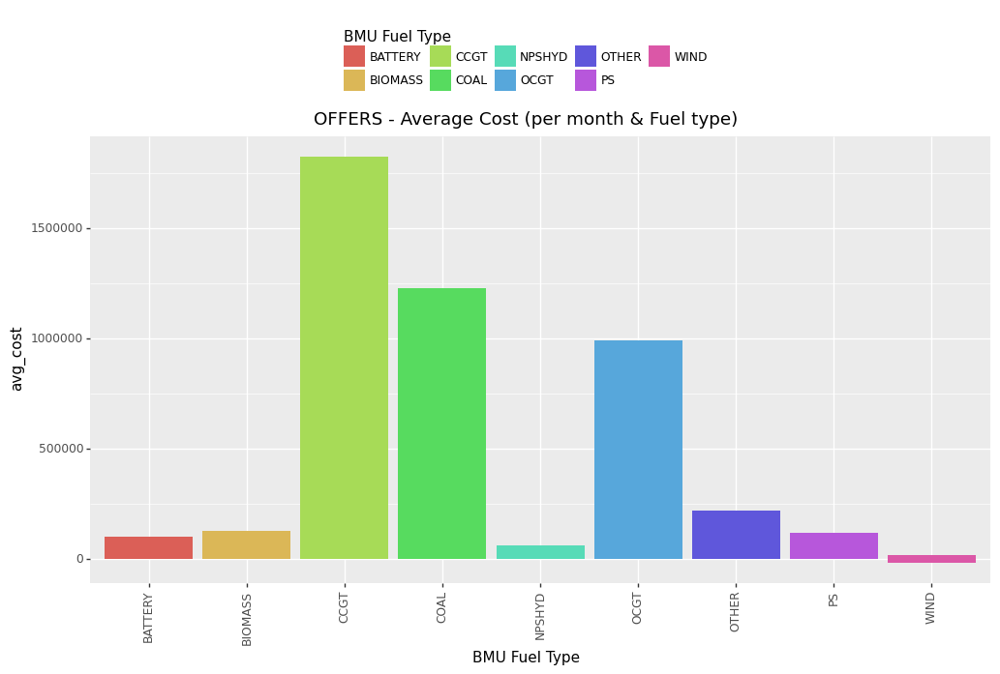

<ggplot: (8787108488706)>

In [158]:
(ggplot(summary_year) 
 + aes(x="BMU Fuel Type", y="avg_cost", fill='BMU Fuel Type')
 + geom_bar(stat='identity', size=3)
 + theme(axis_text_x=element_text(rotation=90))
 + ggtitle('OFFERS - Average Cost (per month & Fuel type)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(12, 6), legend_position='top', legend_box_spacing=.3)
)

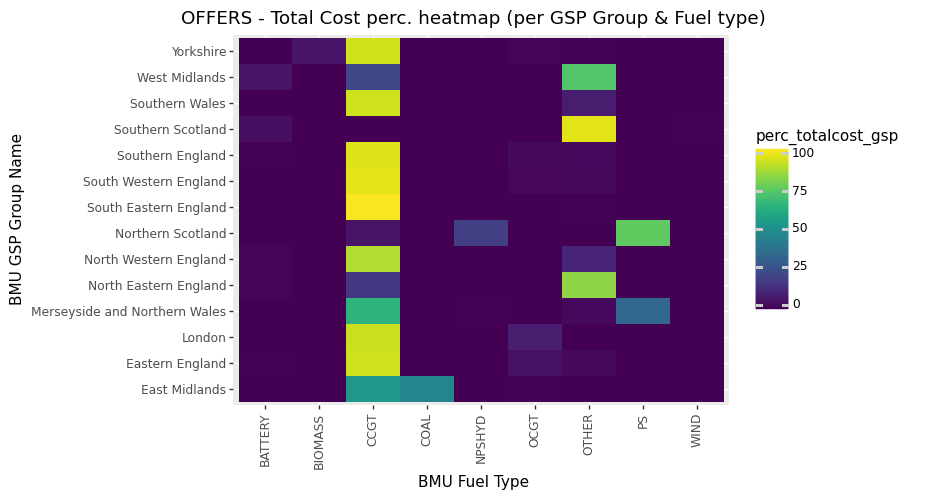

<ggplot: (8787125713542)>

In [159]:
(ggplot(summary_year)
+ aes(x='BMU Fuel Type', y='BMU GSP Group Name', fill='perc_totalcost_gsp')
+ geom_tile()
+ ggtitle('OFFERS - Total Cost perc. heatmap (per GSP Group & Fuel type)')
#+ geom_text(aes(label='avg_cost'), color='white')
+ theme(axis_text_x=element_text(rotation=90))
)

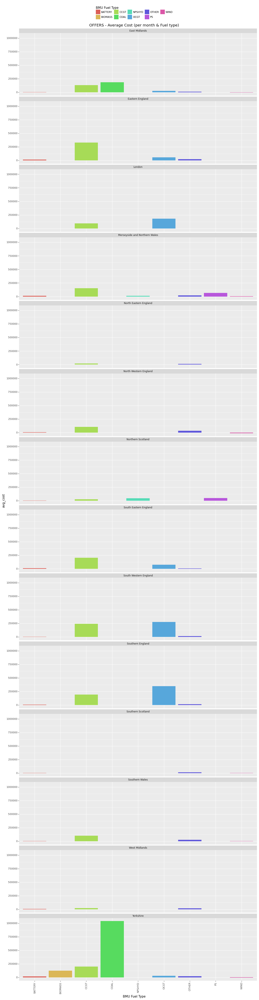

<ggplot: (8787108817200)>

In [160]:
(ggplot(summary_year) 
 + aes(x="BMU Fuel Type", y="avg_cost", fill='BMU Fuel Type')
 + geom_bar(stat='identity', size=3)
 + theme(axis_text_x=element_text(rotation=90))
 + ggtitle('OFFERS - Average Cost (per month & Fuel type)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

/usr/local/lib/python3.10/dist-packages/plotnine/facets/facet.py:446: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


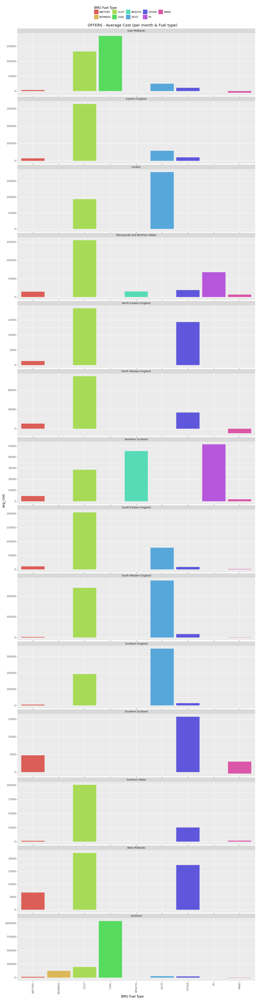

<ggplot: (8787117650239)>

In [161]:
(ggplot(summary_year) 
 + aes(x="BMU Fuel Type", y="avg_cost", fill='BMU Fuel Type')
 + geom_bar(stat='identity', size=3)
 + theme(axis_text_x=element_text(rotation=90))
 + ggtitle('OFFERS - Average Cost (per month & Fuel type)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=1, scales='free')
)

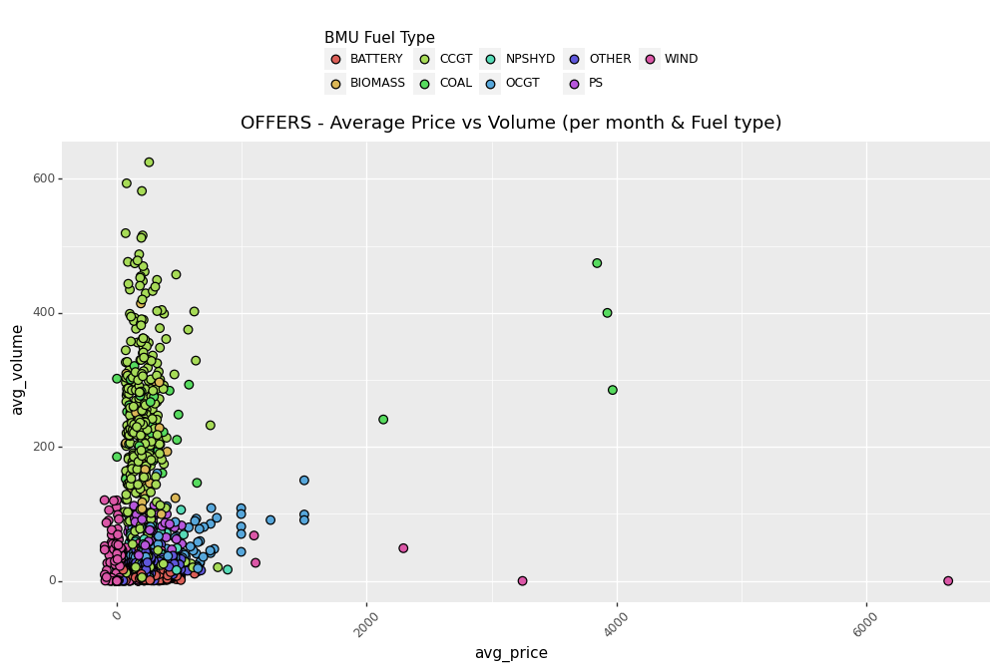

<ggplot: (8787117847829)>

In [162]:
(ggplot(summary_month) 
 + aes(x="avg_price", y="avg_volume", fill='BMU Fuel Type')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('OFFERS - Average Price vs Volume (per month & Fuel type)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(12, 6), legend_position='top', legend_box_spacing=.3)
)

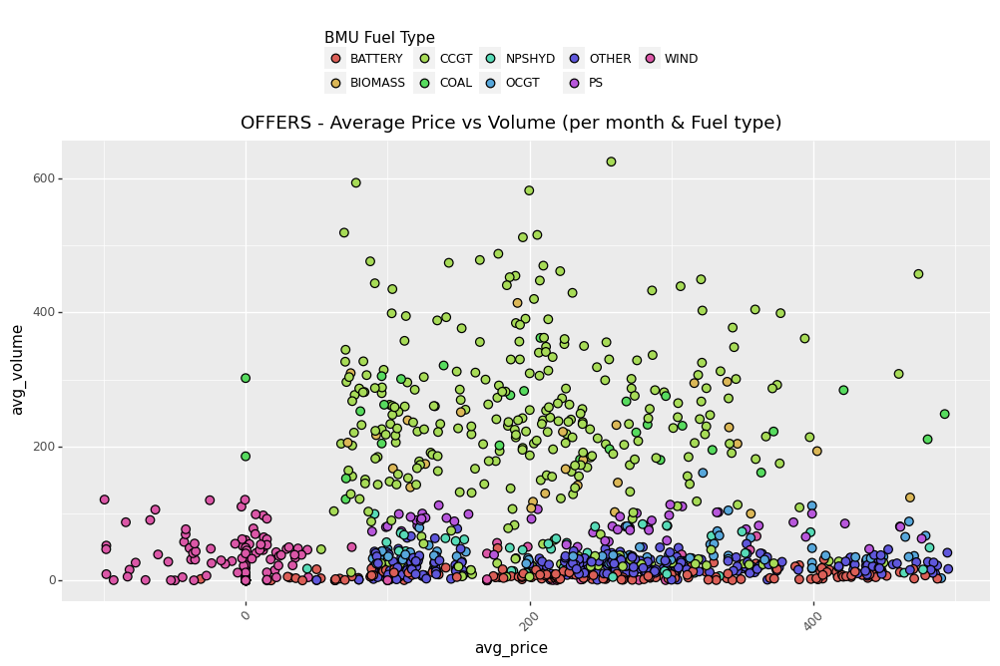

<ggplot: (8787108815833)>

In [163]:
(ggplot(summary_month[(summary_month["avg_price"]>=-500)&(summary_month["avg_price"]<=500)]) 
 + aes(x="avg_price", y="avg_volume", fill='BMU Fuel Type')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('OFFERS - Average Price vs Volume (per month & Fuel type)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(12, 6), legend_position='top', legend_box_spacing=.3)
)

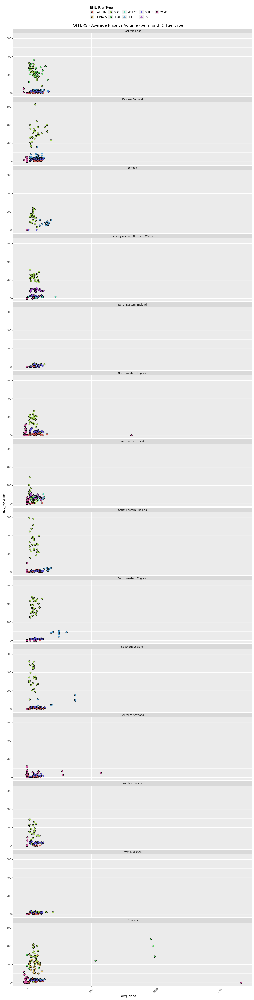

<ggplot: (8787117508071)>

In [164]:
(ggplot(summary_month) 
 + aes(x="avg_price", y="avg_volume", fill='BMU Fuel Type')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('OFFERS - Average Price vs Volume (per month & Fuel type)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

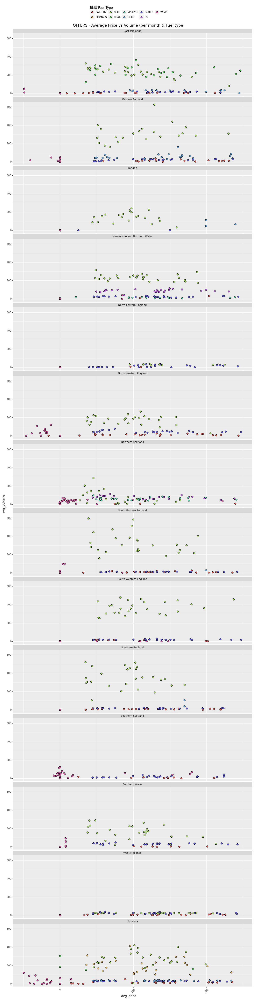

<ggplot: (8787118428827)>

In [165]:
(ggplot(summary_month[(summary_month["avg_price"]>=-500)&(summary_month["avg_price"]<=500)]) 
 + aes(x="avg_price", y="avg_volume", fill='BMU Fuel Type')
 + geom_point(size=3)
 + theme(axis_text_x=element_text(rotation=45))
 + ggtitle('OFFERS - Average Price vs Volume (per month & Fuel type)')
 + guides(color=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

##### - GSP breakdown per area

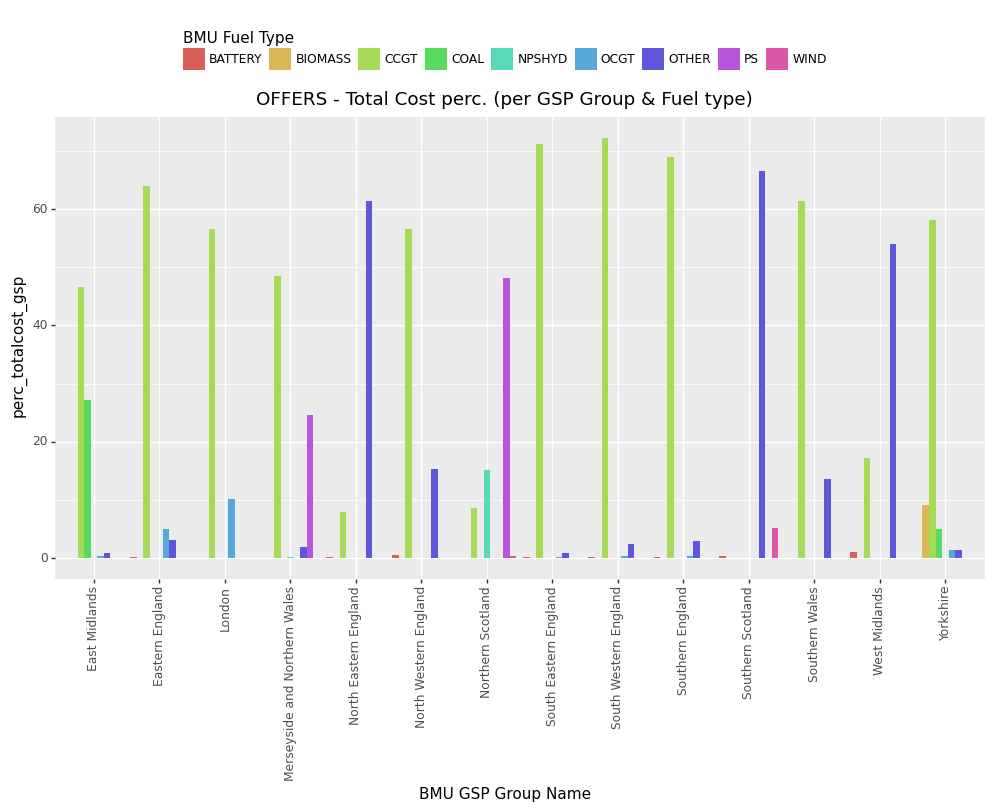

<ggplot: (8787118329838)>

In [166]:
(ggplot(summary_month) 
 + aes(x="BMU GSP Group Name", y="perc_totalcost_gsp", fill='BMU Fuel Type')
 + geom_bar(stat='summary', size=3, position='dodge')
 + ggtitle('OFFERS - Total Cost perc. (per GSP Group & Fuel type)')
 + guides(fill=guide_legend(nrow=1))
 + theme(axis_text_x=element_text(rotation=90))
 + theme(figure_size=(12, 6), legend_position='top', legend_box_spacing=.3)
 #+ facet_wrap("BMU GSP Group Name", ncol=1)
)

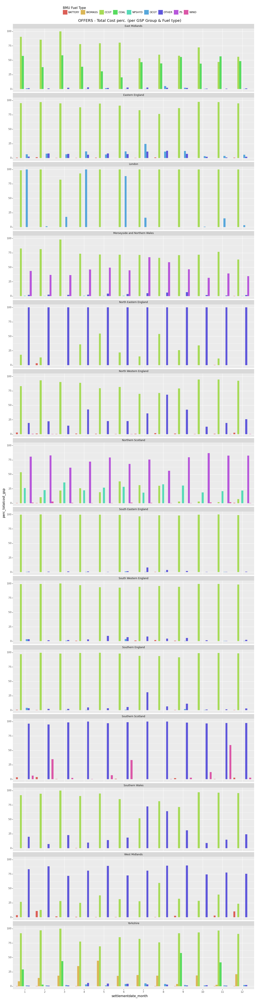

<ggplot: (8787135096562)>

In [167]:
(ggplot(summary_month) 
 + aes(x="settlementdate_month", y="perc_totalcost_gsp", fill='BMU Fuel Type')
 + geom_bar(stat='identity', size=3, position='dodge')
 + ggtitle('OFFERS - Total Cost perc. (per GSP Group & Fuel type)')
 + guides(fill=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

/usr/local/lib/python3.10/dist-packages/plotnine/facets/facet.py:446: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


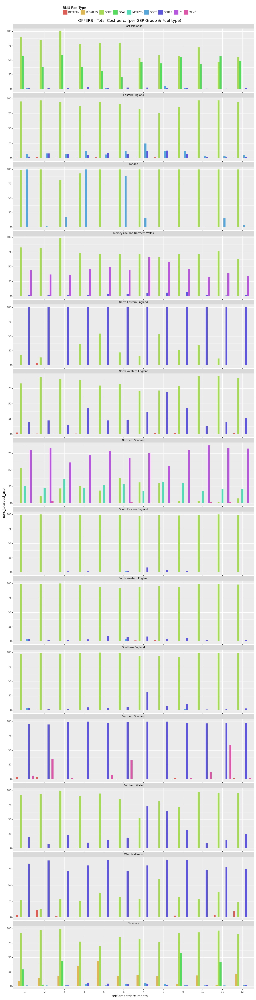

<ggplot: (8787108489165)>

In [168]:
(ggplot(summary_month) 
 + aes(x="settlementdate_month", y="perc_totalcost_gsp", fill='BMU Fuel Type')
 + geom_bar(stat='identity', size=3, position='dodge')
 + ggtitle('OFFERS - Total Cost perc. (per GSP Group & Fuel type)')
 + guides(fill=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=1, scales='free')
)

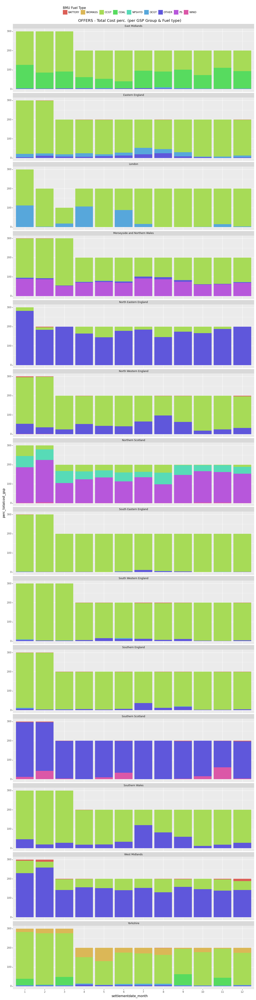

<ggplot: (8787134047572)>

In [169]:
(ggplot(summary_month) 
 + aes(x="settlementdate_month", y="perc_totalcost_gsp", fill='BMU Fuel Type')
 + geom_bar(stat='identity', size=3)
 + ggtitle('OFFERS - Total Cost perc. (per GSP Group & Fuel type)')
 + guides(fill=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

/usr/local/lib/python3.10/dist-packages/plotnine/facets/facet.py:446: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


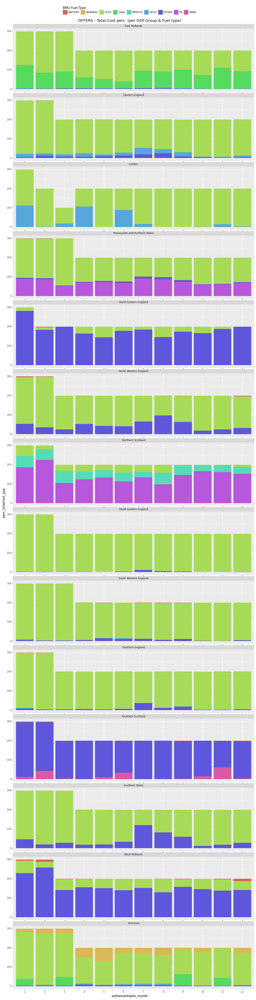

<ggplot: (8787108183007)>

In [170]:
(ggplot(summary_month) 
 + aes(x="settlementdate_month", y="perc_totalcost_gsp", fill='BMU Fuel Type')
 + geom_bar(stat='identity', size=3)
 + ggtitle('OFFERS - Total Cost perc. (per GSP Group & Fuel type)')
 + guides(fill=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=1, scales='free')
)

##### - GSP breakdown per month

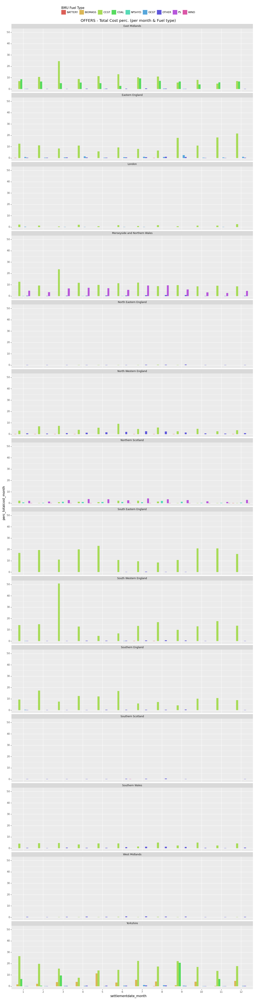

<ggplot: (8787118727706)>

In [171]:
(ggplot(summary_month) 
 + aes(x="settlementdate_month", y="perc_totalcost_month", fill='BMU Fuel Type')
 + geom_bar(stat='identity', size=3, position='dodge')
 + ggtitle('OFFERS - Total Cost perc. (per month & Fuel type)')
 + guides(fill=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

/usr/local/lib/python3.10/dist-packages/plotnine/facets/facet.py:446: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


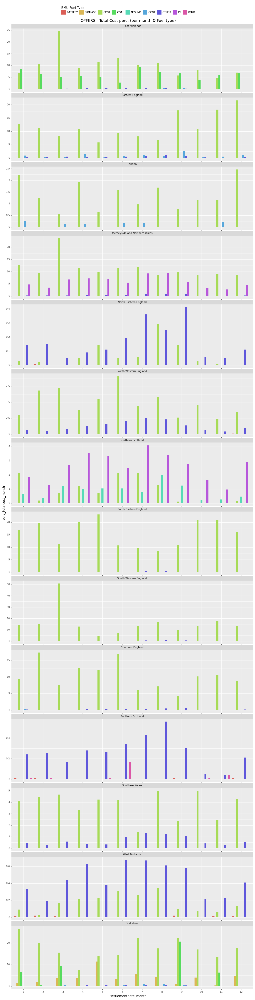

<ggplot: (8787107810112)>

In [172]:
(ggplot(summary_month) 
 + aes(x="settlementdate_month", y="perc_totalcost_month", fill='BMU Fuel Type')
 + geom_bar(stat='identity', size=3, position='dodge')
 + ggtitle('OFFERS - Total Cost perc. (per month & Fuel type)')
 + guides(fill=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=1, scales='free')
)

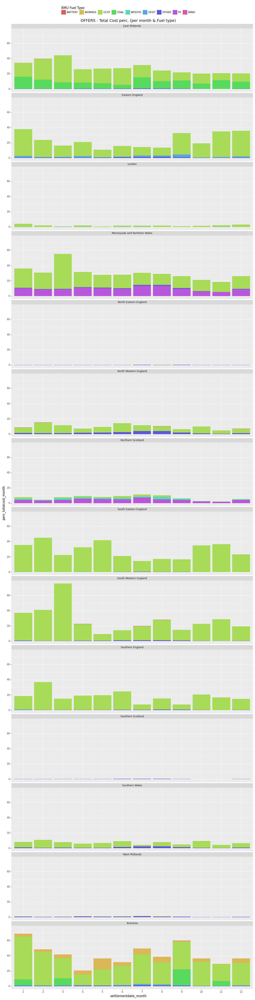

<ggplot: (8787125920537)>

In [173]:
(ggplot(summary_month) 
 + aes(x="settlementdate_month", y="perc_totalcost_month", fill='BMU Fuel Type')
 + geom_bar(stat='identity', size=3)
 + ggtitle('OFFERS - Total Cost perc. (per month & Fuel type)')
 + guides(fill=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=1)
)

/usr/local/lib/python3.10/dist-packages/plotnine/facets/facet.py:446: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


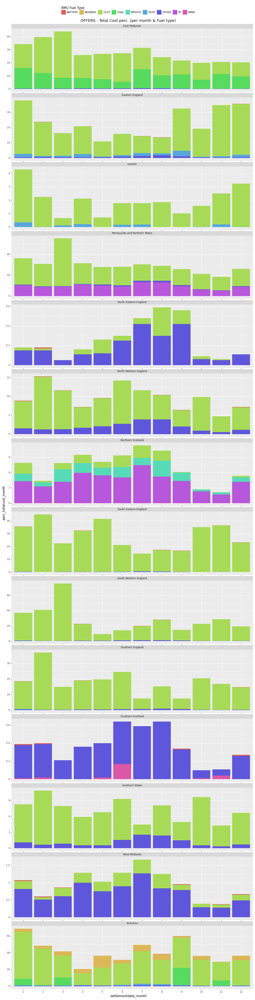

<ggplot: (8787117787064)>

In [174]:
(ggplot(summary_month) 
 + aes(x="settlementdate_month", y="perc_totalcost_month", fill='BMU Fuel Type')
 + geom_bar(stat='identity', size=3)
 + ggtitle('OFFERS - Total Cost perc. (per month & Fuel type)')
 + guides(fill=guide_legend(nrow=1))
 + theme(figure_size=(15, 60), legend_position='top', legend_box_spacing=.3)
 + facet_wrap("BMU GSP Group Name", ncol=1, scales='free')
)

#### 4. DISTRIBUCIÓN DE PC Status (POR ZONA)

Estacionalidad, Tendencia

- Por settlement period
- Por día
- Por semana
- Por mes

#### 5.1. VALORES MEDIOS, MÍNIMOS Y MÁXIMOS DE CAP. GENERACIÓN DE LAS BMUs (POR ZONA)

Estacionalidad, Tendencia

- Por settlement period
- Por día
- Por semana
- Por mes
- Por año

#### 5.2. VALORES MEDIOS, MÍNIMOS Y MÁXIMOS DE CAP. CONSUMO DE LAS BMUs (POR ZONA)

Estacionalidad, Tendencia

- Por settlement period
- Por día
- Por semana
- Por mes
- Por año

#### 5.3. VALORES MEDIOS, MÍNIMOS Y MÁXIMOS DE TLF DE LAS BMUs (POR ZONA)

Estacionalidad, Tendencia

- Por settlement period
- Por día
- Por semana
- Por mes
- Por año